# Part A: CA2 CIFAR10 Generative Adversarial Networks (GAN) Report/Analysis

## Name: Quah Johnnie
## Admin No: 2007476

<br>

## Intro:
This report provides an in-depth exploration of five different Generative Adversarial Network (GAN) models, utilizing advanced architectures and research of increasing complexity. I was able to improve upon my GAN models and achieve a final FID score of 7.98 and Inception Score of 8.79 while training with only the CIFAR10 dataset. The best model employed was a conditional BigGAN model, which incorporated an Exponential Moving Average for the generator, along with LeCam regularization, and differentiable augmentation on our dataset.
<br>

## Problem Statement: 
I am a graphics designer and have been hired by a video game company to design some non-copyrighted graphics they could use in their game or for advertisement. The company has provided me with a set of reference images from the CIFAR10 dataset, which consists of 60,000 32x32 images with 10 classes (airplane, automobile, bird, cat, deer, dog, frog, horse, ship, truck). Instead of using the CIFAR10 images as reference and creating new art, I tasked myself to use GANs to generate 1000 unique, high-quality, small color images inspired by the reference images (CIFAR10), but do not directly copy any of the images in the CIFAR10 dataset due to copyright issues (the actual CIFAR10 dataset is not copyrighted). This way I can easily generate art that I can use in the company.

- **The problem statement is fictional to furfill my tasks and requirements for this assignment. My main task for this assignment is to employ a GAN model to generate 1,000 small images using the CIFAR10 dataset. 🙂**

<br>

## Goals
- Goal 1: Create a GAN model using the CIFAR10 dataset and generate **1,000 high-quality images** (ideally 100 images from each class)
- Goal 2: Evaluate the generated images using appropriate metrics and methodologies.
- Goal 3: Make the accompanying notebook easy to read and understand for those with some programming or domain background (with the aim of making it educational for readers. 😊).

<br><br>


### <a id="content-table"></a>Notebook Table of Contents
<br>
Emoji Legend:

    📙 Main Heading
    📖 Subheading
    🤓 Research/Discussion
    🤖 GAN modeling/training
    🔬 GAN model evaluation/analysis
    
<br>
Headings & subheadings in content table are clickable (Please use them 🙂 - This report may be long)
<br><br>

| Description  | Headings | 
| --- | --- |
| <p style="color:blue;font-weight:bold;font-size:larger">📙 Imports & Configuration</p>| <p style="font-size:larger">[`0.0`](#0_0) |
| <p style="color:blue;font-weight:bold;font-size:larger">📙 Dataset Preparation, Simple Background Research & Data Exploration</p>| <p style="font-size:larger">[`1.0`](#1_0) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖 Dataset Preparation</p> | <p style="font-size:larger">[`1.1`](#1_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖 Overview of CIFAR10</p> | <p style="font-size:larger">[`1.2`](#1_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📙 Data Engineering, Background Research & Discussion</p>| <p style="font-size:larger">[`2.0`](#2_0) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Data Engineering: Data Concatenation etc.</p> | <p style="font-size:larger">[`2.1`](#2_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖 Research & Discussion: What to expect?</p> | <p style="font-size:larger">[`2.2`](#2_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Methods to evaluate GAN</p>| <p style="font-size:larger">[`2.2.1`](#2_2_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Expectations</p> | <p style="font-size:larger">[`2.2.2`](#2_2_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📙 GAN Application, Modelling & Evaluation</p> | <p style="font-size:larger">[`3.0`](#3_0) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖 First Simple DCGAN Model (1/5)</p> | <p style="font-size:larger">[`3.1`](#3_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤖 DCGAN Modelling</p> | <p style="font-size:larger">[`3.1.1`](#3_1_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤖 DCGAN Training</p> | <p style="font-size:larger">[`3.1.2`](#3_1_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🔬 DCGAN Evaluation & Analysis</p> | <p style="font-size:larger">[`3.1.3`](#3_1_3) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖 Adding conditionality to DCGAN (2/5)</p> | <p style="font-size:larger">[`3.2`](#3_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤖 cDCGAN Modelling</p> | <p style="font-size:larger">[`3.2.1`](#3_2_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤖 cDCGAN Training</p> | <p style="font-size:larger">[`3.2.2`](#3_2_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🔬 cDCGAN Evaluation & Analysis</p> | <p style="font-size:larger">[`3.2.3`](#3_2_3) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Research: What are the way to improve GANs? Complex Architectures & Methodologies</p> | <p style="font-size:larger">[`3.3`](#3_3)
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Selective Hyperparameters</p> | <p style="font-size:larger">[`3.3.1`](#3_3_1)
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Advanced Architectures & Methodologies</p> | <p style="font-size:larger">[`3.3.2`](#3_3_2)
| <p style="color:blue;font-weight:bold;font-size:larger">📖 cBigGan++ (5/5)</p> *see `experiments` folder to view all models & architectures tested* | <p style="font-size:larger">[`3.4`](#3_4) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤖 cBigGAN++ Modelling</p> | <p style="font-size:larger">[`3.4.1`](#3_4_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤖 cBigGAN++ Training</p> | <p style="font-size:larger">[`3.4.2`](#3_4_2) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🔬 cBigGAN++ Evaluation & Analysis</p> | <p style="font-size:larger">[`3.4.3`](#3_4_3) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🔬 All BigGAN FID & IS Computation (After Training)</p> | <p style="font-size:larger">[`3.4.4`](#3_4_4) |
| <p style="color:blue;font-weight:bold;font-size:larger">📙 Image Generation & Discussion</p> | <p style="font-size:larger">[`4.0`](#4_0) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖🤓 Selective Generation</p> | <p style="font-size:larger">[`4.1`](#4_1) |
| <p style="color:blue;font-weight:bold;font-size:larger">📖 Ending Note & Summary </p> | <p style="font-size:larger">[`4.2`](#4_2) |

<br><br>
    
<p style="text-align:center">cBigGAN & cBigGAN-LeCam are seperated in another folder, because code it is rather bulky (click link below to see*).</p>

<p style="text-align:center; text-decoration:underline;">Different Successful Ran Architectures/Experiments Tested</p>



Methods | Architecture Description | Methodology Description | Loss | FID | IS |
----- | ----- | -------- | --- | --- | --- | 
[Vanilla DCGAN](#3_1_2) | - | - | Binary Cross-entropy Loss | 36.1 | 6.24 |
[cDCGAN](#3_2_2) | - |  cBN | Binary Cross-entropy Loss | 32.3 | 6.72 |
<a href="./experiments/BigGAN.html" target="_blank">cBigGAN</a> | ATT, RES, PD | cBN, SN, O-SLS | Hinge Loss | 14.55 | 8.32 ± 0.088 | 
<a href="./experiments/BigGAN-LeCam.html" target="_blank">cBigGAN-LeCam</a> | ATT, RES, PD, LeCam, EMA | cBN, SN, O-SLS | Hinge Loss + Regularization Loss (LeCam) | 13.63 | 8.28 ± 0.081 | 
[<b>cBigGAN-LeCam-DiffAug</b>](#3_4_2) | <b>ATT, RES, PD, LeCam, EMA</b> | <b>cBN, SN, O-SLS, DiffA</b> | <b>Hinge Loss + Regularization Loss (LeCam)</b> | **7.98** | **8.79 ± 0.080** | 


(Architecture Legend:)<br>
<b>EMA</b>: Exponential Moving Average Used (Generator). <b>cBN</b> : conditional Batch Normalization. <b>SN</b>: Spectral Normalization. <b>ATT</b>: Attention Module Used. <b>RES</b> : ResNet Modules Used. <b>PD</b> : Projection Discriminator. <b>O-SLS</b>: One-sided label smoothing. <b>LeCam</b>: LeCam EMA/Regularization Used. <b>DiffA</b>: Differentiable Augmentation Used. <b>EMA</b>: Exponential Moving Average Used For Generator

**All code is original unless attributed**

# <a id="0_0"></a> 0.0: Imports & Configuration
<br>

- Downloading modules
- GPU Check/Config
- Importing Libraries
- Downloading CIFAR10 dataset


[Back to content table](#content-table)

Installing necessary packages
- [tqdm](https://github.com/tqdm/tqdm) -> Progress bar/UI for when I train my models
- [torchmetrics](https://torchmetrics.readthedocs.io/en/stable/)/[torch-fidelity](https://github.com/toshas/torch-fidelity) -> used to calculate FID, KID and IS scores
- [torch-summary](https://github.com/sksq96/pytorch-summary) -> Display information regarding model layer and parameters.
- [seaborn](https://github.com/mwaskom/seaborn) -> Library based on matplotlib. High-level interface for creating statistical graphics and complex visualizations.
- [imageio](https://github.com/imageio/imageio) -> Uesd to compile my training images into a GIF
- [wandb](https://github.com/wandb/wandb) (optional) -> Very useful ML analysis tool to keep track of different models, metrics and configurations. However, trying to force myself to use wandb in this assignment will make my assignment very messy and hard to mark, which I will be avoiding.

In [ ]:
%pip install -q tqdm
%pip install -q torch_fidelity
%pip install -q torchmetrics[image]
%pip install -q torch-summary
%pip install -q seaborn
%pip install -q imageio
# %pip install -q wandb

# Update matplotlib
%pip install -Uq matplotlib

In [1]:
!nvidia-smi -L

GPU 0: NVIDIA GeForce RTX 3080 (UUID: GPU-18434a51-961c-afe1-36ea-7a987b54f4a6)


In [2]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import imageio
from copy import deepcopy

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch_fidelity
from torchsummary import summary
import torch.optim as optim
from torch.utils import data
import torchvision.utils as vutils
from torch.autograd import Variable
from torch.nn.utils import spectral_norm
from torchvision import datasets, transforms
from torch.utils.data import Dataset, TensorDataset, DataLoader
from torchmetrics.image.inception import InceptionScore
from torchmetrics.image.fid import FrechetInceptionDistance

sns.set(style="ticks")

# Device configuration
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# <a id="1_0"></a> 1.0: Dataset Preparation & EDA & Data Understanding 🤓
<br>

Background research detailing the CIFAR10 dataset
### What's [CIFAR10](https://www.cs.toronto.edu/~kriz/cifar.html)?
CIFAR-10 is a dataset of 50,000 training images and 10,000 test images, each with a size of 32x32 pixels, labeled over 10 categories. There are 5,000 images per category for training and 1,000 images per category for testing. The dataset was developed by the Canadian Institute for Advanced Research (CIFAR) and released in 2009. The ten categories of CIFAR-10 are airplane, automobile, bird, cat, deer, dog, frog, horse, ship, and truck. The dataset is widely used as a benchmark for image classification algorithms and various data science tasks, such as GANs (for our use case).

[Back to content table](#content-table)

## <a id="1_1"></a>1.1: Dataset Preparation
- Downloading dataset via PyTorch API
- Transforming raw data into numpy for EDA


[Back to content table](#content-table)

In [3]:
training_data = datasets.CIFAR10(
    root="data",
    train=True,
    download=True,
    transform=transforms.ToTensor()
)
test_data = datasets.CIFAR10(
    root="data",
    train=False,
    download=True,
    transform=transforms.ToTensor()
)

Files already downloaded and verified
Files already downloaded and verified


In [4]:
class_labels = training_data.classes

train_loader = DataLoader(training_data, batch_size=len(training_data))
test_loader = DataLoader(test_data, batch_size=len(test_data))

train_data = torch.Tensor(next(iter(train_loader))[0].numpy())
test_data = torch.Tensor(next(iter(test_loader))[0].numpy())

train_label = torch.Tensor(next(iter(train_loader))[1].numpy())
test_label = torch.Tensor(next(iter(test_loader))[1].numpy())

del train_loader, test_loader, training_data

def img4np(tensor):
    tensor = np.swapaxes(tensor.numpy(),1,-1)
    return np.swapaxes(tensor,1,2)

train_data_np = img4np(train_data)
train_data_np.shape

(50000, 32, 32, 3)

## <a id="1_2"></a> 1.2: An overview of CIFAR10
- Distribution
- CIFAR10 at a glance
- 'Average' of each CIFAR10 class
- RGB Statistics 

[Back to content table](#content-table)

In [4]:
def plotDist(y_data,class_labels):
    class_count = ''
    labels, counts = np.unique(y_data, return_counts=True)
    c = 0
    for label, count in zip(labels, counts):
        c += 1
        class_count += f"{class_labels[int(label)]}: {count}, "
        if c % 5 ==0:
            class_count += '\n'
    print(class_count)
    fig, ax = plt.subplots()
    fig.set_size_inches(15, 4)
    g = sns.barplot(x=counts, y=class_labels, ax=ax, orientation="horizontal")
    ax.tick_params(axis='y', rotation=0, labelsize=20)
    g.tick_params(labelsize=20)
    plt.grid()
    plt.tight_layout()

airplane: 5000, automobile: 5000, bird: 5000, cat: 5000, deer: 5000, 
dog: 5000, frog: 5000, horse: 5000, ship: 5000, truck: 5000, 



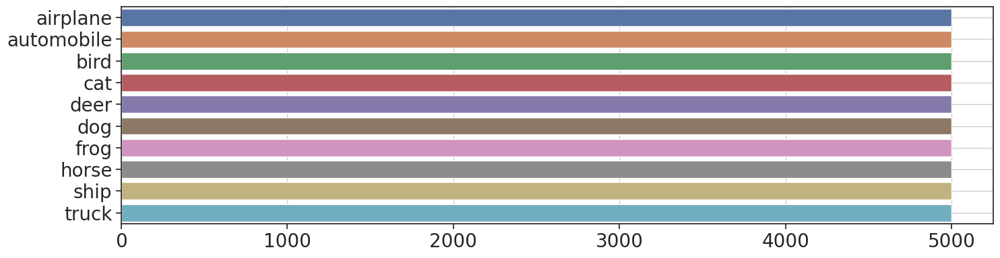

In [5]:
plotDist(train_label, class_labels)

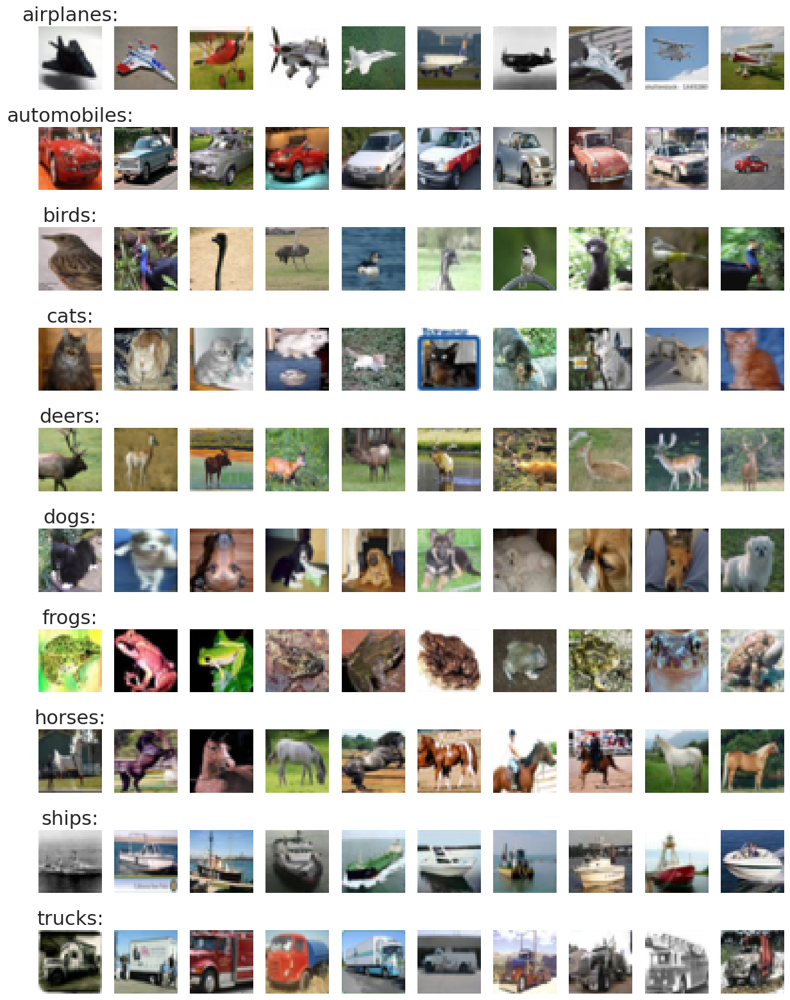

In [6]:
fig, ax = plt.subplots(10, 10, figsize=(15, 20))
for i in range(10):
    for j in range(10):
        label = class_labels[i]
        images = train_data_np[np.squeeze(train_label == i)]
        subplot = ax[i, j]
        subplot.axis("off")
        subplot.imshow(images[i+j])
        if j == 0:
            subplot.set_title(f"{label}s:", fontsize=22)
        else:
            pass

**Lets also take a look at the average of each class**

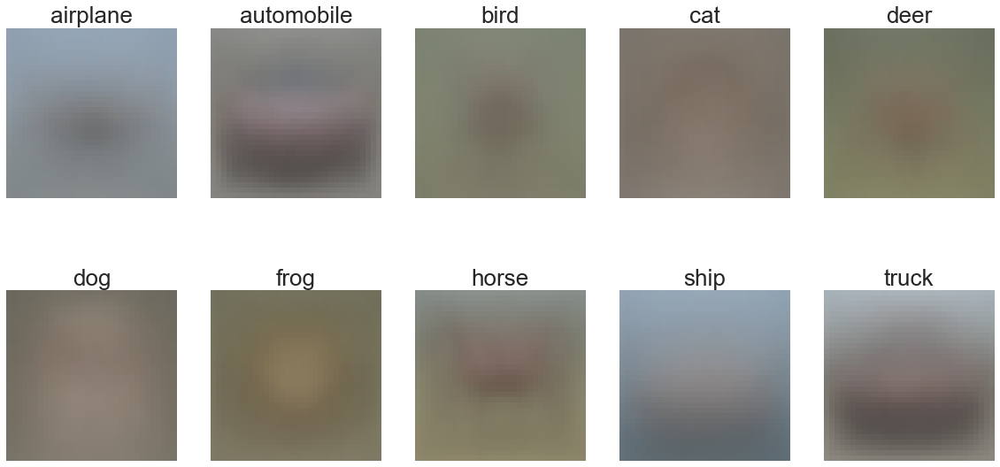

In [ ]:
fig, ax = plt.subplots(2, 5, figsize=(20, 10))
for i in range(2):
    for j in range(5):
        label = class_labels[i*5+j]
        avg_image = np.mean(train_data_np[np.squeeze(train_label == i*5+j)], axis=0)
        subplot = ax[i, j]
        subplot.axis("off")
        subplot.imshow(avg_image)
        subplot.set_title(label, fontsize=26)

### Observation: 
<br>
Looking at the average classes, there seem to be more obvious differences in backgrounds. Categories of wild animals seem to have a more green-ish background, which is attributed perhaps because of their habitat, and a brown-ish target around the center. Airplane and ship have a blue background and a dark-gray target around the center. Domestic animals/pets, such as dogs and cats, both look rather similar with a dark gray background and a lighter gray target at the center.<br><br>

It seems that the automobile (car), truck, and horse classes might also be less diverse since I am still able to make out the shape of the average automobile (car), truck and horse.

### Image Statistic
- RGB average
- pixel values

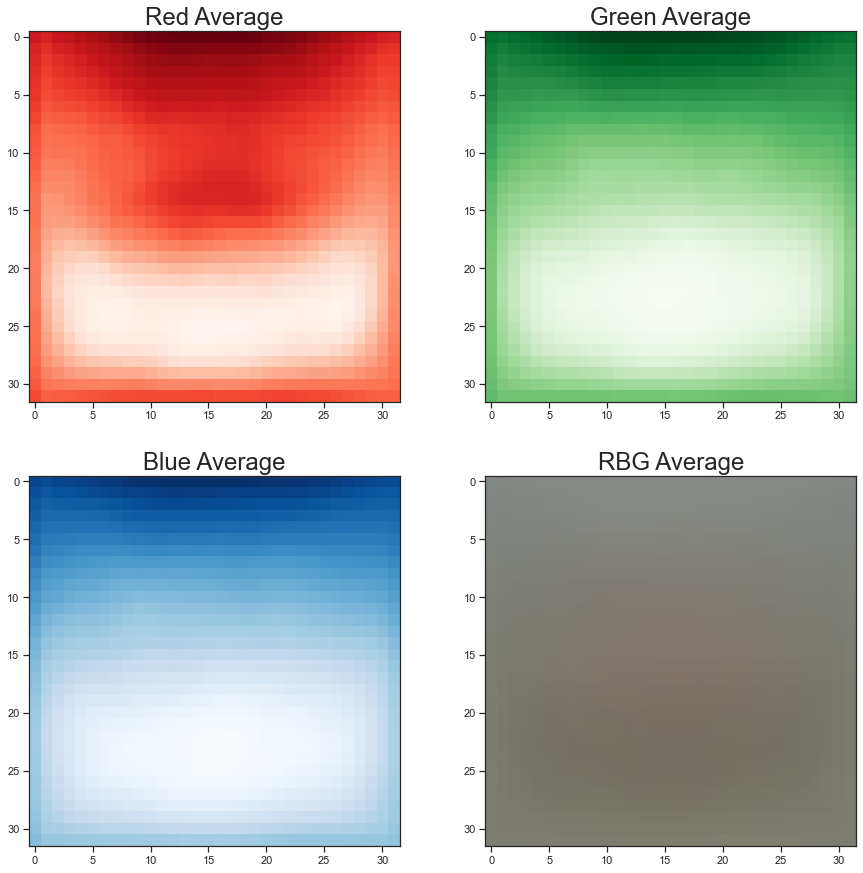

Red Pixel Sum:  25159664.0
Green Pixel Sum:  24686504.0
Blue Pixel Sum:  22862400.0


In [ ]:
fig, ax = plt.subplots(2, 2, figsize=(15, 15))  # Create a 2x2 subplot

# Plot the first image in the top left subplot
ax[0, 0].imshow(np.mean(train_data_np[:,:,:,0], axis=0),cmap=mpl.colormaps['Reds'])
ax[0, 0].set_title('Red Average', fontsize=24)

# Plot the second image in the top right subplot
ax[0, 1].imshow(np.mean(train_data_np[:,:,:,1], axis=0),cmap=mpl.colormaps['Greens'])
ax[0, 1].set_title('Green Average', fontsize=24)

# Plot the third image in the bottom left subplot
ax[1, 0].imshow(np.mean(train_data_np[:,:,:,2], axis=0),cmap=mpl.colormaps['Blues'])
ax[1, 0].set_title('Blue Average', fontsize=24)

# Plot the fourth image in the bottom right subplot
ax[1, 1].imshow(np.mean(train_data_np, axis=0))
ax[1, 1].set_title('RBG Average', fontsize=24)

plt.show()  # Display the plot

print('Red Pixel Sum: ' ,np.sum(train_data_np[:,:,:,0]))
print('Green Pixel Sum: ' ,np.sum(train_data_np[:,:,:,1]))
print('Blue Pixel Sum: ' ,np.sum(train_data_np[:,:,:,2]))

Observation: Most target in the image are concentrated in the middle and images are more red in colour on average. Green and Blue are perhaps more frequently present in the background as unlike red there is less pixel intensity around the center but more pixel intensity around the edges, especially towards the top of the image. RGB is rather gray with a hint of red/brown which is not unsurprising knowing that red is slightly more present than other colours.

**An autoencoder, tSNE & PCA analysis could be used to identify outliers in the dataset. However, since Data Exploration is not the main focus I will archive that idea**

# <a id="2_0"></a> 2.0: Data Engineering, Background Research & Discussion

- Discussion & More Research & Expectations during GAN modelling

## <a id="2_1"></a> 2.1: Data Engineering

- Normalization
-  Data Concatenation
- One Hot Encoding


[Back to content table](#content-table)

- Checking whether there is a need to normalize the dataset.

### Why normalize dataset before training? 🤓

The benefits of normalization in neural networks has been documented as early as 1997 by 2 researchers in Spain. Normalizing your dataset can make the training process faster and more stable by reducing the range of the data, and it can also improve the model's ability to generalize to new data by ensuring that the features are on a similar scale. If the features have very different scales, the model may have difficulty learning from them and normalizing the data can help prevent this [[J. Sola el at., 1997](https://ieeexplore.ieee.org/document/589532)].

In [5]:
print('Data min:',train_data.min())
print('Data max:',train_data.max())
print(train_data.shape,'\n\n')

Data min: tensor(0.)
Data max: tensor(1.)
torch.Size([50000, 3, 32, 32]) 




min-max scaling: <br>

${x'}$ = $\frac{x - min(x)}{max(x) - min(x)}$<br><br>

Seems like my dataset is already normalized from 0 to 1 <br>

*However, because I am using LeakyReLU as my activation function (LeakyReLU is used as to mitigate vanishing gradient), [-1, 1] normalization could be more useful than [0, 1]. The negative values that LeakyReLU takes into account from my -1 to 1 normalized data may be useful data for my neural network.<br><br>

**More indepth topics:**
- <ins>*Why LeakyReLU?*</ins> LeakyReLU is used instead of ReLU in some situations to address the problem of "dying ReLU" neurons. This problem happens when during training, if the input is negative the output will be zero, which means that the gradient during backpropagation will also be zero (thanks to ReLU's activation formula where anything negative = 0) and the weights will not be updated as such. LeakyReLU addresses this problem by allowing a small, non-zero gradient for negative input values, which keeps the gradients from going to zero, mitigating the "dying ReLU" problem [[Xu et al., 2015](https://arxiv.org/abs/1505.00853)]. In fact, LeakyReLU is only commonly used in less complex discriminators of GANs, many complex modern GANs actually use normal ReLU or even GeLU since they make use of ResNet blocks to skip connections. Hence, the "dying ReLU" neurons are no longer an issue.

<br>

To convert my 0 to 1 normalized data to -1 to 1 normalized data, I can just simply do `data = data * 2 - 1`, this will change the range and scale of min 0 max 1 [0,1] to min -1 max 1 [-1,1]. No rocket science needed :) 

In [6]:
#Multiply data by 2 and substract by 1
train_data_2 = torch.sub(torch.mul(train_data, 2), 1)
test_data_2 = torch.sub(torch.mul(test_data, 2), 1)

print('Data min:',train_data_2.min())
print('Data max:',train_data_2.max())

Data min: tensor(-1.)
Data max: tensor(1.)


Looks like its in the right scale

Data Concatenation (Combining train and test)

In [7]:
cifar10 = torch.cat((train_data_2, test_data_2),0)
cifar10_og = torch.cat((train_data, test_data),0)
cifar10_labels = torch.cat((train_label, test_label),0)

print('CIFAR10 Training Images (real) shape:', cifar10.shape)
print('CIFAR10 Class Labels shape:', cifar10_labels.shape)

del train_data, train_label, train_data_2, test_data_2

CIFAR10 Training Images (real) shape: torch.Size([60000, 3, 32, 32])
CIFAR10 Class Labels shape: torch.Size([60000])


## <a id="2_2"></a> 2.2: Research & Discussion

- 2.2.1: How do we evaluate GAN?
- 2.2.2: What to expect?
- 2.2.3: Improvement techniques


[Back to content table](#content-table)

### <a id="2_2_1"></a> 2.2.1: How do we evaluate GANs? 🤓
There are many metrics and methods to evaluate GAN models I will go through some of the more frequently used metrics/methods.

**Visual Inspection - Eye Power**: Visual inspection is a simple but subjective method for evaluating the quality of generated images from GANs. It involves looking at the generated images and determining if they look realistic. The idea behind this method is that if the generated images look similar to real images, then the GAN has likely learned a good representation of the data distribution.

However, visual inspection has a number of limitations, including:

- Subjectivity: Different people may have different opinions on what constitutes a "realistic" image, and this can lead to inconsistent results when evaluating different GAN models.

- Bias: A person inspecting the generated images might be biased towards certain attributes of the images, like color, shape, or texture, leading to an unfair evaluation.

That being said, visual inspection can be useful for quickly identifying the presence of serious problems with a GAN, like mode collapse or artifacts in the generated images. Additionally, when it is combined with other evaluation methods, it can help to provide a more complete picture of the quality of the generated images.
<br>

TLDR: Me see images, images look real, me like. But me can be subjective too
<br><br>
**Inception Score (IS) - Higher better**: The Inception Score (IS) is a method for evaluating the quality of generated images from GANs, which was introduced in the paper "Improved Techniques for Training GANs" by [Salimans et al.](https://arxiv.org/abs/1606.03498) in 2016. It is based on the idea that high-quality generated images should be both diverse and classifiable.

The IS uses an Inception-v3 model, a pre-trained image classification model, to classify the generated images and calculate the KL-divergence between the conditional class label distribution p(y|x) and the marginal class label distribution p(y) from the real data (pretrained). A higher IS indicates that the generated images are of higher quality, as it suggests that the model is generating a wide range of diverse, yet realistic images that are similar to the real images.
<img src="https://miro.medium.com/max/4800/1*hPEJY3MkOZyKFA6yEqzuyg.webp" width="750" alt='KL divergence illustration'>
<img src="https://miro.medium.com/max/4800/1*23gj_d3dxfm5FoKae_pc5Q.webp" width="600" alt='IS illustration1'>
<img src="https://miro.medium.com/max/4800/1*xLq69Oj6_4NRZoWleg9K_Q.webp" width="650" alt='IS illustration2'><br>
<br>

To calculate the IS, the generated images are passed through the Inception-v3 model, which produces a set of class label probabilities for each image. The IS is then calculated as:
$$IS = \exp\left(E_{x}[KL(p(y|x) || p(y))]\right)$$
But calculating inception score in Python is simplier 🙂, simply use `InceptionScore` from `torchmetrics` and update it with the generated fake images [can be very time consuming], reset the model after computing our IS.<br><br>
[Resources: [Inception Score Explained](https://medium.com/octavian-ai/a-simple-explanation-of-the-inception-score-372dff6a8c7a)]
<br>

TLDR: Higher IS means more diversity and realism.
<br><br>
**Fréchet Inception Distance (FID) - Lower better**: Fréchet Inception Distance (FID) is a method for evaluating the similarity between two sets of images. It was introduced in the 2017 paper "Inception-v4, Inception-ResNet and the Impact of Residual Connections on Learning" by [Christian Szegedy, et al](https://arxiv.org/abs/1602.07261).

FID is based on the Inception architecture, a deep convolutional neural network that has been trained to classify images. The idea behind FID is to compare the activations of the Inception network when fed the two sets of images that are being compared. The activations are a compact representation of the images, capturing features such as texture and shape.
<img src="https://machinelearningmastery.com/wp-content/uploads/2019/06/Example-of-How-Increased-Distortion-of-an-Image-Correlates-with-High-FID-Score.png" width="650" alt='FID illustration'><br>


To compute the FID score between two sets of images, the activations of the Inception network are first computed for each set. The activations are then treated as high-dimensional Gaussian distributions, and the Fréchet distance is calculated between the two distributions. The Fréchet distance is a measure of the similarity between the two distributions, with a smaller distance indicating that the two sets of images are more similar.

To compute the FID score in Python simply use `FID` from `torchmetrics`, update the `FID` inception model with the 60K real images first and cache it, so I do not have to update the model with the same 60K real images every time. When I want to calculate the FID (perhaps every few epochs) I can update the model with the generated images and compute the FID score that way, reset fake images after calculating FID. Calculating FID can be time consuming as well.<br><br>
[Resources: [Fréchet Inception Distance explained](https://machinelearningmastery.com/how-to-implement-the-frechet-inception-distance-fid-from-scratch/)]

<br>
TLDR: Lower FID better image quality, better representation of real image.
<br><br>

<ins>I will be using FID and IS as my 2 main metrics to evaluate my GAN models. FID (primary) | IS (secondary). Other metrics such as loss, accuracy, etc. will be recorded as well.</ins>
<br>

**Summary & Choice of metrics I am using:**<br>

Both Fréchet Inception Distance (FID) and Inception Score (IS) are popular methods for evaluating the performance of generative models, such as Generative Adversarial Networks (GANs), but they have different strengths and weaknesses.

FID is a measure of the similarity between real and generated images, based on the activations of the Inception network. It is sensitive to the quality of the generated images and is considered to be a good metric for detecting mode collapse, a problem where a GAN generates only a limited number of diverse samples.

Inception Score, on the other hand, is a measure of the diversity and realism of the generated images. It is based on the Inception network's ability to classify the images into different classes. It is considered to be a good metric for detecting overfitting, where a GAN is generating images that are too similar to the training set and not generalizing well.

Using FID alone may not be sufficient to evaluate the overall performance of a GAN, as it only takes into account the quality of the generated images and not their diversity. Likewise, using IS alone may not be adequate either as it only focus on how well the generated samples fit on the real image distribution without assessing the image quality. Therefore, using both FID and IS together provides a more complete evaluation of the performance of a GAN.

By using both FID and IS, we can get a better sense of how well the GAN is performing overall, by assessing the quality and diversity of the generated images. Together, these metrics help to overcome the limitations of using only one of them alone.

<hr>

There are many other popular and very useful methods to evaluate GAN models, below is a summary table of GAN metrics compiled and maintained by the contributors at [StudioGAN-Github](https://github.com/POSTECH-CVLab/PyTorch-StudioGAN).

| Method                             | Venue      | Architecture |
|------------------------------------|------------|--------------|
| Inception Score (IS)               | Neurips'16 | InceptionV3  |
| Frechet Inception Distance (FID)    | Neurips'17 | InceptionV3  |
| Intra-class FID                    | -          | InceptionV3  |
| Improved Precision & Recall        | Neurips'19 | InceptionV3  |
| Classifier Accuracy Score (CAS)     | Neurips'19 | InceptionV3  |
| Density & Coverage                 | ICML'20    | InceptionV3  |
| SwAV FID                           | ICLR'21    | SwAV         |
| Clean metrics (IS, FID, PRDC)      | CVPR'22    | InceptionV3  |
| Architecture-friendly metrics (IS, FID, PRDC) | arXiv'22   | Not limited to InceptionV3 |


[Back to content table](#content-table)

### <a id="2_2_2"></a>2.2.2: Expectations 🤓
- What are good IS or FID scores?

#### Initial simple FID & IS calculation
Calculating the ideal scores of FID, IS and KID to achieve when making my GAN model later. This is done by calculating the FID, IS and KID of the CIFAR10 training data with the test data CIFAR10 (train -> 50K samples, test -> 10K samples).<br><br>

[Documentation](https://torch-fidelity.readthedocs.io/en/latest/miscellaneous.html) of torch-fidelity: ISC and PPL are computed for input1 only, whereas FID and KID are computed between input1 and input2

- IS score is calculated with only CIFAR10-train (50K) but it should be a good enough estimation<br><br>

*More thorough calculation and analysis will be done during final GAN evaluation*


[Back to content table](#content-table)

In [ ]:
metrics = torch_fidelity.calculate_metrics(
    input1='cifar10-train',
    input2='cifar10-val',
    cuda=True,
    isc=True,
    fid=True,
    kid=True
),

Creating feature extractor "inception-v3-compat" with features ['logits_unbiased', '2048']
Extracting features from input1
Loading cached C:\Users\quahj/.cache\torch\fidelity_cache\cifar10-train-inception-v3-compat-features-logits_unbiased.pt
Loading cached C:\Users\quahj/.cache\torch\fidelity_cache\cifar10-train-inception-v3-compat-features-2048.pt
Extracting features from input2
Loading cached C:\Users\quahj/.cache\torch\fidelity_cache\cifar10-val-inception-v3-compat-features-logits_unbiased.pt
Loading cached C:\Users\quahj/.cache\torch\fidelity_cache\cifar10-val-inception-v3-compat-features-2048.pt
Inception Score: 11.245384977461828 ± 0.09534806632552836
Loading cached C:\Users\quahj/.cache\torch\fidelity_cache\cifar10-train-inception-v3-compat-stat-fid-2048.pt
Loading cached C:\Users\quahj/.cache\torch\fidelity_cache\cifar10-val-inception-v3-compat-stat-fid-2048.pt
Frechet Inception Distance: 3.151649270087546
Kernel Inception Distance: -1.4866806806810295e-05 ± 0.0001062247128183

In [ ]:
print(metrics)

({'inception_score_mean': 11.245384977461828, 'inception_score_std': 0.09534806632552836, 'frechet_inception_distance': 3.151649270087546, 'kernel_inception_distance_mean': -1.4866806806810295e-05, 'kernel_inception_distance_std': 0.00010622471281834084},)


From simple calculation with CIFAR10 train and test samples I get the following result:

| Description | IS (Theoretical Best) | FID (Ideal) | 
| --- | --- | --- |
| Train(50K) vs Val(10K) | 11.24 | 3.15 |

*Inception Score calculated is close to the theoretical best, while FID lowest is 0*

Since I am using only 50K training comparing to 10K testing when calculating FID, The calculated FID will relatively high for using real images as a comparison. Since I am using 50K real images to calculate IS, the Inception Score I calculated is very close to the theoretical best with the current dataset I have.<br>

<ins>Now lets take a look at current state-of-the-art GAN models **[unconditioned]** - The table is maintained by StudioGAN from Open AI</ins>

<img src="https://raw.githubusercontent.com/POSTECH-CVLab/PyTorch-StudioGAN/master/docs/figures/Other_Benchmark.png" width="650" alt='GAN SOTA'>

[Source: [PyTorch-StudioGAN](https://github.com/POSTECH-CVLab/PyTorch-StudioGAN) - OpenAI]

<br>

**state-of-the-art conditional GAN models** (slightly worse performance compared to unconditioned GAN models):

| Ranking (IS) | Model | IS | FID | 
| --- | --- | --- | --- |
| 1 | StyleGAN2 + DiffAugment + D2D-CE | 10.51 | 2.26 |
| 2 | MIX-MHingeGAN | 10.51 | 2.26 |
| 3 | StyleGAN2-ADA | 10.21 | 3.6 |
| 4 | MHingeGAN | 10.14 | 7.5 |
| 5 | aw-BigGAN | 9.58 | 6.89 |
| 6 | BigGAN | 9.22 | 14.73 |
| 7 | aw-SN-GAN | 9 | 8.03 |
| 8 | Splitting GAN | 8.87 | - |

<br>

[Source: [Papers With Code - Conditional Image Generation CIFAR10](https://paperswithcode.com/sota/conditional-image-generation-on-cifar-10)]

<br>

After thorough research, looking at these values shock me...and I would be happy to obtain a IS around 7-8 and FID of 20 especially for a cGAN model.

# <a id="3_0"></a> 3.0: cGAN Application, Modelling & Evaluation

**Current workflow in 3.0 (except 3.3):**<br>

- Modelling
- Training
- Analysis

**What is GAN?**<br>
A Generative Adversarial Network (GAN) is a type of deep learning model that is used to generate new data that is similar to a given training dataset. It consists of two main components: a generator network and a discriminator network. The generator network is trained to generate new data that is similar to the training data, while the discriminator network is trained to distinguish between the generated data and the actual training data. These two networks are trained in an adversarial manner, where the generator tries to generate data that is similar to the training data, and the discriminator tries to correctly identify whether the data is real or generated.

**What is conditional GAN?**<br>
A variant of GAN is the Conditional GAN (cGAN), which is a type of GAN that can generate new data based on a specific condition or label. The generator network in a cGAN is trained to generate data that is conditioned on a specific label or class, and the discriminator network is trained to distinguish between the generated data and the actual training data for that specific label or class.

- With some expectations and new gain knowledge. Lets start our GAN journey by first making a simple GAN before researching and analysing many of the ways we can try to improve our current GAN.

[Back to content table](#content-table)

## <a id="3_1"></a> 3.1: Simple Unconditioned DCGAN (Baseline)

### <a id="3_1_1"></a> 3.1.1: DCGAN Modelling 🤖

Template is referenced from [PyTorch DCGAN official documentation](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html)

<br>

Through some trial and error I have decided on some hyperparameters that is decent and mode collaspe will not occur. 


[Back to content table](#content-table)

In [7]:
# Number of workers for dataloader
workers = 10

# Batch size during training
batch_size = 64

class_num = 10

cifar10_dataloader = DataLoader(TensorDataset(cifar10.type('torch.FloatTensor'),cifar10_labels.type('torch.LongTensor')),batch_size=batch_size,shuffle=True, num_workers=workers)

In [10]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [9]:
class Generator(nn.Module):
    def __init__(self, class_num=10, latent_dim=128,num_filters=144,channels=3):
        super().__init__()
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, num_filters * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(num_filters * 8),
            nn.ReLU(True),
            # state size. (num_filters*8) x 4 x 4
            nn.ConvTranspose2d(num_filters * 8, num_filters * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 4),
            nn.ReLU(True),
            # state size. (num_filters*4) x 16 x 16
            nn.ConvTranspose2d( num_filters * 4, num_filters * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( num_filters * 2, channels, 4, 2, 1, bias=False),
            nn.Tanh()
            
            # state size last layer. 3 x 32 x 32
        )
    
    def forward(self, img):
        return self.main(img)

In [10]:
class Discriminator(nn.Module):
    def __init__(self, num_filters=88, class_num=10,channels=3):
        super().__init__()   
        self.main = nn.Sequential(
            # input is 3 x 32 x 32
            nn.Conv2d(channels, num_filters, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (num_filters) x 16 x 16
            nn.Conv2d(num_filters, num_filters * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (num_filters*2) x 8 x 8
            nn.Conv2d(num_filters * 2, num_filters * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (num_filters*4) x 4 x 4
            nn.Conv2d(num_filters * 4, 1, 4, 2, 1, bias=False),
            # Value between 0 & 1
            nn.Sigmoid()
        )


    def forward(self, img):
        return self.main(img)

In [11]:
netD = Discriminator().to(device)
netG = Generator().to(device)
criterion = nn.BCELoss()

netD.apply(weights_init)
netG.apply(weights_init)


summary(netD)
summary(netG)

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─Conv2d: 2-1                       4,224
|    └─LeakyReLU: 2-2                    --
|    └─Conv2d: 2-3                       247,808
|    └─BatchNorm2d: 2-4                  352
|    └─LeakyReLU: 2-5                    --
|    └─Conv2d: 2-6                       991,232
|    └─BatchNorm2d: 2-7                  704
|    └─LeakyReLU: 2-8                    --
|    └─Conv2d: 2-9                       5,632
|    └─Sigmoid: 2-10                     --
Total params: 1,249,952
Trainable params: 1,249,952
Non-trainable params: 0
Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─ConvTranspose2d: 2-1              2,359,296
|    └─BatchNorm2d: 2-2                  2,304
|    └─ReLU: 2-3                         --
|    └─ConvTranspose2d: 2-4              10,616,832
|    └─BatchNorm2d: 2-5                  1,152
|    └─ReLU: 2-6                       

Layer (type:depth-idx)                   Param #
├─Sequential: 1-1                        --
|    └─ConvTranspose2d: 2-1              2,359,296
|    └─BatchNorm2d: 2-2                  2,304
|    └─ReLU: 2-3                         --
|    └─ConvTranspose2d: 2-4              10,616,832
|    └─BatchNorm2d: 2-5                  1,152
|    └─ReLU: 2-6                         --
|    └─ConvTranspose2d: 2-7              2,654,208
|    └─BatchNorm2d: 2-8                  576
|    └─ReLU: 2-9                         --
|    └─ConvTranspose2d: 2-10             13,824
|    └─Tanh: 2-11                        --
Total params: 15,648,192
Trainable params: 15,648,192
Non-trainable params: 0

Sometimes torchsummary prints the output twice, just ignore the extra printed summary.

#### Beta1 = 0.5 (Something I noticed during my research on conditional GAN code is that Beta1 = 0.5 or 0 are frequently used instead of the default 0.9)<br>

<br>
The default value for the beta1 parameter in the Adam optimizer is typically set to 0.9 normally. However, in the context of training GANs, a value of 0.5 or 0 is often used instead because it has been found to stabilize GAN training. This is likely because the Adam optimizer with a beta1 value of 0.9 tends to prioritize the "momentum" component of the update, which can cause oscillations in GAN training and make it more difficult for the generator and discriminator to converge. Lowering the beta1 value to 0.5 or 0 reduces the impact of the momentum component and helps stabilize the training process.<br>

Source: [Which Training Methods for GANs do actually Converge? - [Lars et al., 2018]](https://arxiv.org/abs/1801.04406)

In [ ]:
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=0.00009, weight_decay=0.0000001,betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, weight_decay=0.0000001,betas=(0.5, 0.999))

- FID comparison standard is with all 60K samples
- IS standard is done with 60K generated samples
- Following FID and IS standard I can directly compare my results to acadamic/technical papers' numbers without any problem. 
- If FID and IS scores are calculated at a subset it is not the comparable at same scale* (Generally if more data provided for the IS model, the higher the IS (so a subset will provide much lower IS score))

Lets update the FID inception model with real images first and cache it. (All 60K samples) This way I do not have to update the model with real images everytime I want to calculate the FID between real and fake images.

In [8]:
fid_model = FrechetInceptionDistance(feature=2048, normalize=True,reset_real_features=False).to(device)
for imgs, _ in tqdm(cifar10_dataloader):
        # plus 1 divide by 2 is to normalize back to 0 and 1
        fid_model.update(((imgs+1)/2).to(device), real=True)

100%|██████████| 938/938 [01:11<00:00, 13.03it/s]


In [ ]:
def train_GAN(dataloader=cifar10_dataloader,epochs=241,outputInterval=30,metricsInterval=8,criterion=criterion,fid_model=fid_model,netG=netG,netD=netD,z_dim=128):
    '''
    Parameters:
    dataloader -> Dataloader of dataset
    epochs -> Number of epochs for the training loop
    outputInterval -> Display output of model training every <outputInterval> epochs
    metricsInterval -> Calculate FID & IS every <metricsInterval> epoch
    inceptionBatchSize -> Batch size of images for InceptionV3 model when calculating FID and IS.
    netG -> Generator
    netD -> Discriminator
    '''
    is_model = InceptionScore(normalize=True).to(device)
    metrics = []
    metrics_main = []
    images = []
    # Training loop
    for epoch in range(epochs):
        netG.train()
        for i, (imgs, labels) in enumerate(tqdm(dataloader, disable=True if epoch % outputInterval != 0 else False, desc='Epoch {}'.format(epoch+1))):
            imgs, labels = imgs.to(device), labels.to(device)

            # Generate fake images
            z = torch.randn(imgs.shape[0], z_dim, 1, 1, device=device)
            fake_imgs = netG(z).to(device)

            # Train discriminator
            netD.zero_grad()
            real_output = netD(imgs)
            fake_output = netD(fake_imgs)
            real_loss = criterion(real_output, torch.ones_like(real_output))
            fake_loss = criterion(fake_output, torch.zeros_like(fake_output))
            disc_loss = real_loss + fake_loss
            disc_loss.backward(retain_graph=True)
            optimizerD.step()

            # Train generator
            netG.zero_grad()
            fake_output = netD(fake_imgs)
            gen_loss = criterion(fake_output, torch.ones_like(fake_output))
            gen_loss.backward(retain_graph=True)
            optimizerG.step()
        if epoch % outputInterval == 0:
            # Print generator and discriminator loss
            print("Generator Loss:", gen_loss.item())
            print("Discriminator Loss:", disc_loss.item())
            real_acc = (real_output > 0.5).float().mean()
            fake_acc = (fake_output < 0.5).float().mean()
            print("Real Images Accuracy: {:.2f}%".format(real_acc.item()*100))
            print("Fake Images Accuracy: {:.2f}%".format(fake_acc.item()*100))
            # Print fake images and class labels
            fig, axs = plt.subplots(4, 8, figsize=(16, 8))
            fig.suptitle(f"Fake Images with Class Labels | Epoch {epoch+1}")
            fig.tight_layout(rect=[0, 0.03, 1, 0.95])

            for i in range(32):
                row, col = i // 8, i % 8
                axs[row, col].axis("off")
                axs[row, col].imshow((fake_imgs[i].detach().cpu().permute(1, 2, 0)+1)/2)
                x_center = (axs[row, col].get_xlim()[1] - axs[row, col].get_xlim()[0])/2 + axs[row, col].get_xlim()[0]

            # Save the current figure as a PNG image
            plt.savefig("images/training/fake_images_{}.png".format(epoch), bbox_inches='tight')
            plt.show()
            
            metrics.append([epoch+1, disc_loss.item(), gen_loss.item(), real_acc.item(), fake_acc.item()])
            
            # Append the image to the list
            images.append(imageio.imread("images/training/fake_images_{}.png".format(epoch)))
            
        #Where IS & FID are recorded every metricsInterval
        if epoch % metricsInterval == 0 and metricsInterval != 0:
            netG.eval()
            fid_model.reset()
            is_model.reset()
            
            #The 2 Inception models (2048 features) alone takes up about 16GB VRAM...
            for imgs, _ in dataloader:
                imgs = imgs.to(device)
                z = torch.randn(imgs.shape[0], z_dim, 1, 1, device=device)
                fake_imgs = ((netG(z)+1)/2).to(device)
                is_model.update(fake_imgs)
                fid_model.update(fake_imgs, real=False)
            IS = float(is_model.compute()[0])
            FID = float(fid_model.compute())
            metrics_main.append([epoch+1,IS,FID])
            print(f'Epoch {epoch+1}: FID {FID:.4f} | IS {IS:.4f}')
        # Create a GIF using the images in the list
    imageio.mimsave("images/training/fake_images.gif", images, fps=2)
    # return metrics in pd
    return pd.DataFrame(metrics, columns=["epoch", "disc_loss", "gen_loss", "real_acc", "fake_acc"]), pd.DataFrame(metrics_main, columns=["epoch","IS", "FID"])

### <a id="3_1_2"></a> 3.1.2: DCGAN Training 🤖

- <a id="train01_dcgan"></a>[Click to skip training](#skip01_dcgan)

<br>

[Back to content table](#content-table)

/opt/conda/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
Epoch 1: 100%|██████████| 469/469 [00:32<00:00, 14.46it/s]


Generator Loss: 0.7382858991622925
Discriminator Loss: 1.394087314605713
Real Images Accuracy: 13.02%
Fake Images Accuracy: 86.20%


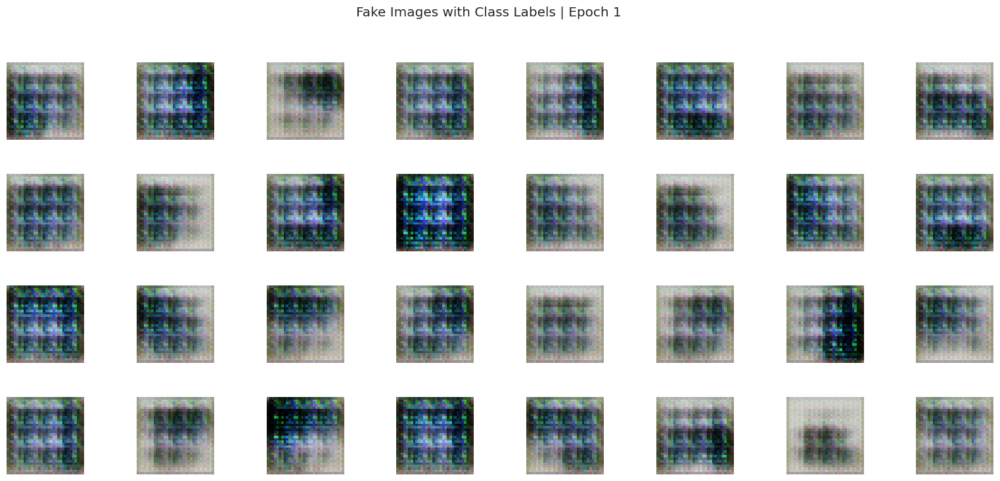

Epoch 1: FID 317.8502 | IS 1.8614
Epoch 11: FID 244.9214 | IS 1.8427
Epoch 21: FID 127.8563 | IS 2.9482


Epoch 26: 100%|██████████| 469/469 [00:33<00:00, 13.98it/s]


Generator Loss: 0.8374255895614624
Discriminator Loss: 1.4080040454864502
Real Images Accuracy: 27.08%
Fake Images Accuracy: 87.24%


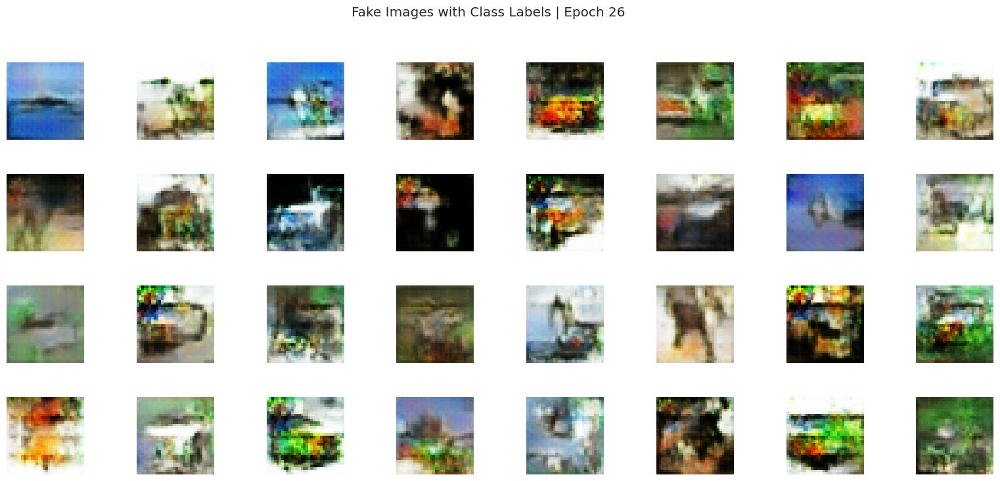

Epoch 31: FID 88.6411 | IS 3.9813
Epoch 41: FID 68.5422 | IS 4.6691


Epoch 51: 100%|██████████| 469/469 [00:32<00:00, 14.64it/s]


Generator Loss: 0.7441024780273438
Discriminator Loss: 1.3895357847213745
Real Images Accuracy: 33.59%
Fake Images Accuracy: 82.03%


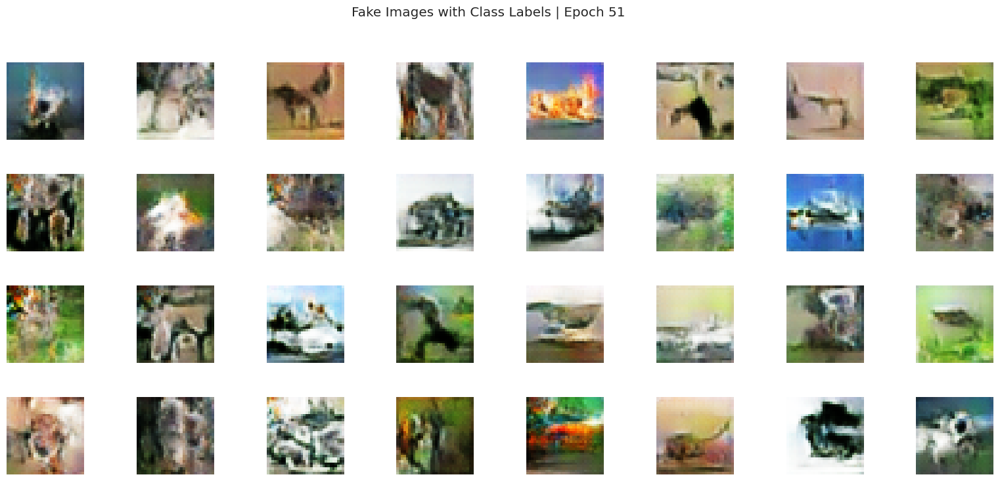

Epoch 51: FID 63.2677 | IS 4.5283
Epoch 61: FID 56.1195 | IS 5.0932
Epoch 71: FID 54.6249 | IS 4.8927


Epoch 76: 100%|██████████| 469/469 [00:32<00:00, 14.35it/s]


Generator Loss: 0.7192007899284363
Discriminator Loss: 1.373612880706787
Real Images Accuracy: 43.49%
Fake Images Accuracy: 69.27%


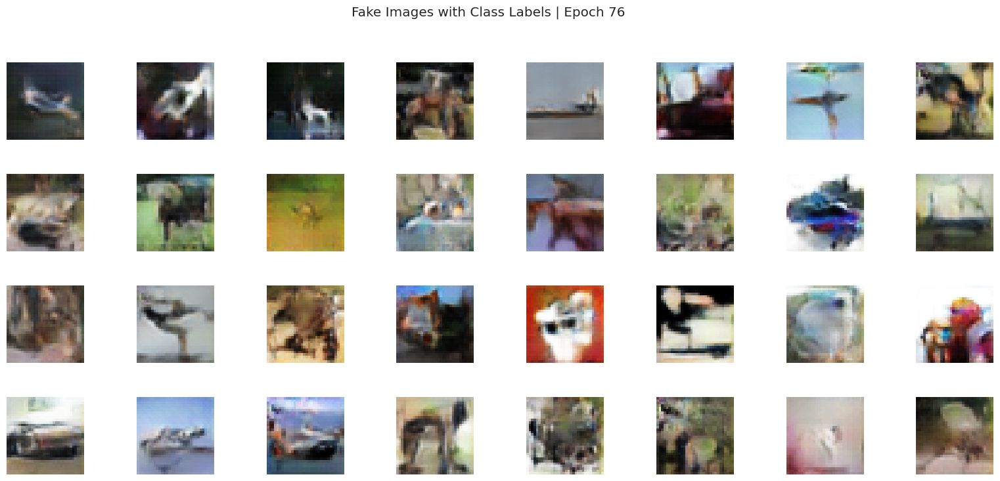

Epoch 81: FID 52.3582 | IS 5.1927
Epoch 91: FID 49.3149 | IS 5.7344


Epoch 101: 100%|██████████| 469/469 [00:32<00:00, 14.23it/s]


Generator Loss: 0.7769943475723267
Discriminator Loss: 1.4109768867492676
Real Images Accuracy: 21.88%
Fake Images Accuracy: 89.84%


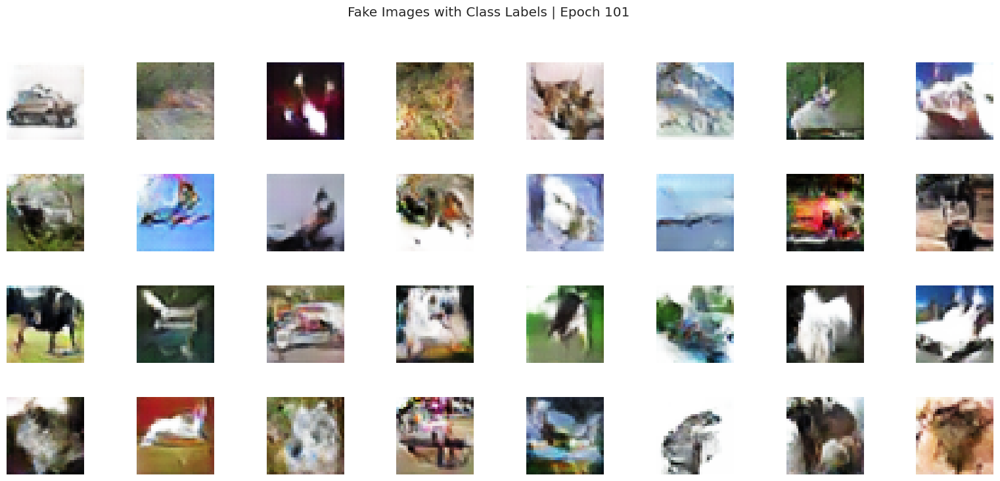

Epoch 101: FID 46.3872 | IS 5.7789
Epoch 111: FID 42.3208 | IS 5.7447
Epoch 121: FID 43.0420 | IS 5.7810


Epoch 126: 100%|██████████| 469/469 [00:32<00:00, 14.23it/s]


Generator Loss: 0.740888774394989
Discriminator Loss: 1.3577992916107178
Real Images Accuracy: 50.52%
Fake Images Accuracy: 73.96%


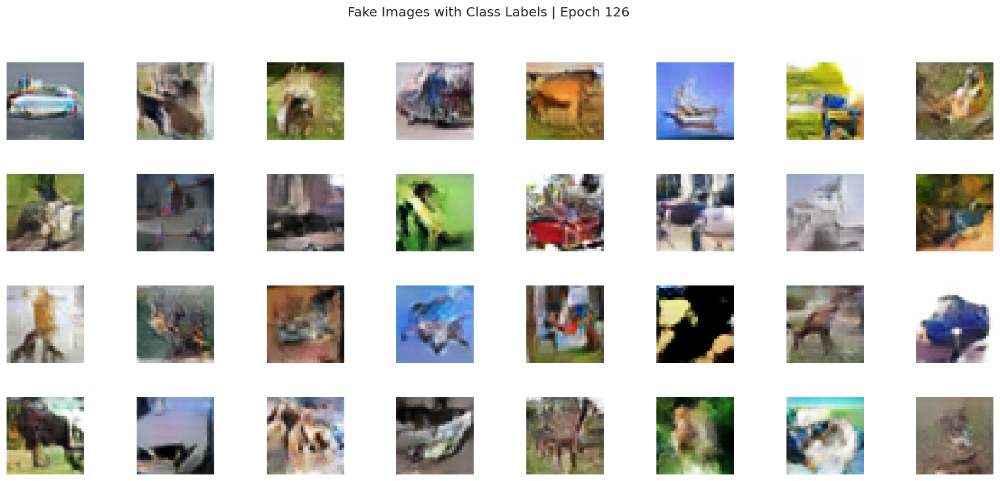

Epoch 131: FID 42.6654 | IS 5.7797
Epoch 141: FID 40.9075 | IS 5.8818


Epoch 151: 100%|██████████| 469/469 [00:31<00:00, 14.77it/s]


Generator Loss: 0.7545868754386902
Discriminator Loss: 1.3659344911575317
Real Images Accuracy: 48.70%
Fake Images Accuracy: 69.53%


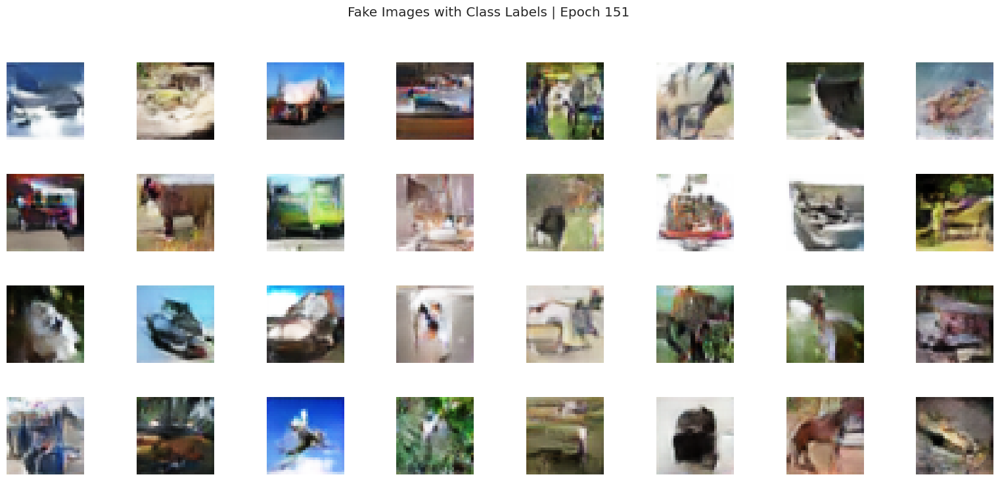

Epoch 151: FID 38.7981 | IS 5.9650
Epoch 161: FID 37.6046 | IS 5.9686
Epoch 171: FID 36.6497 | IS 6.1557


Epoch 176: 100%|██████████| 469/469 [00:32<00:00, 14.27it/s]


Generator Loss: 0.7840131521224976
Discriminator Loss: 1.3545016050338745
Real Images Accuracy: 43.49%
Fake Images Accuracy: 68.49%


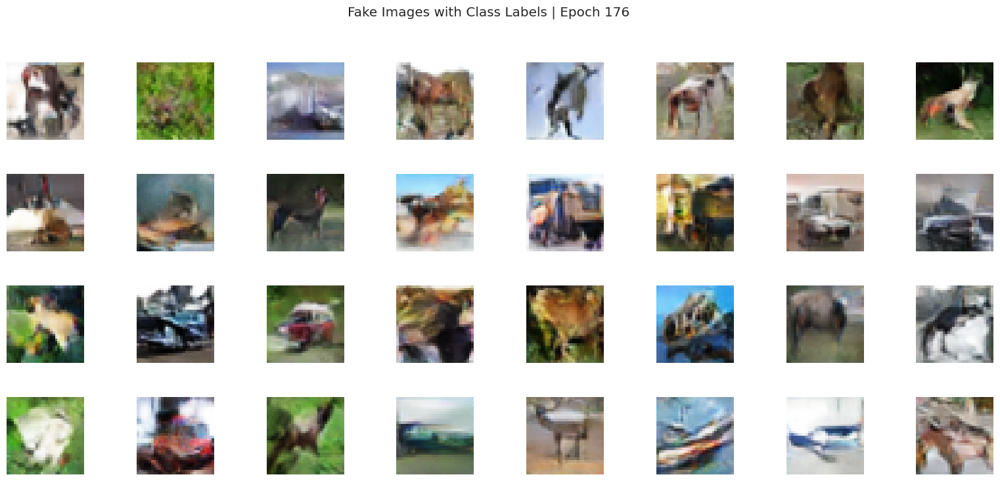

Epoch 181: FID 36.7093 | IS 6.0654
Epoch 191: FID 36.2070 | IS 6.2392


Epoch 201: 100%|██████████| 469/469 [00:31<00:00, 14.72it/s]


Generator Loss: 0.9592058062553406
Discriminator Loss: 1.3335158824920654
Real Images Accuracy: 49.22%
Fake Images Accuracy: 81.77%


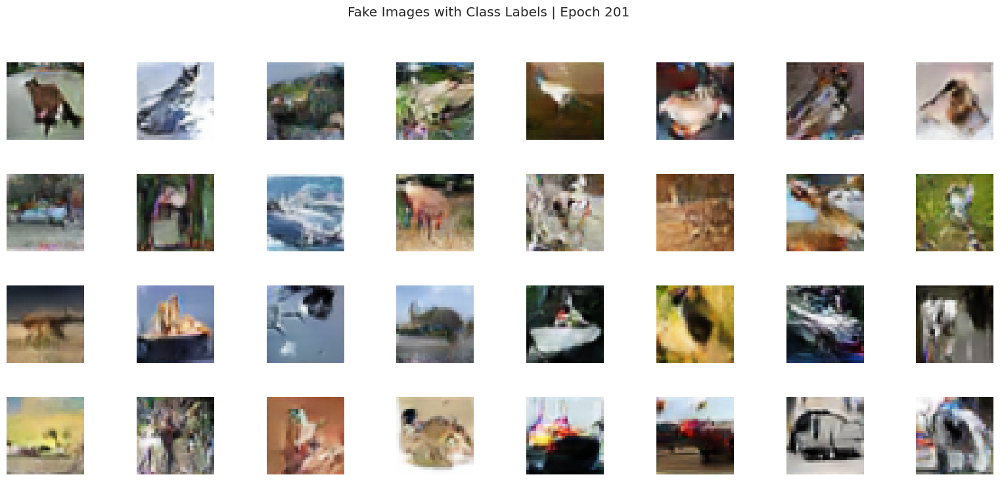

Epoch 201: FID 37.8855 | IS 6.1223
Epoch 211: FID 38.0472 | IS 6.0336
Epoch 221: FID 36.1076 | IS 6.1728


Epoch 226: 100%|██████████| 469/469 [00:31<00:00, 14.73it/s]


Generator Loss: 1.1068353652954102
Discriminator Loss: 1.1288199424743652
Real Images Accuracy: 62.76%
Fake Images Accuracy: 88.54%


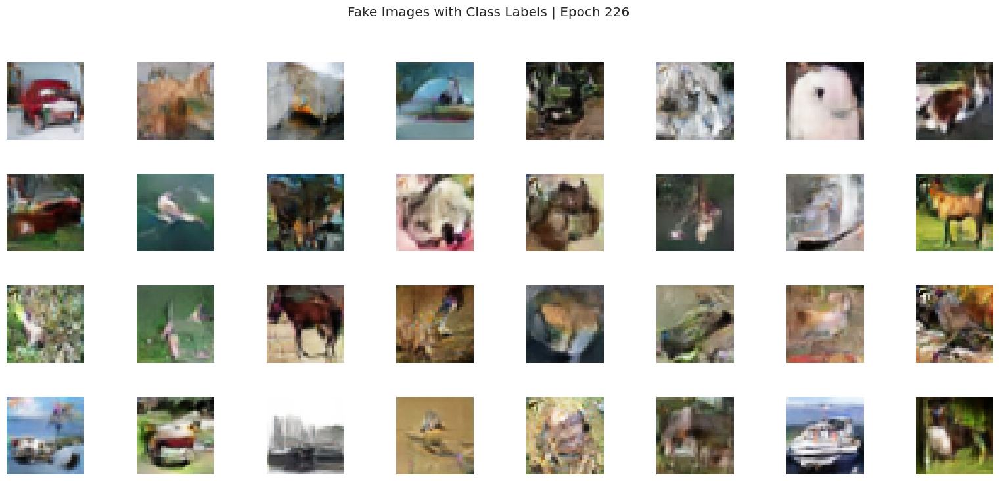

Epoch 231: FID 37.4097 | IS 6.1670
Epoch 241: FID 37.4302 | IS 6.2296


Epoch 251: 100%|██████████| 469/469 [00:31<00:00, 14.73it/s]


Generator Loss: 1.1339796781539917
Discriminator Loss: 1.046378254890442
Real Images Accuracy: 63.54%
Fake Images Accuracy: 84.11%


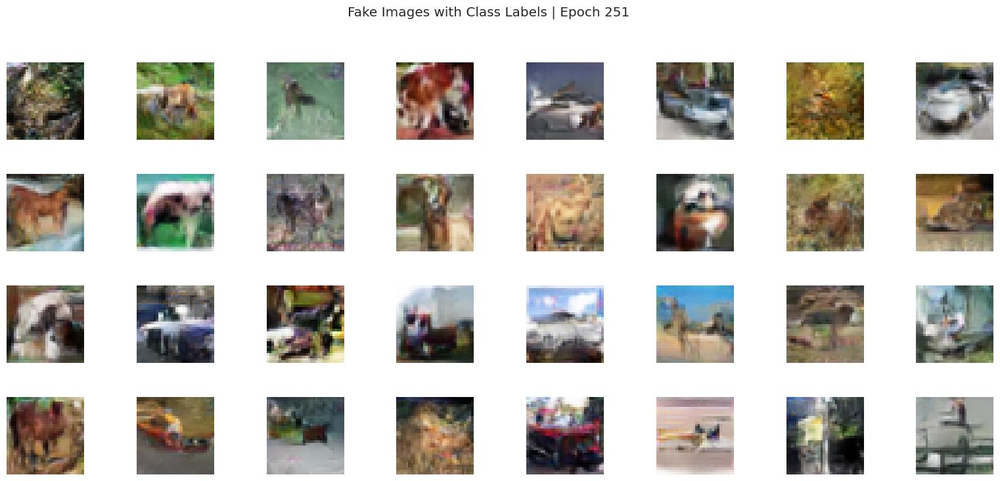

Epoch 251: FID 38.6669 | IS 6.0711


In [15]:
metrics, metrics_main = train_GAN(dataloader=cifar10_dataloader,epochs=251,outputInterval=25,metricsInterval=10,fid_model=fid_model,netG=netG,netD=netD,z_dim=128)

This cell can be omitted* Only for saving/loading model

In [ ]:
#Saving model weights - Discriminator & Generator
torch.save(netG.state_dict(), "models/DCGAN-G.pt")
torch.save(netD.state_dict(), "models/DCGAN-D.pt")

In [7]:
def plot_metrics(metrics, metrics_main):
    # Create the figure and subplots
    fig, axs = plt.subplots(2, 2, figsize=(15,12))

    # Discriminator vs Generator Loss Graph
    sns.lineplot(data=metrics, x="epoch", y="disc_loss", label="Discriminator Loss", ax=axs[0,0])
    sns.lineplot(data=metrics, x="epoch", y="gen_loss", label="Generator Loss", ax=axs[0,0])
    axs[0,0].set_title("Discriminator vs Generator Loss Graph")
    axs[0,0].legend()
    axs[0,0].set(ylabel='Loss')

    # Discriminator Real/Fake Accuracy Graph
    sns.lineplot(data=metrics, x="epoch", y=metrics["real_acc"] * 100, label="Real Accuracy", ax=axs[0,1])
    sns.lineplot(data=metrics, x="epoch", y=metrics["fake_acc"] * 100, label="Fake Accuracy", ax=axs[0,1])
    axs[0,1].set_title("Discriminator Real/Fake Accuracy Graph")
    axs[0,1].legend()
    axs[0,1].set(ylabel='Accuracy(%)')
    axs[0,1].set_ylim(0, 100)

    # Inception Score Graph
    sns.lineplot(data=metrics_main, x="epoch", y="IS", label="Inception Score", color='green', ax=axs[1,0])
    max_val = metrics_main["IS"].max()
    max_index = metrics_main["epoch"][metrics_main["IS"].idxmax()]
    axs[1,0].set_title(f"Inception Score Graph - Best epoch {max_index} | Best IS {max_val:.4f}")
    axs[1,0].set(ylabel='Inception Score')
    axs[1,0].legend().remove()
    axs[1,0].axhline(y=max_val, color='r', linestyle='-.')
    axs[1,0].annotate('Epoch: {} \nMax IS: {:.4f}'.format(max_index, max_val), xy=(max_index, max_val), xytext=(max_index+5, max_val-0.8))
    axs[1,0].axvline(x=max_index, color='r', linestyle='-', ymin=0, ymax=1)

    # FID Graph
    sns.lineplot(data=metrics_main, x="epoch", y="FID", label="FID", color='green', ax=axs[1,1])
    min_val = metrics_main["FID"].min()
    min_index = metrics_main["epoch"][metrics_main["FID"].idxmin()]
    axs[1,1].set_title(f"FID Graph - Best epoch {min_index} | Best FID {min_val:.4f}")
    axs[1,1].set(ylabel='FID')
    axs[1,1].legend().remove()
    axs[1,1].axhline(y=min_val, color='r', linestyle='-.')
    axs[1,1].annotate('Epoch: {} \nMin FID: {:.4f}'.format(min_index, min_val), xy=(min_index, min_val), xytext=(min_index+5, min_val+2))
    axs[1,1].axvline(x=min_index, color='r', linestyle='-', ymin=0, ymax=1)
    plt.show()

### <a id="3_1_3"></a>3.1.3: DCGAN Evaluation 🔬
- Lowest FID recorded: 36.1
- Highest IS recorded: 6.24

<br>

- <a id="skip01_dcgan"></a>[Click to see training process (DCGAN)](#train01_dcgan)

[Back to content table](#content-table)

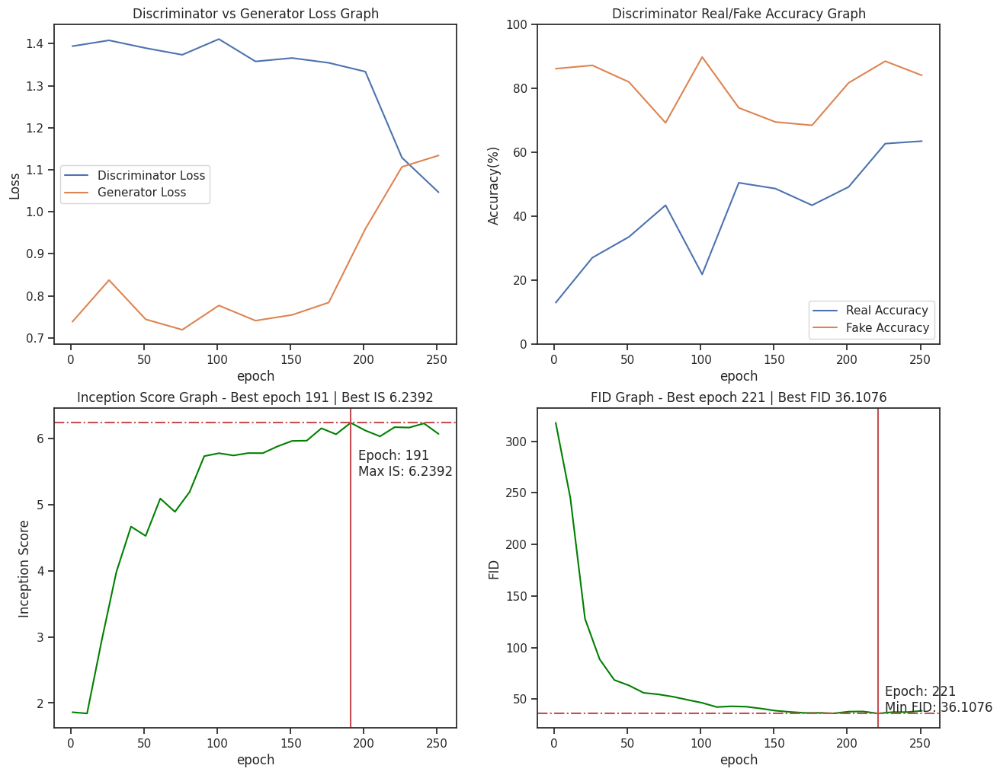

In [18]:
plot_metrics(metrics, metrics_main)

Observation:<br>

The quality of images appears to peak around epoch 190. At this point, the discriminator seems to improve faster than the generator, which suggests that the generator may have already converged at a local minimum. The generator still has room for improvement, as evident in the accuracy graph where the accuracy of both fake and real images continues to increase. This suggests that my generator architecture or parameter size could be slightly more complex in order to achieve better inception score or FID. Despite this, let's move on to our second model where I will increase the complexity of the model and add conditionality to our current DCGAN.

Eye Power evaluation:

<img src="images/training/fake_images_DCGAN.gif" width="1000" alt='DCGAN Training Images'>

Observation:<br>

If the images appear to change too rapidly, I suggest reviewing the training process.<br>

However, as this is an unconditioned GAN, we will likely need to rely heavily on our imagination to infer what the generator is attempting to generate. In my opinion, the images fall into two main categories: animal and non-animal. Animal images typically have green or brownish backgrounds with an unusual looking animal in the center, while non-animal images have white or blueish backgrounds with a peculiar object at the center. Overall, I believe this is a solid baseline, and we can proceed to improve and increase the complexity of our model.

## <a id="3_2"></a> 3.2: Simple conditional DCGAN


- Conditionality added to pervious model
- Batch Normalization Added To Conditionality (BN added to Conditional Layer)

### <a id="3_2_1"></a> 3.2.1: cDCGAN Modelling 🤖

<br>

Through some trial and error I have decided on some hyperparameters that is decent and mode collaspe will not occur. (See analysis portion for more detailed analysis)


[Back to content table](#content-table)

In [7]:
class Generator(nn.Module):
    def __init__(self, class_num=10, latent_dim=160,embed_dim=18,num_filters=144,channels=3):
        super().__init__()
        self.latent_dim = latent_dim
        self.label_emb = nn.Embedding(class_num, embed_dim)
        self.latent = nn.Linear(128 + embed_dim, latent_dim)
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( latent_dim, num_filters * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(num_filters * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(num_filters * 8, num_filters * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( num_filters * 4, num_filters * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 2),
            nn.ReLU(True),
            nn.ConvTranspose2d( num_filters * 2, channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )
    
    def forward(self, img, label):
        # concatenate class labels to input noise and normalize label_embed
        label_embed = self.label_emb(label)
        label_embed = label_embed / torch.norm(label_embed, p=2, dim=1, keepdim=True)
        conditional_inputs = torch.cat([img, label_embed], dim=1)
        conditional_inputs = self.latent(conditional_inputs)
        conditional_inputs = conditional_inputs.view(
            conditional_inputs.shape[0], self.latent_dim, 1, 1
        )
        return self.main(conditional_inputs)

In [8]:
class Discriminator(nn.Module):
    def __init__(self, num_filters=88, class_num=10,channels=3):
        super().__init__()
    
        self.label_emb = nn.Embedding(class_num, 32 * 32)
        
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(4, num_filters, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(num_filters, num_filters * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(num_filters * 2, num_filters * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(num_filters * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(num_filters * 4, 1, 4, 2, 1, bias=False),
            nn.Sigmoid()
        )


    def forward(self, img, label):
        labels = self.label_emb(label)
        labels = labels / torch.norm(labels, p=2, dim=1, keepdim=True)
        labels = labels.view(labels.shape[0], 1, 32, 32)
        conditional_inputs = torch.cat([img, labels], dim=1) 
        return self.main(conditional_inputs)

In [ ]:
netD = Discriminator().to(device)
netG = Generator().to(device)
criterion = nn.BCELoss()

netD.apply(weights_init)
netG.apply(weights_init)

In [11]:
if torch.cuda.device_count() > 1:
    netD = Discriminator().to(device)
    netG = Generator().to(device)
    netD = nn.DataParallel(netD)
    netG = nn.DataParallel(netG)
    criterion = nn.BCELoss()
    # criterion = HingeLoss()
else:
    netD = Discriminator().to(device)
    netG = Generator().to(device)
    criterion = nn.BCELoss()
    # criterion = HingeLoss()

netD.apply(weights_init)
netG.apply(weights_init)

summary(netD)
summary(netG)

Layer (type:depth-idx)                   Param #
├─Embedding: 1-1                         10,240
├─Sequential: 1-2                        --
|    └─Conv2d: 2-1                       5,632
|    └─LeakyReLU: 2-2                    --
|    └─Conv2d: 2-3                       247,808
|    └─BatchNorm2d: 2-4                  352
|    └─LeakyReLU: 2-5                    --
|    └─Conv2d: 2-6                       991,232
|    └─BatchNorm2d: 2-7                  704
|    └─LeakyReLU: 2-8                    --
|    └─Conv2d: 2-9                       5,632
|    └─Sigmoid: 2-10                     --
Total params: 1,261,600
Trainable params: 1,261,600
Non-trainable params: 0
Layer (type:depth-idx)                   Param #
├─Embedding: 1-1                         180
├─Linear: 1-2                            23,520
├─Sequential: 1-3                        --
|    └─ConvTranspose2d: 2-1              2,949,120
|    └─BatchNorm2d: 2-2                  2,304
|    └─ReLU: 2-3                         

Layer (type:depth-idx)                   Param #
├─Embedding: 1-1                         180
├─Linear: 1-2                            23,520
├─Sequential: 1-3                        --
|    └─ConvTranspose2d: 2-1              2,949,120
|    └─BatchNorm2d: 2-2                  2,304
|    └─ReLU: 2-3                         --
|    └─ConvTranspose2d: 2-4              10,616,832
|    └─BatchNorm2d: 2-5                  1,152
|    └─ReLU: 2-6                         --
|    └─ConvTranspose2d: 2-7              2,654,208
|    └─BatchNorm2d: 2-8                  576
|    └─ReLU: 2-9                         --
|    └─ConvTranspose2d: 2-10             13,824
|    └─Tanh: 2-11                        --
Total params: 16,261,716
Trainable params: 16,261,716
Non-trainable params: 0

Sometimes torchsummary prints the output twice, just ignore the extra printed summary.

In [ ]:
# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=0.00009, weight_decay=0.0000001,betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002, weight_decay=0.0000001,betas=(0.5, 0.999))

In [ ]:
def train_cGAN(dataloader=cifar10_dataloader,epochs=241,outputInterval=30,metricsInterval=8,criterion=criterion,fid_model=fid_model,netG=netG,netD=netD,z_dim=128):
    '''
    Parameters:
    dataloader -> Dataloader of dataset
    epochs -> Number of epochs for the training loop
    outputInterval -> Display output of model training every <outputInterval> epochs
    metricsInterval -> Calculate FID & IS every <metricsInterval> epoch
    inceptionBatchSize -> Batch size of images for InceptionV3 model when calculating FID and IS.
    netG -> Generator
    netD -> Discriminator
    '''
    is_model = InceptionScore(normalize=True).to(device)
    metrics = []
    metrics_main = []
    # Training loop    
    # Create an empty list to store the images
    images = []

    # Training loop
    for epoch in range(epochs):
        netG.train()
        for i, (imgs, labels) in enumerate(tqdm(dataloader, disable=True if epoch % outputInterval != 0 else False, desc='Epoch {}'.format(epoch+1))):
            imgs, labels = imgs.to(device), labels.to(device)

            # Generate fake images
            z = torch.randn(imgs.shape[0], z_dim, device=device)
            fake_imgs = netG(z, labels).to(device)

            # Train discriminator
            netD.zero_grad()
            real_output = netD(imgs, labels)
            fake_output = netD(fake_imgs, labels)
            real_loss = criterion(real_output, torch.ones_like(real_output))
            fake_loss = criterion(fake_output, torch.zeros_like(fake_output))
            disc_loss = real_loss + fake_loss
            disc_loss.backward(retain_graph=True)
            optimizerD.step()

            # Train generator
            netG.zero_grad()
            fake_output = netD(fake_imgs, labels)
            gen_loss = criterion(fake_output, torch.ones_like(fake_output))
            gen_loss.backward(retain_graph=True)
            optimizerG.step()
        if epoch % outputInterval == 0:
            # Print generator and discriminator loss
            print("Generator Loss:", gen_loss.item())
            print("Discriminator Loss:", disc_loss.item())
            real_acc = (real_output > 0.5).float().mean()
            fake_acc = (fake_output < 0.5).float().mean()
            print("Real Images Accuracy: {:.2f}%".format(real_acc.item()*100))
            print("Fake Images Accuracy: {:.2f}%".format(fake_acc.item()*100))
            # Print fake images and class labels
            fig, axs = plt.subplots(4, 8, figsize=(16, 8))
            fig.suptitle(f"Fake Images with Class Labels | Epoch {epoch+1}")
            fig.tight_layout(rect=[0, 0.03, 1, 0.95])

            for i, label in enumerate(labels[:32]):
                row, col = i // 8, i % 8
                axs[row, col].axis("off")
                axs[row, col].imshow((fake_imgs[i].detach().cpu().permute(1, 2, 0)+1)/2)
                x_center = (axs[row, col].get_xlim()[1] - axs[row, col].get_xlim()[0])/2 + axs[row, col].get_xlim()[0]
                axs[row, col].text(x_center, -8, class_labels[int(label)], fontsize=12, ha='center', va='top')

            # Save the current figure as a PNG image
            plt.savefig("images/training/fake_images_{}.png".format(epoch), bbox_inches='tight')
            plt.show()
            
            metrics.append([epoch+1, disc_loss.item(), gen_loss.item(), real_acc.item(), fake_acc.item()])
            
            # Append the image to the list
            images.append(imageio.imread("images/training/fake_images_{}.png".format(epoch)))
            
        #Where IS & FID are recorded every metricsInterval
        if epoch % metricsInterval == 0 and metricsInterval != 0:
            netG.eval()
            fid_model.reset()
            is_model.reset()
            
            #The 2 Inception models (2048 features) alone takes up about 16GB VRAM...
            for imgs, labels in dataloader:
                imgs, labels = imgs.to(device), labels.to(device)
                z = torch.randn(imgs.shape[0], 128, device=device)
                fake_imgs = ((netG(z, labels)+1)/2).to(device)
                is_model.update(fake_imgs)
                fid_model.update(fake_imgs, real=False)
            IS = float(is_model.compute()[0])
            FID = float(fid_model.compute())
            metrics_main.append([epoch+1,IS,FID])
            print(f'Epoch {epoch+1}: FID {FID:.4f} | IS {IS:.4f}')
        # Create a GIF using the images in the list
    imageio.mimsave("images/training/fake_images.gif", images, fps=2)
    # return metrics in pd
    return pd.DataFrame(metrics, columns=["epoch", "disc_loss", "gen_loss", "real_acc", "fake_acc"]), pd.DataFrame(metrics_main, columns=["epoch","IS", "FID"])

### <a id="3_2_2"></a> 3.2.2: conditional DCGAN Training 🤖

- <a id="train01_cdcgan"></a>[Click to skip training](#skip01_cdcgan)

<br>

[Back to content table](#content-table)

/opt/conda/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
Epoch 1: 100%|██████████| 469/469 [00:29<00:00, 15.95it/s]


Generator Loss: 0.691764235496521
Discriminator Loss: 1.415336012840271
Real Images Accuracy: 52.08%
Fake Images Accuracy: 41.41%


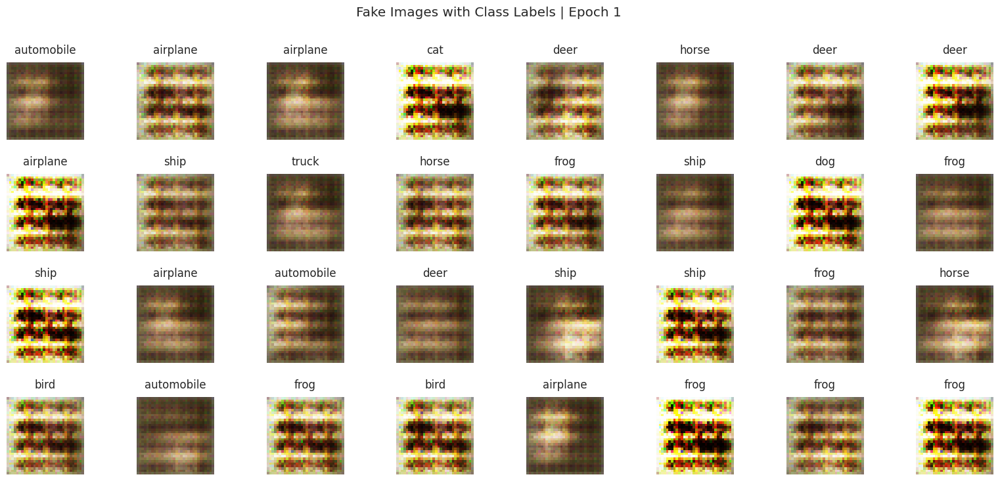

Epoch 1: FID 374.2908 | IS 1.6006
Epoch 11: FID 211.4822 | IS 2.0795
Epoch 21: FID 128.6432 | IS 3.1075


Epoch 26: 100%|██████████| 469/469 [00:28<00:00, 16.73it/s]


Generator Loss: 0.6974453330039978
Discriminator Loss: 1.3637933731079102
Real Images Accuracy: 58.33%
Fake Images Accuracy: 51.04%


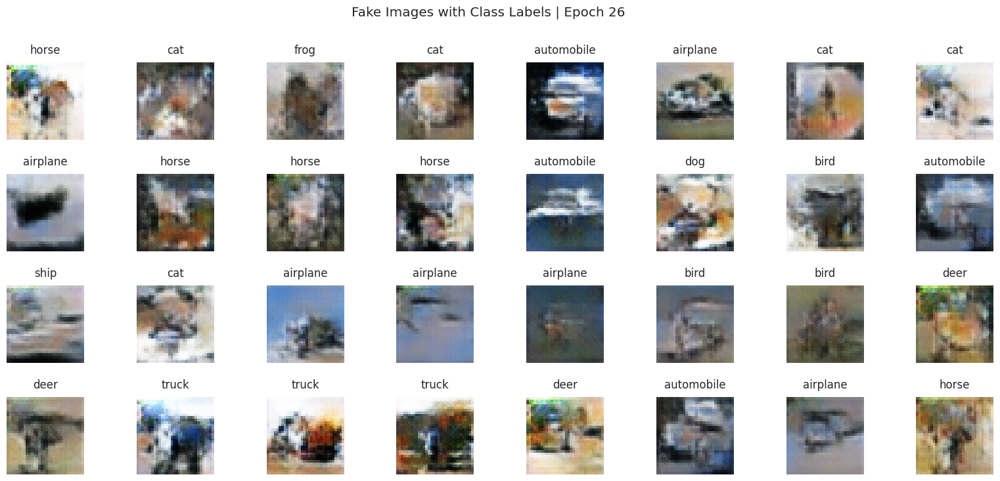

Epoch 31: FID 95.0691 | IS 3.8590
Epoch 41: FID 74.8606 | IS 4.2942


Epoch 51: 100%|██████████| 469/469 [00:28<00:00, 16.65it/s]


Generator Loss: 0.6999655961990356
Discriminator Loss: 1.3964791297912598
Real Images Accuracy: 58.85%
Fake Images Accuracy: 53.65%


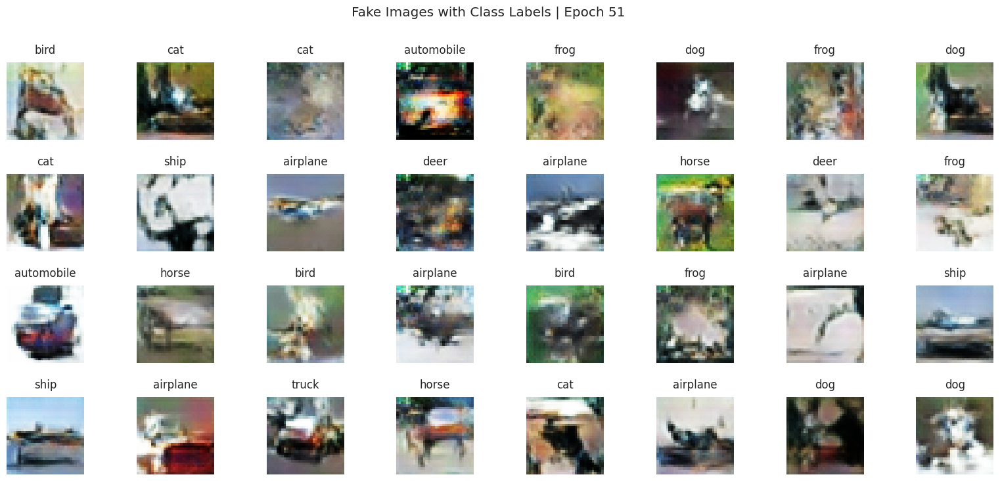

Epoch 51: FID 64.0380 | IS 4.6434
Epoch 61: FID 56.7096 | IS 5.2018
Epoch 71: FID 55.0211 | IS 5.0921


Epoch 76: 100%|██████████| 469/469 [00:27<00:00, 16.85it/s]


Generator Loss: 0.7097532153129578
Discriminator Loss: 1.3664324283599854
Real Images Accuracy: 70.05%
Fake Images Accuracy: 49.22%


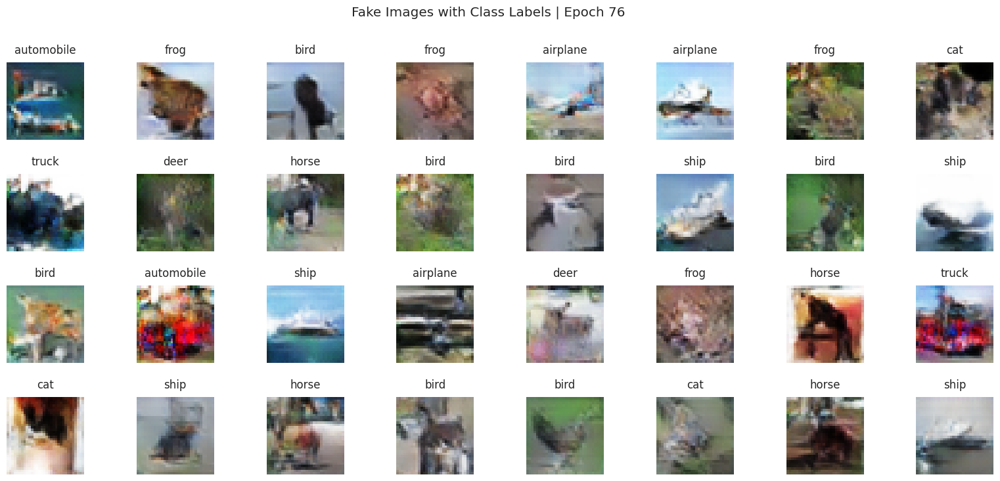

Epoch 81: FID 49.0243 | IS 5.5181
Epoch 91: FID 45.4667 | IS 5.9945


Epoch 101: 100%|██████████| 469/469 [00:27<00:00, 16.93it/s]


Generator Loss: 0.7177755236625671
Discriminator Loss: 1.3897523880004883
Real Images Accuracy: 52.60%
Fake Images Accuracy: 58.59%


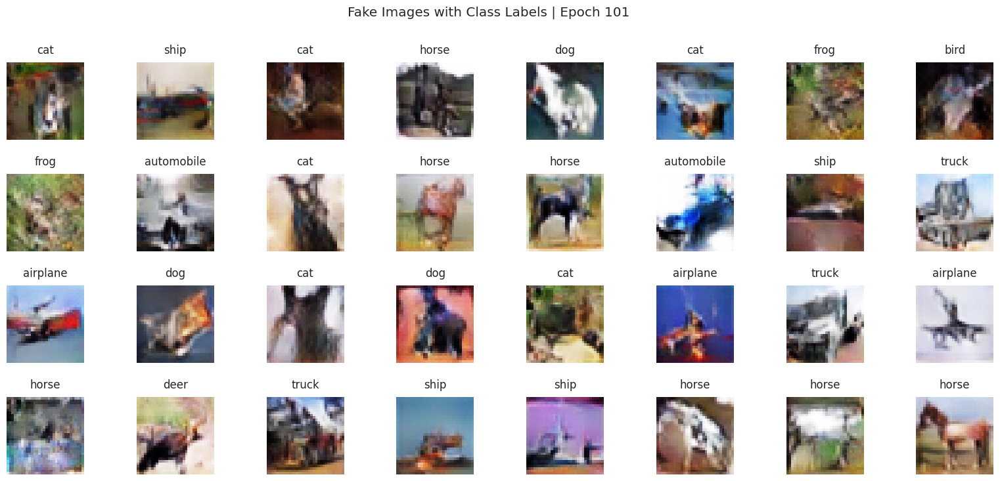

Epoch 101: FID 45.1016 | IS 5.8438
Epoch 111: FID 44.1074 | IS 5.9198
Epoch 121: FID 38.4514 | IS 6.3450


Epoch 126: 100%|██████████| 469/469 [00:27<00:00, 16.91it/s]


Generator Loss: 0.7537629008293152
Discriminator Loss: 1.3654136657714844
Real Images Accuracy: 41.67%
Fake Images Accuracy: 70.83%


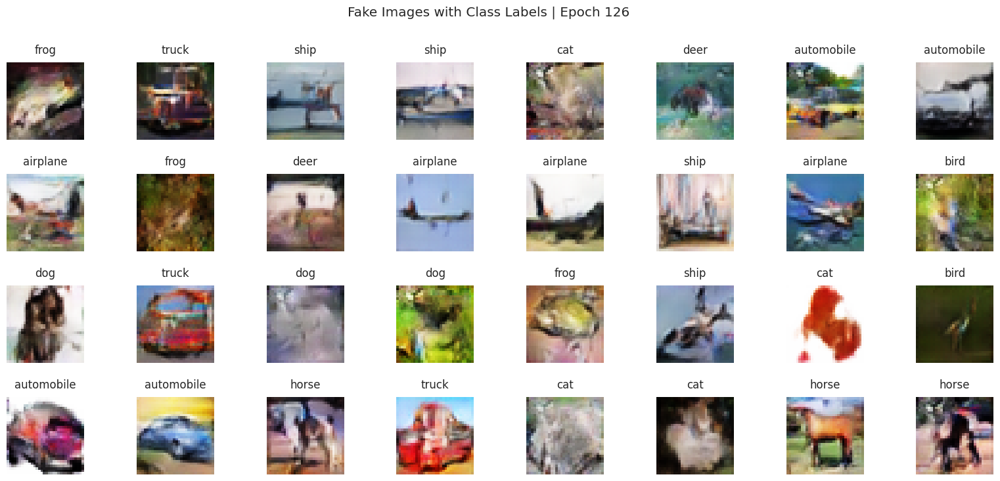

Epoch 131: FID 38.0582 | IS 6.2569
Epoch 141: FID 36.1038 | IS 6.3474


Epoch 151: 100%|██████████| 469/469 [00:27<00:00, 16.95it/s]


Generator Loss: 0.7509981989860535
Discriminator Loss: 1.357848882675171
Real Images Accuracy: 43.23%
Fake Images Accuracy: 65.36%


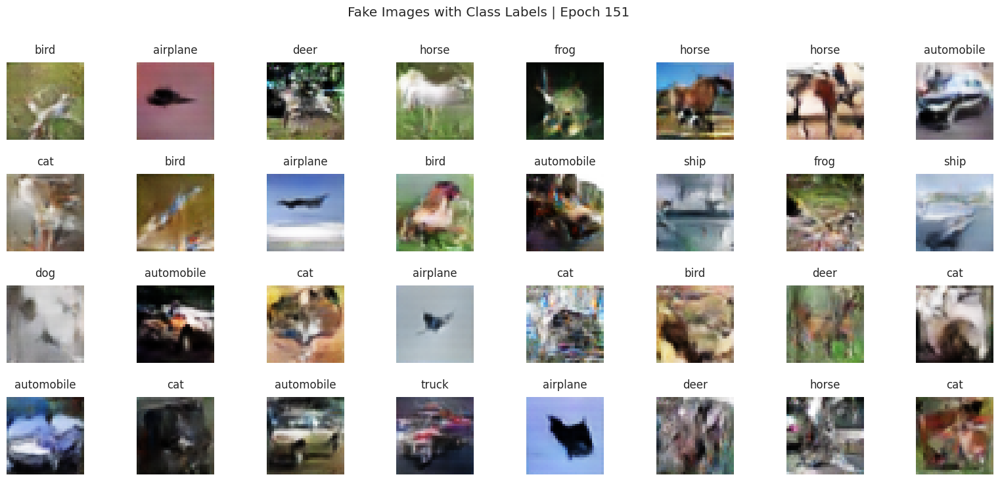

Epoch 151: FID 36.1470 | IS 6.2354
Epoch 161: FID 35.0056 | IS 6.3952
Epoch 171: FID 34.4732 | IS 6.5454


Epoch 176: 100%|██████████| 469/469 [00:27<00:00, 16.87it/s]


Generator Loss: 0.7680345773696899
Discriminator Loss: 1.3342583179473877
Real Images Accuracy: 52.60%
Fake Images Accuracy: 69.53%


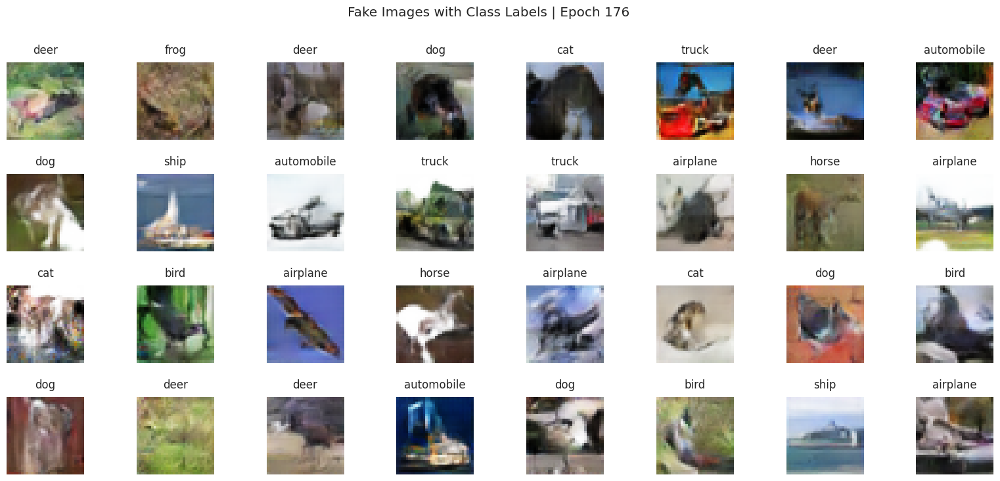

Epoch 181: FID 34.3996 | IS 6.6635
Epoch 191: FID 33.9731 | IS 6.5467


Epoch 201: 100%|██████████| 469/469 [00:27<00:00, 17.00it/s]


Generator Loss: 0.8227677345275879
Discriminator Loss: 1.2535020112991333
Real Images Accuracy: 58.59%
Fake Images Accuracy: 75.78%


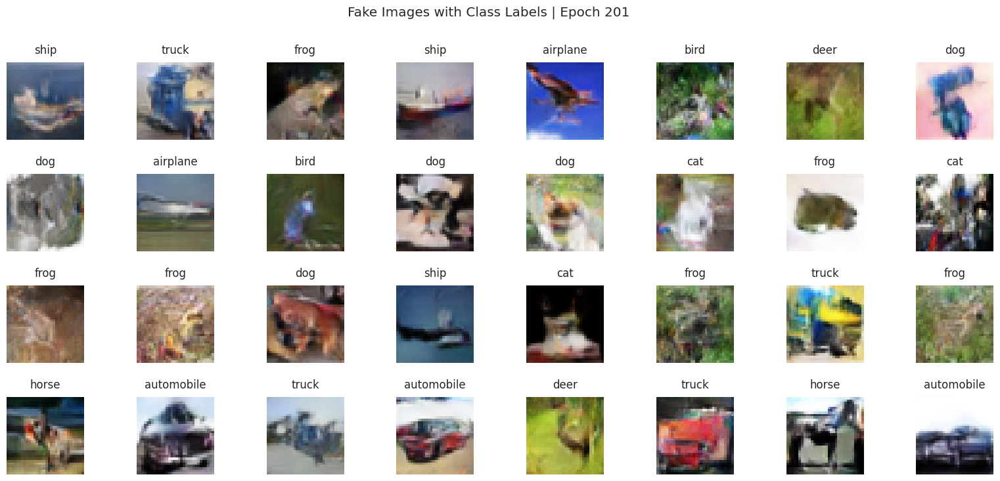

Epoch 201: FID 32.9548 | IS 6.5834
Epoch 211: FID 32.2547 | IS 6.5548
Epoch 221: FID 32.4322 | IS 6.5686


Epoch 226: 100%|██████████| 469/469 [00:27<00:00, 16.91it/s]


Generator Loss: 0.8932846784591675
Discriminator Loss: 1.2385475635528564
Real Images Accuracy: 57.03%
Fake Images Accuracy: 76.04%


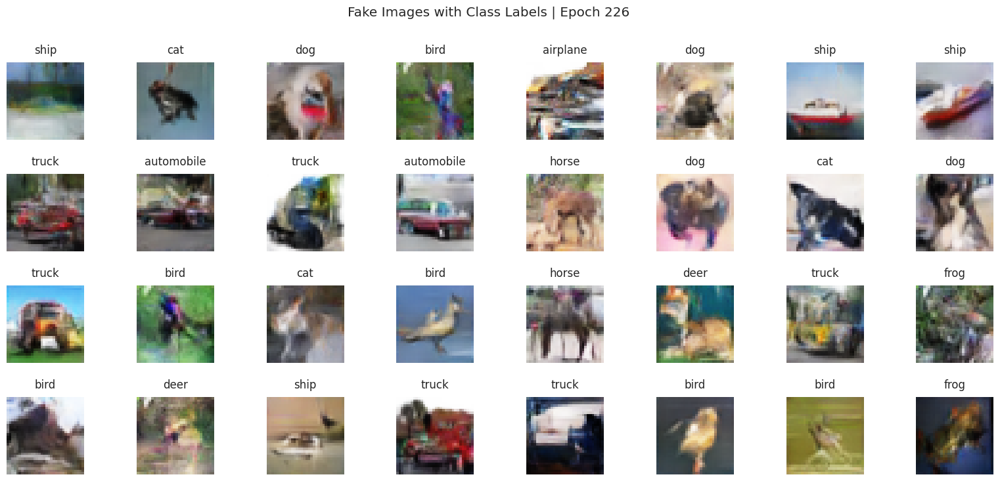

Epoch 231: FID 32.7756 | IS 6.6238
Epoch 241: FID 33.1615 | IS 6.6257


Epoch 251: 100%|██████████| 469/469 [00:27<00:00, 16.97it/s]


Generator Loss: 1.023851752281189
Discriminator Loss: 1.1760321855545044
Real Images Accuracy: 63.54%
Fake Images Accuracy: 84.64%


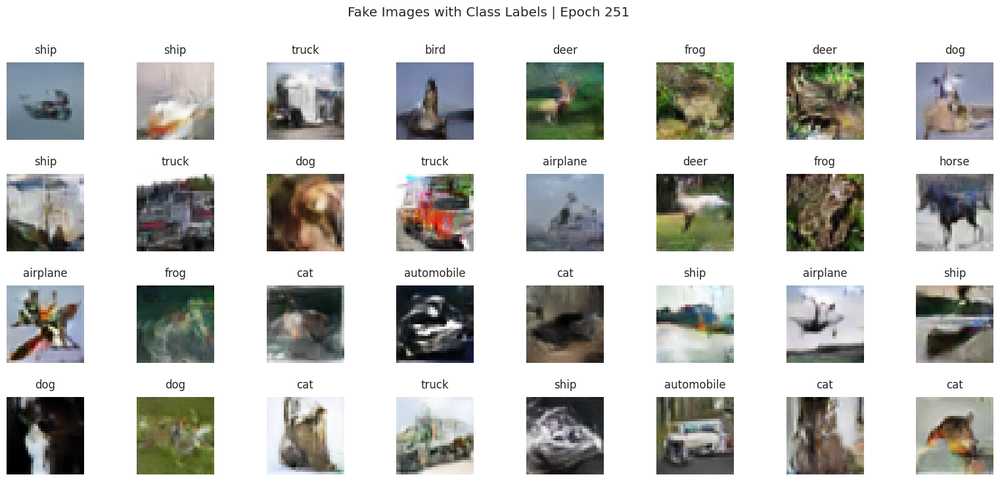

Epoch 251: FID 32.7025 | IS 6.5619
Epoch 261: FID 33.1064 | IS 6.4795
Epoch 271: FID 34.1954 | IS 6.4020


Epoch 276: 100%|██████████| 469/469 [00:27<00:00, 16.90it/s]


Generator Loss: 1.000204086303711
Discriminator Loss: 1.2616732120513916
Real Images Accuracy: 60.42%
Fake Images Accuracy: 82.55%


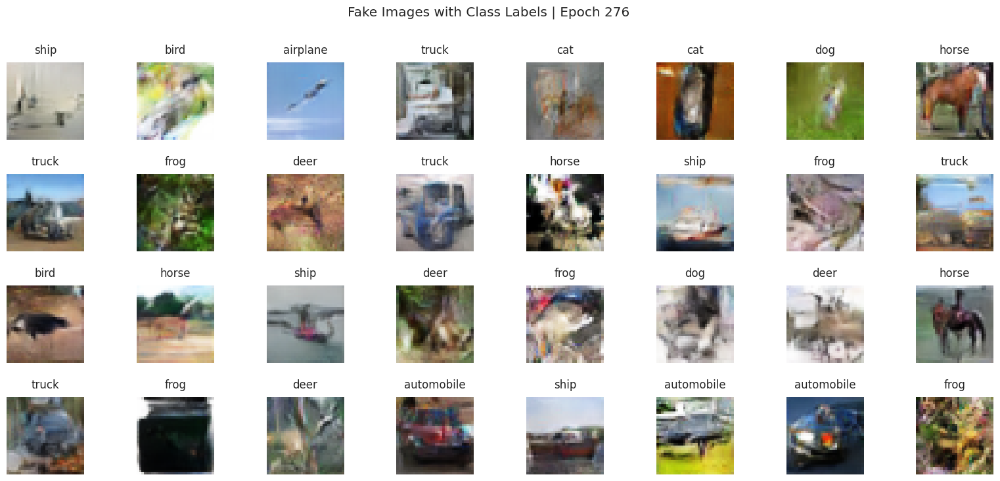

In [15]:
metrics, metrics_main = train_cGAN(dataloader=cifar10_dataloader,epochs=276,outputInterval=25,metricsInterval=10,fid_model=fid_model,netG=netG,netD=netD)

This cell can be omitted* Only for saving/loading model

In [ ]:
#Saving model weights - Discriminator & Generator
torch.save(netG.state_dict(), "cDCGAN-G.pt")
torch.save(netD.state_dict(), "cDCGAN-D.pt")

"\nnetG = Generator()\nnetD = Discriminator()\n\nnetG.load_state_dict(torch.load('DCGAN-G.pt'))\nnetD.load_state_dict(torch.load('DCGAN-D.pt'))\n\nnetG.to(device)\nnetD.to(device)\n"

### <a id="3_2_3"></a>3.2.3: conditional DCGAN Evaluation 🔬
- Lowest FID recorded: 32.3
- Highest IS recorded: 6.72

<br>

- <a id="skip01_cdcgan"></a>[Click to see training process (cDCGAN)](#train01_cdcgan)

[Back to content table](#content-table)

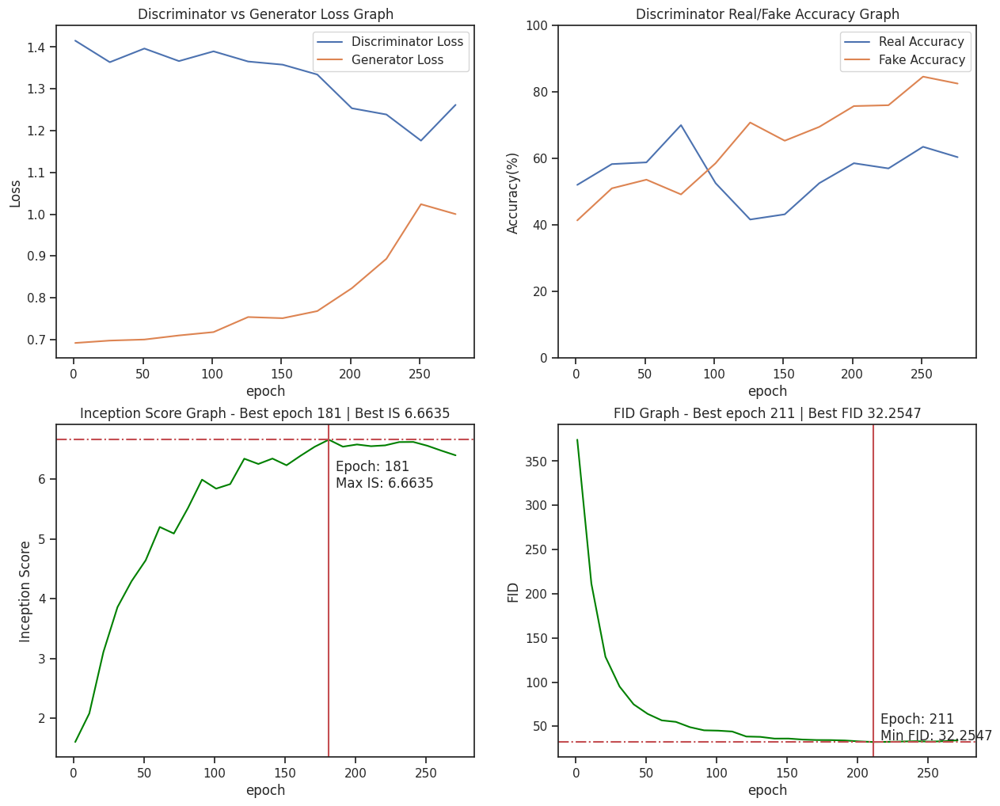

In [18]:
plot_metrics(metrics, metrics_main)

Observation:<br>

The loss graph indicates that the discriminator is improving slightly faster than the generator as the number of epochs progresses, which is typical and not a cause for concern. This trend is also reflected in the discriminator's fake and real accuracy true positive percentage graph, which shows that the discriminator is becoming more proficient at identifying fake images compared to real images. This suggests that the generator has potential for improvement in terms of generating fake images that closely resemble real images, and a more complex generator architecture could potentially result in better inception and FID scores. The best recorded inception score was 6.66, and the best recorded FID was 32.25.

Eye Power evaluation:

<img src="images/training/fake_images_cDCGAN.gif" width="1000" alt='cDCGAN Training Images'>

Observation:

Images may appear to change rapidly, but if you want to view them at a slower pace, I recommend revisiting the [training process](#train01). The same principle can be observed in our first baseline DCGAN model. However, since we have more control over the images we generate and our model is slightly more complex, the image quality appears to be better than our baseline. While some imagination is still required to interpret the images and fill in the gaps of our generated images, we need less imagination power than our baseline DCGAN, given that we know their classes.

## <a id="3_3"></a>3.3: Research & Discussion: Ways to improve GANs 🤓

When it comes to GANs, there are many possibilities to explore in order to improve the model. However, hyperparameter tuning for all hyperparameters may not always be feasible or efficient, particularly for large GAN models. As such, what research and discussions exist on more complex GAN model architecture and methodologies that can enhance a standard, basic conditional GAN? Being blunt, research is done with Google and ChatGPT, but of course, for the research papers & links I would have to get them myself.

- 3.3.1: Selective hyperparameters
- 3.3.2: Advance Architectures - Loss functions, Data augmentation, EMA, Misc. & Etc. (More complex stuff)

*Note that the possibilities are so much wider to explore when it comes to GAN, I will only pick a handful methodology and architecture to apply into this assignment*

<br>

**Anything with a `✅ emoji` means it is an advanced architecture/methodology I used and experiment with in this assignement**

### <a id="3_3_1"></a>3.3.1: Selective hyperparameters 🤓


- **Adjusting the learning rate & beta1/beta2 of Adam**:<br>
A common technique for improving GAN performance is to adjust the betas  or learning rate of the generator and discriminator (assuming Adam optimizer is used). Common values for the learning rate of GAN is typically 0.0002 with beta1 being 0 or 0.5 and beta2 being 0.9999, these hyperparameters has shown to provide a more stable training as oppose to the default beta1 (0.9). Slightly adjust and fine-tuning these values could improve GAN models.


- **Tuning the architecture**:<br>
The architecture of the GAN can also be tuned to improve performance. For example, using deeper or wider networks can help the GAN learn more complex distributions.


- **Using mini-batch discrimination ✅**:<br>
To further stabilize GAN training, one can use mini-batch discrimination. This involves training the discriminator to differentiate between real images and a set of generated images, rather than just one generated image.


- **Using label smoothing**:<br>
Another technique to improve GAN performance is to use label smoothing. This involves adjusting the labels used to train the discriminator so that it is less certain about the correct classification of images. 


- **One-sided label smoothing ✅**:<br>
In which the generator and discriminator are updated different number of times per step.


- **two-time-scale update rule (TTUR)**:<br>
In which the generator and discriminator are updated at different learning rates


- **Trying different loss functions ✅**:<br>
Many loss functions can be used in GAN and may provide better results for different GAN model. I have experimented with Binary cross-entropy Loss, Hinge Loss and Hinge Loss with regularization (LeCam) in this assignment, some other popular choice would be Wasserstein, Multi Hinge, Logistic Loss. Additional loss functions such as Auxiliary Loss or Data-to-Data Cross-Entropy can be introduced to provide more information to the Losses used and potentially improve GAN models.

All sources come from this paper: ([Improved Techniques for Training GANs - Salimans et al.](https://papers.nips.cc/paper/6125-improved-techniques-for-training-gans), 2016)

[Back to content table](#content-table)

### <a id="3_3_2"></a>3.3.2: Advance Architectures & Methodologies 🤓

- Below is a table done and maintained by the contributors at [StudioGAN PyTorch](https://github.com/POSTECH-CVLab/PyTorch-StudioGAN) by Open AI. It shows the trend of state of the art GAN implementations over the years (up to 2022). Lets talk about the architecture and methodologies used

<h2 style="text-align:center;">Implementations of SOTA GAN models over the years</h2><span id='table02'></span>


Method | Venue | Architecture | GC | DC | Loss | EMA
----- | ----- | -------- | --- | --- | ---- | ---
DCGAN | arXiv'15 | DCGAN/ResNetGAN1 | N/A | N/A | Vanilla | False
InfoGAN | NIPS'16 | DCGAN/ResNetGAN1 | N/A | N/A | Vanilla | False
LSGAN | ICCV'17 | DCGAN/ResNetGAN1 | N/A | N/A | Least Sqaure | False
GGAN | arXiv'17 | DCGAN/ResNetGAN1 | N/A | N/A | Hinge | False
WGAN-WC | ICLR'17 | ResNetGAN | N/A | N/A | Wasserstein | False
WGAN-GP | NIPS'17 | ResNetGAN | N/A | N/A | Wasserstein | False
WGAN-DRA | arXiv'17 | ResNetGAN | N/A | N/A | Wasserstein | False
ACGAN-Mod2 | - | ResNetGAN | cBN | AC | Hinge | False
PDGAN | ICLR'18 | ResNetGAN | cBN | PD | Hinge | False
SNGAN | ICLR'18 | ResNetGAN | cBN | PD | Hinge | False
SAGAN | ICML'19 | ResNetGAN | cBN | PD | Hinge | False
TACGAN | Neurips'19 | BigGAN | cBN | TAC | Hinge | True
LGAN | ICML'19 | ResNetGAN | N/A | N/A | Vanilla | False
Unconditional BigGAN | ICLR'19 | BigGAN | N/A | N/A | Hinge | True
BigGAN | ICLR'19 | BigGAN | cBN | PD | Hinge | True
BigGAN-Deep-CompareGAN | ICLR'19 | BigGAN-Deep CompareGAN | cBN | PD | Hinge | True
BigGAN-Deep-StudioGAN | - | BigGAN-Deep StudioGAN | cBN | PD | Hinge | True
StyleGAN2 | CVPR' 20 | StyleGAN2 | cAdaIN | SPD | Logistic | True
CRGAN | ICLR'20 | BigGAN | cBN | PD | Hinge | True
ICRGAN | AAAI'21 | BigGAN | cBN | PD | Hinge | True
LOGAN | arXiv'19 | ResNetGAN | cBN | PD | Hinge | True
ContraGAN | Neurips'20 | BigGAN | cBN | 2C | Hinge | True
MHGAN | WACV'21 | BigGAN | cBN | MH | MH | True
BigGAN + DiffAugment | Neurips'20 | BigGAN | cBN | PD | Hinge | True
StyleGAN2 + ADA | Neurips'20 | StyleGAN2 | cAdaIN | SPD | Logistic | True
BigGAN + LeCam | CVPR'2021 | BigGAN | cBN | PD | Hinge | True
ReACGAN | Neurips'21 | BigGAN | cBN | D2D-CE | Hinge | True
StyleGAN2 + APA | Neurips'21 | StyleGAN2 | cAdaIN | SPD | Logistic | True
StyleGAN3-t | Neurips'21 | StyleGAN3 | cAaIN | SPD | Logistic | True
StyleGAN3-r | Neurips'21 | StyleGAN3 | cAaIN | SPD | Logistic | True
ADCGAN | ICML'22 | BigGAN | cBN | ADC | Hinge | True

*GC/DC indicates the way how we inject label information to the Generator or Discriminator.

<b>EMA</b>: Exponential Moving Average update to the generator. <b>cBN</b>: conditional Batch Normalization. <b>cAdaIN</b>: Conditional version of Adaptive Instance Normalization. <b>AC</b>: Auxiliary Classifier. <b>PD</b>: Projection Discriminator. <b>TAC</b>: Twin Auxiliary Classifier. <b>SPD</b>: Modified PD for StyleGAN. <b>2C</b>: Conditional Contrastive loss. <b>MH</b>: Multi-Hinge loss. <b>ADC</b>: Auxiliary Discriminative Classifier. <b>D2D-CE</b>: Data-to-Data Cross-Entropy.


Lets talk about the common architecture seen before talking about the others. ResNet, BigGAN and StyleGAN seems to be the 3 common ones.

**Anything with a `✅ emoji` means it is an advanced architecture/methodology I used and experiment with in this assignement**

*italics means where I have applied the architecture/methodology to*

**ResNet Blocks ✅**:<br>
ResNet, or Residual Network, is a type of convolutional neural network that can learn deep representations by using skip connections, also known as shortcuts, to connect layers within the network. These skip connections enable the network to learn residuals, or the differences between the input and output of a layer, rather than the absolute values. This helps to reduce the problem of vanishing gradients and allows for the training of very deep networks. Note that when using ResNet blocks there is no need to use -1 to 1 normalized dataset and "LeakyReLU", so I used "ReLU" and 0 to 1 normalized dataset (Original implementation)

It's also worth noting that ResNet blocks are commonly used in almost all state-of-the-art GAN models, such as BigGAN and StyleGAN, and have became a staple in achieving state-of-the-art performance.

Source: [A. Brock et al. (BigGAN)](https://arxiv.org/abs/1809.11096) | [Karras et al. (StyleGAN)](https://arxiv.org/abs/2006.06676)

**BigGAN ✅**:<br>
BigGAN is a large-scale Generative Adversarial Network (GAN) architecture that is trained on a large dataset and is able to generate high-resolution images. The architecture is based on the GAN architecture and uses a deep convolutional generator network and a deep convolutional discriminator network.

One of the key features of BigGAN is the use of a hierarchical latent space, which allows the model to generate images at different scales, starting from low-resolution images and gradually increasing the resolution. This allows the model to generate high-resolution images with less noise and more detail.

A key paper on BigGAN is "Large Scale GAN Training for High Fidelity Natural Image Synthesis" done by [A. Brock et al.](https://arxiv.org/abs/1809.11096) from OpenAI in 2018. They trained BigGAN on the ImageNet dataset and showed that it can generate images with high quality and realism with state-of-the-art performances during that time. BigGAN is still a state-of-the-art method and various modifications have been proposed to improve its performance and quality.

Another related work is "BigGAN-Deep Generative Image Models using hierarchical latent spaces" which is another work by [S. Srinivas et al.](https://arxiv.org/abs/1905.00780). They used the BigGAN architecture to generate high-resolution images of animals and plants, and showed that it can generate images with high quality and realism.

Source: [BigGAN-Deep Generative Image Models using hierarchical latent spaces - Featured in NeurIPS'19](https://arxiv.org/abs/1905.00780)

**StyleGAN**:<br>
StyleGAN is a type of Generative Adversarial Network (GAN) architecture that is designed to generate high-resolution images of faces back in 2018. The architecture is based on the GAN architecture and uses a deep convolutional generator network and a deep convolutional discriminator network.

One of the key features of StyleGAN is the use of a style-based generator architecture, which allows the model to disentangle the style and content of the images it generates. This allows the model to generate images with a consistent style while varying the content, such as changing the pose or expression of a face.

A key paper on StyleGAN is "A Style-Based Generator Architecture for Generative Adversarial Networks" which was proposed by [Tero Karras et al.](https://arxiv.org/abs/1812.04948) from NVIDIA in 2018. They used the StyleGAN architecture to generate high-resolution images of faces and showed that it can generate images with high quality and realism.

Another related work is "Analyzing and Improving the Image Quality of StyleGAN" which is another work by [Tero Karras et al.](https://arxiv.org/abs/1912.04958). They made improvement by redesigning the generator and used better mapping from latent codes to image. All in all, their improved model redefines the state-of-the-art in unconditional image modeling, both in terms of existing distribution quality metrics as well as perceived image quality. 

Source: [A Style-Based Generator Architecture for Generative Adversarial Networks (introducing StyleGAN) - Tero Karras et al., 2018](https://arxiv.org/abs/2006.06676)

**EMA ✅** - *Generator*:<br>
EMA (Exponential moving average) is a technique that is often used to stabilize the training of generative adversarial networks (GANs). The basic idea is to maintain a moving average of the generator's parameters, and to use that average instead of the current parameters when updating the generator's weights. This helps to smooth out the fluctuations in the generator's parameters that can occur during training, and can lead to more stable and predictable results.<br>

Source: [Mean teachers are better role models: Weight-averaged consistency targets improve semi-supervised deep learning results - Tarvainen et al, 2017](https://arxiv.org/abs/1703.01780)

**LeCam Regularization ✅** - *Discriminator*: <br>
LeCam EMA (Exponential Moving Average) is a technique for regularizing the generator of a GAN during training, by using an exponential moving average of the parameters of the discriminator to update the generator. The idea is that by using the moving average of the discriminator's parameters, the generator can be trained more stably, by providing the generator with a more consistent target to learn from. This is a rather new technique proposed by [Tseng et al.](https://arxiv.org/pdf/2104.03310.pdf) featured in CVPR'21.

Source: [Regularizing Generative Adversarial Networks under Limited Data](https://arxiv.org/pdf/2104.03310.pdf)

**AC** - Discriminator:<br>
AC, Auxiliary Classifier, is trained to predict the class labels of the generated images, in addition to the main task of the generator, which is to produce realistic images. The main idea behind using an auxiliary classifier in a GAN is to improve the ability of the generator to produce images that are representative of a specific class. By training the generator to produce images that are not only realistic but also belong to a specific class, the overall performance of the GAN is improved. It allows the generator to learn more about the underlying data distribution and generate more diverse images.

Source: [Conditional Image Synthesis With Auxiliary Classifier GANs (introducing ACGAN) - Odena et al, 2016](https://arxiv.org/abs/1610.09585)


**PD ✅** - *Discriminator*:<br>
A projection discriminator is a type of discriminator used in Generative Adversarial Networks (GANs) introduced by [Miyato et al](https://openreview.net/forum?id=ByS1VpgRZ) during ICLR'18. The standard discriminator in a GAN compares the input image to a set of real images and tries to determine whether the input image is real or fake. The projection discriminator, on the other hand, projects the input image onto a lower-dimensional space before making a determination. This can improve the discriminator's ability to distinguish between real and fake images by reducing the dimensionality of the input and making it easier to analyze. Additionally, it can also improve the stability of training, as it reduces the chances of the discriminator getting stuck in poor local optima. When comparing **PD** to **AC**, projection discriminators is newer (2018[PD] vs 2016[AC]) and seems to generally perform better than discriminators with auxiliary classifier.

Source: [Projection Discriminator (Paper featured in ICLR'18) - Miyato et al, 2018](https://openreview.net/forum?id=ByS1VpgRZ)

**Spectral Normalization ✅** - *Discriminator/Generator*:<br>
Spectral normalization is a technique also introduced by [Miyato et al](https://arxiv.org/abs/1802.05957) during ICLR'18 and is used to stabilize the training of Generative Adversarial Networks (GANs) by normalizing the weight matrices of the generator network. The idea is to constrain the Lipschitz constant of the generator's mapping from latent space to data space, which helps to prevent the generator from producing unrealistic samples.

Spectral normalization and batch normalization are similar in that they both aim to normalize the inputs to a layer, but they differ in how they achieve this. Batch normalization normalizes the activations, while spectral normalization normalizes the weight matrices.

Spectral normalization is an improvement over batch normalization because it is able to constrain the Lipschitz constant of the generator's mapping, which helps to prevent the generator from producing unrealistic samples. In addition, it can be applied to both generator and discriminator in GAN, which is not possible with batch normalization.

Source: [Spectral Normalization for Generative Adversarial Networks (Paper featured in ICLR'18) - Miyato et al, 2018](https://arxiv.org/abs/1802.05957)

**Differentiable Augmentation - DiffAug ✅**:<br>
Differentiable Augmentation is a technique that improves GAN training by using data augmentation that is differentiable, meaning that the gradients of the generator network can be propagated through the augmentation process. This allows the generator to learn more robust features that are invariant to the applied augmentations. The augmentation I used has generic mixture of random cutoff, translation, saturation and brightness. (See #3.4.1.4 for more info)

Source: [Differentiable Augmentation for Data-Efficient GAN Training - Code at #3.4.1.4 used were by the authors - Zhao et al., 2020](https://arxiv.org/abs/2006.10738)

**Attention Modules ✅**:<br>
Attention mechanisms can be used in GANs to improve the generator and discriminator in various ways. In the generator, attention can be used to focus on specific parts of the input, allowing the generator to produce more detailed and realistic images. In the discriminator, attention can be used to focus on important features of the input, allowing the discriminator to better distinguish real and fake images.

Source: [Self-Attention Generative Adversarial Networks (introducing SAGAN) - Zhang et al., 2018](https://arxiv.org/abs/1805.08318)


**Note that there are too many advanced architecture and methodologies to include as seen by the [table](#table02) and research I have done above, so I shall stop here 🙂**

[Back to content table](#content-table)

## 3.4: cBigGAN++<span id='skip02'></span><a id="3_4"></a>

The 2 '+' at the back of 'cBigGAN++' just means it is an extension of the traditional BigGAN. Its just a term I use in this report...

*For context I have tried different complex architectures below are the results, to see the training process of all experiments see `/experiments` folder* or click on the link below of the different architecture. I will only show `cBigGAN-LeCam-DiffAug` as it provided the best results

<h3 style="text-align:center;">Tested BigGAN Models and Architectures During This Assignment</h3>

Methods | Architecture Description | Methodology Description | Loss | FID | IS |
----- | ----- | -------- | --- | --- | --- | 
<a href="./experiments/BigGAN.html" target="_blank">cBigGAN</a> | ATT, RES, PD | cBN, SN, O-SLS | Hinge Loss | 14.55 | 8.32 ± 0.088 | 
<a href="./experiments/BigGAN-LeCam.html" target="_blank">cBigGAN-LeCam</a> | ATT, RES, PD, LeCam, EMA | cBN, SN, O-SLS | Hinge Loss + Regularization Loss (LeCam) | 13.63 | 8.28 ± 0.081 | 
<b>cBigGAN-LeCam-DiffAug</b> | <b>ATT, RES, PD, LeCam, EMA</b> | <b>cBN, SN, O-SLS, DiffA</b> | <b>Hinge Loss + Regularization Loss (LeCam)</b> | **7.98** | **8.79 ± 0.080** | 


<b>EMA</b>: Exponential Moving Average Used (Generator). <b>cBN</b> : conditional Batch Normalization. <b>SN</b>: Spectral Normalization. <b>ATT</b>: Attention Module Used. <b>RES</b> : ResNet Modules Used. <b>PD</b> : Projection Discriminator. <b>O-SLS</b>: One-sided label smoothing. <b>LeCam</b>: LeCam EMA/Regularization Used. <b>DiffA</b>: Differentiable Augmentation Used. <b>EMA</b>: Exponential Moving Average Used For Generator

### 3.4.1: cBigGAN-LeCam-DiffAug Modelling<a id="3_4_1"></a> 🤖

Code reference taken from [StudioGAN](https://github.com/POSTECH-CVLab/PyTorch-StudioGAN) by OpenAI. StudioGAN, developed by OpenAI, is an easy-to-use library for researchers to create and reproduce GAN models. It offers 7 GAN architectures, 9 conditioning methods, 4 adversarial losses, 13 regularization modules, 3 differentiable augmentations, 8 evaluation metrics, and 5 evaluation backbones for researchers to mix and match, researchers can also fine-tune and include implementation into SOTA models to achieve better results.

Please note that the original code is meant to be run on a Python terminal and not on Jupyter notebook. 
    
Most of the code used below has been heavily modified and cut down from the original. The page for all the code referenced can be found on the links provided. 
    
Code is open-source and license is provided on their official [Github - StudioGAN](https://github.com/POSTECH-CVLab/PyTorch-StudioGAN).



**Utility Functions/Classes For Advanced Architecture/Methodologies Used goes as follow:**

- 3.4.1.1: Losses - Hinge Loss, LeCam Regularization Loss
- 3.4.1.2: Layers - Spectral Norm linear, convolutional, embedding, conditional batchnorm & attention layers
- 3.4.1.3: EMAs - LeCam EMA & EMA
- 3.4.1.4: Augmentation - Differentiable Augmentation
- 3.4.1.5: BigGAN Generator/Discriminator

[Back to content table](#content-table)

#### 3.4.1.1: Losses

Losses - Hinge Loss | LeCam Regularization Loss.

The `lecam_reg` calculates the amount of regularization to add to the discriminator loss (hinge loss) in the training loop

In [8]:
def d_hinge(d_logit_real, d_logit_fake):
    return torch.mean(F.relu(1. - d_logit_real)) + torch.mean(F.relu(1. + d_logit_fake))

def g_hinge(d_logit_fake):
    return -torch.mean(d_logit_fake)

def lecam_reg(d_logit_real, d_logit_fake, ema):
    reg = torch.mean(F.relu(d_logit_real - ema.D_fake).pow(2)) + \
          torch.mean(F.relu(ema.D_real - d_logit_fake).pow(2))
    return reg

#### 3.4.1.2: Layers

Encapsulating `nn.spectral_norm` in Linear/Conv2d/TransposeConv2d/Embedding Layers 

(PyTorch already comes with spectral norm)

Code provided/referenced on: https://github.com/POSTECH-CVLab/PyTorch-StudioGAN/blob/master/src/utils/ops.py

`ConditionalBatchNorm2d` for conditional inputs - Using `spectral_norm`

`SelfAttention` - Open-source, spectral_norm convolution layers were used as opposed to normal convolutional layers

In [9]:
def snlinear(in_features, out_features, bias=True):
    return spectral_norm(nn.Linear(in_features=in_features, out_features=out_features, bias=bias), eps=1e-6)

def snconv2d(in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True):
    return spectral_norm(nn.Conv2d(in_channels=in_channels,
                                   out_channels=out_channels,
                                   kernel_size=kernel_size,
                                   stride=stride,
                                   padding=padding,
                                   dilation=dilation,
                                   groups=groups,
                                   bias=bias),
                                   eps=1e-6)

def sndeconv2d(in_channels, out_channels, kernel_size, stride=2, padding=0, dilation=1, groups=1, bias=True):
    return spectral_norm(nn.ConvTranspose2d(in_channels=in_channels,
                                            out_channels=out_channels,
                                            kernel_size=kernel_size,
                                            stride=stride,
                                            padding=padding,
                                            dilation=dilation,
                                            groups=groups,
                                            bias=bias),
                                            eps=1e-6)

def sn_embedding(num_embeddings, embedding_dim):
    return spectral_norm(nn.Embedding(num_embeddings=num_embeddings, embedding_dim=embedding_dim), eps=1e-6)


def batchnorm_2d(in_features, eps=1e-4, momentum=0.1, affine=True):
    return nn.BatchNorm2d(in_features, eps=eps, momentum=momentum, affine=affine, track_running_stats=True)

def snconv2d(in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True):
    return spectral_norm(nn.Conv2d(in_channels=in_channels,
                                   out_channels=out_channels,
                                   kernel_size=kernel_size,
                                   stride=stride,
                                   padding=padding,
                                   dilation=dilation,
                                   groups=groups,
                                   bias=bias),
                         eps=1e-6)


def sndeconv2d(in_channels, out_channels, kernel_size, stride=2, padding=0, dilation=1, groups=1, bias=True):
    return spectral_norm(nn.ConvTranspose2d(in_channels=in_channels,
                                            out_channels=out_channels,
                                            kernel_size=kernel_size,
                                            stride=stride,
                                            padding=padding,
                                            dilation=dilation,
                                            groups=groups,
                                            bias=bias),
                         eps=1e-6)

class ConditionalBatchNorm2d(nn.Module):
    # https://github.com/voletiv/self-attention-GAN-pytorch
    def __init__(self, in_features, out_features):
        super().__init__()
        self.in_features = in_features
        self.bn = nn.BatchNorm2d(out_features, eps=1e-4, momentum=0.1, affine=False)

        self.gain = snlinear(in_features=in_features, out_features=out_features, bias=False)
        self.bias = snlinear(in_features=in_features, out_features=out_features, bias=False)

    def forward(self, x, y):
        gain = (1 + self.gain(y)).view(y.size(0), -1, 1, 1)
        bias = self.bias(y).view(y.size(0), -1, 1, 1)
        out = self.bn(x)
        return out * gain + bias
    
class SelfAttention(nn.Module):
    """
    https://github.com/voletiv/self-attention-GAN-pytorch
    MIT License
    Copyright (c) 2019 Vikram Voleti
    Permission is hereby granted, free of charge, to any person obtaining a copy
    of this software and associated documentation files (the "Software"), to deal
    in the Software without restriction, including without limitation the rights
    to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
    copies of the Software, and to permit persons to whom the Software is
    furnished to do so, subject to the following conditions:
    
    The above copyright notice and this permission notice shall be included in all
    copies or substantial portions of the Software.
    
    THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
    IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
    FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
    AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
    LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
    OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
    SOFTWARE.
    """
    def __init__(self, in_channels, is_generator):
        super(SelfAttention, self).__init__()
        self.in_channels = in_channels

        if is_generator:
            self.conv1x1_theta = snconv2d(in_channels=in_channels, out_channels=in_channels // 8, kernel_size=1,
                                                  stride=1, padding=0, bias=False)
            self.conv1x1_phi = snconv2d(in_channels=in_channels, out_channels=in_channels // 8, kernel_size=1,
                                                stride=1, padding=0, bias=False)
            self.conv1x1_g = snconv2d(in_channels=in_channels, out_channels=in_channels // 2, kernel_size=1,
                                              stride=1, padding=0, bias=False)
            self.conv1x1_attn = snconv2d(in_channels=in_channels // 2, out_channels=in_channels, kernel_size=1,
                                                 stride=1, padding=0, bias=False)
        else:
            self.conv1x1_theta = snconv2d(in_channels=in_channels, out_channels=in_channels // 8, kernel_size=1,
                                                  stride=1, padding=0, bias=False)
            self.conv1x1_phi = snconv2d(in_channels=in_channels, out_channels=in_channels // 8, kernel_size=1,
                                                stride=1, padding=0, bias=False)
            self.conv1x1_g = snconv2d(in_channels=in_channels, out_channels=in_channels // 2, kernel_size=1,
                                              stride=1, padding=0, bias=False)
            self.conv1x1_attn = snconv2d(in_channels=in_channels // 2, out_channels=in_channels, kernel_size=1,
                                                 stride=1, padding=0, bias=False)

        self.maxpool = nn.MaxPool2d(2, stride=2, padding=0)
        self.softmax = nn.Softmax(dim=-1)
        self.sigma = nn.Parameter(torch.zeros(1), requires_grad=True)

    def forward(self, x):
        _, ch, h, w = x.size()
        # Theta path
        theta = self.conv1x1_theta(x)
        theta = theta.view(-1, ch // 8, h * w)
        # Phi path
        phi = self.conv1x1_phi(x)
        phi = self.maxpool(phi)
        phi = phi.view(-1, ch // 8, h * w // 4)
        # Attn map
        attn = torch.bmm(theta.permute(0, 2, 1), phi)
        attn = self.softmax(attn)
        # g path
        g = self.conv1x1_g(x)
        g = self.maxpool(g)
        g = g.view(-1, ch // 2, h * w // 4)
        # Attn_g
        attn_g = torch.bmm(g, attn.permute(0, 2, 1))
        attn_g = attn_g.view(-1, ch // 2, h, w)
        attn_g = self.conv1x1_attn(attn_g)

        return x + self.sigma * attn_g

#### 3.4.1.3: EMAs

Code provided on:<br>
https://github.com/POSTECH-CVLab/PyTorch-StudioGAN/blob/master/src/utils/ops.py - LeCamEMA<br>
https://github.com/POSTECH-CVLab/PyTorch-StudioGAN/blob/master/src/utils/ema.py - Ema

In [10]:
class LeCamEMA(object):
    # Simple wrapper that applies EMA to losses.
    # https://github.com/google/lecam-gan/blob/master/third_party/utils.py
    def __init__(self, init=7777, decay=0.99, start_iter=1000):
        self.G_loss = init
        self.D_loss_real = init
        self.D_loss_fake = init
        self.D_real = init
        self.D_fake = init
        self.decay = decay
        self.start_itr = start_iter

    def update(self, cur, mode, itr):
        if itr < self.start_itr:
            decay = 0.0
        else:
            decay = self.decay
        if mode == "G_loss":
          self.G_loss = self.G_loss*decay + cur*(1 - decay)
        elif mode == "D_loss_real":
          self.D_loss_real = self.D_loss_real*decay + cur*(1 - decay)
        elif mode == "D_loss_fake":
          self.D_loss_fake = self.D_loss_fake*decay + cur*(1 - decay)
        elif mode == "D_real":
          self.D_real = self.D_real*decay + cur*(1 - decay)
        elif mode == "D_fake":
          self.D_fake = self.D_fake*decay + cur*(1 - decay)

class Ema(object):
    def __init__(self, source, target, decay=0.9999, start_iter=0):
        self.source = source
        self.target = target
        self.decay = decay
        self.start_iter = start_iter
        self.source_dict = self.source.state_dict()
        self.target_dict = self.target.state_dict()
        print("Initialize the copied generator's parameters to be source parameters.")
        with torch.no_grad():
            for p_ema, p in zip(self.target.parameters(), self.source.parameters()):
                p_ema.copy_(p)
            for b_ema, b in zip(self.target.buffers(), self.source.buffers()):
                b_ema.copy_(b)

    def update(self, iter=None):
        if iter >= 0 and iter < self.start_iter:
            decay = 0.0
        else:
            decay = self.decay

        with torch.no_grad():
            for p_ema, p in zip(self.target.parameters(), self.source.parameters()):
                p_ema.copy_(p.lerp(p_ema, decay))
            for (b_ema_name, b_ema), (b_name, b) in zip(self.target.named_buffers(), self.source.named_buffers()):
                if "num_batches_tracked" in b_ema_name:
                    b_ema.copy_(b)
                else:
                    b_ema.copy_(b.lerp(b_ema, decay))

#### 3.4.1.4: Augmentation
Provided on: https://github.com/POSTECH-CVLab/PyTorch-StudioGAN/blob/master/src/utils/diffaug.py

In [11]:
def apply_diffaug(x, policy="color,translation,cutout", channels_first=True):
    if policy:
        if not channels_first:
            x = x.permute(0, 3, 1, 2)
        for p in policy.split(","):
            for f in AUGMENT_FNS[p]:
                x = f(x)
        if not channels_first:
            x = x.permute(0, 2, 3, 1)
        x = x.contiguous()
    return x


def rand_brightness(x):
    x = x + (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) - 0.5)
    return x


def rand_saturation(x):
    x_mean = x.mean(dim=1, keepdim=True)
    x = (x - x_mean) * (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) * 2) + x_mean
    return x


def rand_contrast(x):
    x_mean = x.mean(dim=[1, 2, 3], keepdim=True)
    x = (x - x_mean) * (torch.rand(x.size(0), 1, 1, 1, dtype=x.dtype, device=x.device) + 0.5) + x_mean
    return x


def rand_translation(x, ratio=0.125):
    shift_x, shift_y = int(x.size(2) * ratio + 0.5), int(x.size(3) * ratio + 0.5)
    translation_x = torch.randint(-shift_x, shift_x + 1, size=[x.size(0), 1, 1], device=x.device)
    translation_y = torch.randint(-shift_y, shift_y + 1, size=[x.size(0), 1, 1], device=x.device)
    grid_batch, grid_x, grid_y = torch.meshgrid(
        torch.arange(x.size(0), dtype=torch.long, device=x.device),
        torch.arange(x.size(2), dtype=torch.long, device=x.device),
        torch.arange(x.size(3), dtype=torch.long, device=x.device),
    )
    grid_x = torch.clamp(grid_x + translation_x + 1, 0, x.size(2) + 1)
    grid_y = torch.clamp(grid_y + translation_y + 1, 0, x.size(3) + 1)
    x_pad = F.pad(x, [1, 1, 1, 1, 0, 0, 0, 0])
    x = x_pad.permute(0, 2, 3, 1).contiguous()[grid_batch, grid_x, grid_y].permute(0, 3, 1, 2)
    return x


def rand_cutout(x, ratio=0.5):
    cutout_size = int(x.size(2) * ratio + 0.5), int(x.size(3) * ratio + 0.5)
    offset_x = torch.randint(0, x.size(2) + (1 - cutout_size[0] % 2), size=[x.size(0), 1, 1], device=x.device)
    offset_y = torch.randint(0, x.size(3) + (1 - cutout_size[1] % 2), size=[x.size(0), 1, 1], device=x.device)
    grid_batch, grid_x, grid_y = torch.meshgrid(
        torch.arange(x.size(0), dtype=torch.long, device=x.device),
        torch.arange(cutout_size[0], dtype=torch.long, device=x.device),
        torch.arange(cutout_size[1], dtype=torch.long, device=x.device),
    )
    grid_x = torch.clamp(grid_x + offset_x - cutout_size[0] // 2, min=0, max=x.size(2) - 1)
    grid_y = torch.clamp(grid_y + offset_y - cutout_size[1] // 2, min=0, max=x.size(3) - 1)
    mask = torch.ones(x.size(0), x.size(2), x.size(3), dtype=x.dtype, device=x.device)
    mask[grid_batch, grid_x, grid_y] = 0
    x = x * mask.unsqueeze(1)
    return x


AUGMENT_FNS = {
    "color": [rand_brightness, rand_saturation, rand_contrast],
    "translation": [rand_translation],
    "cutout": [rand_cutout],
}

#### 3.4.1.5: BigGAN Generator/Discriminator

Provided/Referenced from: https://github.com/POSTECH-CVLab/PyTorch-StudioGAN/blob/master/src/models/big_resnet.py

In [12]:
def init_weights(modules, initialize):
    for module in modules():
        if (isinstance(module, nn.Conv2d) or isinstance(module, nn.ConvTranspose2d) or isinstance(module, nn.Linear)):
            if initialize == "ortho":
                nn.init.orthogonal_(module.weight)
                if module.bias is not None:
                    module.bias.data.fill_(0.)
            else:
                pass
        elif isinstance(module, nn.Embedding):
            if initialize == "ortho":
                nn.init.orthogonal_(module.weight)
            else:
                pass
        else:
            pass

#dummy context manager as a placeholder when using 'with' statement
class dummy_context_mgr():
    def __enter__(self):
        return None

    def __exit__(self, exc_type, exc_value, traceback):
        return False


class GenBlock(nn.Module):
    def __init__(self, in_channels, out_channels, affine_input_dim):
        super(GenBlock, self).__init__()
        self.bn1 = ConditionalBatchNorm2d(affine_input_dim, in_channels)
        self.bn2 = ConditionalBatchNorm2d(affine_input_dim, out_channels)

        self.activation = nn.ReLU(inplace=True)
        self.conv2d0 = snconv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1, padding=0)
        self.conv2d1 = snconv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.conv2d2 = snconv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)

    def forward(self, x, affine):
        x0 = x
        x = self.bn1(x, affine)
        x = self.activation(x)
        x = F.interpolate(x, scale_factor=2, mode="nearest")
        x = self.conv2d1(x)

        x = self.bn2(x, affine)
        x = self.activation(x)
        x = self.conv2d2(x)

        x0 = F.interpolate(x0, scale_factor=2, mode="nearest")
        x0 = self.conv2d0(x0)
        out = x + x0
        return out


class Generator(nn.Module):
    def __init__(self, z_dim, g_shared_dim, g_conv_dim, attn_g_loc, num_classes, mixed_precision):
        super(Generator, self).__init__()

        self.z_dim = z_dim
        self.g_shared_dim = g_shared_dim
        self.num_classes = num_classes
        self.mixed_precision = mixed_precision
        self.in_dims = [g_conv_dim * 4, g_conv_dim * 4, g_conv_dim * 4]
        self.out_dims = [g_conv_dim * 4, g_conv_dim * 4, g_conv_dim * 4]
        self.bottom = 4
        self.num_blocks = len(self.in_dims)
        self.chunk_size = z_dim // (self.num_blocks + 1)
        self.affine_input_dim = self.chunk_size
        assert self.z_dim % (self.num_blocks + 1) == 0, "z_dim should be divided by the number of blocks"



        self.linear0 = snlinear(in_features=self.chunk_size, out_features=self.in_dims[0]*self.bottom*self.bottom, bias=True)

        self.affine_input_dim += self.g_shared_dim
        self.shared = sn_embedding(num_embeddings=self.num_classes, embedding_dim=self.g_shared_dim)

        self.blocks = []
        for index in range(self.num_blocks):
            self.blocks += [[
                GenBlock(in_channels=self.in_dims[index],
                         out_channels=self.out_dims[index],
                         affine_input_dim=self.affine_input_dim)
            ]]

            if index + 1 in attn_g_loc:
                self.blocks += [[SelfAttention(self.out_dims[index], is_generator=True)]]

        self.blocks = nn.ModuleList([nn.ModuleList(block) for block in self.blocks])

        self.bn4 = batchnorm_2d(in_features=self.out_dims[-1])
        self.activation = nn.ReLU(inplace=True)
        self.conv2d5 = snconv2d(in_channels=self.out_dims[-1], out_channels=3, kernel_size=3, stride=1, padding=1)
        self.tanh = nn.Tanh()

        init_weights(self.modules, "ortho")

    def forward(self, z, label, shared_label=None, eval=False):
        affine_list = []
        with torch.cuda.amp.autocast() if self.mixed_precision and not eval else dummy_context_mgr() as mp:
            zs = torch.split(z, self.chunk_size, 1)
            z = zs[0]
            if shared_label is None:
                shared_label = self.shared(label)
            affine_list.append(shared_label)
            if len(affine_list) == 0:
                affines = [item for item in zs[1:]]
            else:
                affines = [torch.cat(affine_list + [item], 1) for item in zs[1:]]

            act = self.linear0(z)
            act = act.view(-1, self.in_dims[0], self.bottom, self.bottom)
            counter = 0
            for index, blocklist in enumerate(self.blocks):
                for block in blocklist:
                    if isinstance(block, SelfAttention):
                        act = block(act)
                    else:
                        act = block(act, affines[counter])
                        counter += 1

            act = self.bn4(act)
            act = self.activation(act)
            act = self.conv2d5(act)
            out = self.tanh(act)
        return out

class DiscOptBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(DiscOptBlock, self).__init__()

        self.conv2d0 = snconv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1, padding=0)
        self.conv2d1 = snconv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.conv2d2 = snconv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)

        self.activation = nn.ReLU(inplace=True)
        self.average_pooling = nn.AvgPool2d(2)

    def forward(self, x):
        x0 = x
        x = self.conv2d1(x)
        x = self.activation(x)

        x = self.conv2d2(x)
        x = self.average_pooling(x)

        x0 = self.average_pooling(x0)
        x0 = self.conv2d0(x0)
        out = x + x0
        return out


class DiscBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=True):
        super(DiscBlock, self).__init__()
        self.downsample = downsample

        self.activation = nn.ReLU(inplace=True)

        self.ch_mismatch = False
        if in_channels != out_channels:
            self.ch_mismatch = True

        if self.ch_mismatch or downsample:
            self.conv2d0 = snconv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=1, stride=1, padding=0)
        self.conv2d1 = snconv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.conv2d2 = snconv2d(in_channels=out_channels, out_channels=out_channels, kernel_size=3, stride=1, padding=1)
        self.average_pooling = nn.AvgPool2d(2)

    def forward(self, x):
        x0 = x
        x = self.activation(x)
        x = self.conv2d1(x)
        x = self.activation(x)
        x = self.conv2d2(x)
        if self.downsample:
            x = self.average_pooling(x)

        if self.downsample or self.ch_mismatch:
            x0 = self.conv2d0(x0)
            if self.downsample:
                x0 = self.average_pooling(x0)
        out = x + x0
        return out

class Discriminator(nn.Module):
    def __init__(self, d_conv_dim, attn_d_loc, num_classes, mixed_precision):
        super(Discriminator, self).__init__()
        self.num_classes = num_classes
        self.mixed_precision = mixed_precision
        self.in_dims = [3] + [d_conv_dim * 2, d_conv_dim * 2, d_conv_dim * 2]
        self.out_dims = [d_conv_dim * 2, d_conv_dim * 2, d_conv_dim * 2, d_conv_dim * 2]
        down = [True, True, False, False]

        self.blocks = []
        for index in range(len(self.in_dims)):
            if index == 0:
                self.blocks += [[
                    DiscOptBlock(in_channels=self.in_dims[index], out_channels=self.out_dims[index])
                ]]
            else:
                self.blocks += [[
                    DiscBlock(in_channels=self.in_dims[index],
                              out_channels=self.out_dims[index],
                              downsample=down[index])
                ]]

            if index + 1 in attn_d_loc:
                self.blocks += [[SelfAttention(self.out_dims[index], is_generator=False)]]

        self.blocks = nn.ModuleList([nn.ModuleList(block) for block in self.blocks])

        self.activation = nn.ReLU(inplace=True)

        # linear layer for adversarial training
        self.linear1 = snlinear(in_features=self.out_dims[-1], out_features=1, bias=True)

        # linear and embedding layers for discriminator conditioning PD
        self.embedding = sn_embedding(num_classes, self.out_dims[-1])


        init_weights(self.modules, "ortho")

    def forward(self, x, label, eval=False):
        with torch.cuda.amp.autocast() if self.mixed_precision and not eval else dummy_context_mgr() as mp:
            h = x
            for index, blocklist in enumerate(self.blocks):
                for block in blocklist:
                    h = block(h)
            bottom_h, bottom_w = h.shape[2], h.shape[3]
            h = self.activation(h)
            h = torch.sum(h, dim=[2, 3])

            # adversarial training
            adv_output = torch.squeeze(self.linear1(h))

            # class conditioning #PD
            adv_output = adv_output + torch.sum(torch.mul(self.embedding(label), h), 1)
                    
        return adv_output

-End of ultility functions/classes-


--------------------------------------------------------------------------------------------------------------------------

Perparing for model training
- Note that I am using the 0 to 1 normalized dataset because BigGAN uses ReLU activations only. It has ResNet blocks and it does not run into the "dying neurons" issue. Hence, "LeakyReLU" is not used and 0 to 1 normalized dataset would provide better training performances for my model

In [12]:
# Number of workers for dataloader
workers = 12

# Batch size during training
batch_size = 64

class_num = 10

cifar10_dataloader = DataLoader(TensorDataset(cifar10_og.type('torch.FloatTensor'),cifar10_labels.type('torch.LongTensor')),batch_size=batch_size,shuffle=True, num_workers=workers)

In [14]:
netG = Generator(80, 128, 96, [2], 10, False).to(device)
netD = Discriminator(96, [1], 10, False).to(device)

Gen_ema = deepcopy(netG)
Lecam_ema = LeCamEMA()

ema = Ema(source=netG, target=Gen_ema, decay=0.9999, start_iter=1000)

Initialize the copied generator's parameters to be source parameters.


In [15]:
summary(netG)
summary(netD)

Layer (type:depth-idx)                             Param #
├─Linear: 1-1                                      129,024
├─Embedding: 1-2                                   1,280
├─ModuleList: 1-3                                  --
|    └─ModuleList: 2-1                             --
|    |    └─GenBlock: 3-1                          3,030,144
|    └─ModuleList: 2-2                             --
|    |    └─GenBlock: 3-2                          3,030,144
|    └─ModuleList: 2-3                             --
|    |    └─SelfAttention: 3-3                     184,321
|    └─ModuleList: 2-4                             --
|    |    └─GenBlock: 3-4                          3,030,144
├─BatchNorm2d: 1-4                                 768
├─ReLU: 1-5                                        --
├─Conv2d: 1-6                                      10,371
├─Tanh: 1-7                                        --
Total params: 9,416,196
Trainable params: 9,416,196
Non-trainable params: 0
Layer (type:dept

Layer (type:depth-idx)                   Param #
├─ModuleList: 1-1                        --
|    └─ModuleList: 2-1                   --
|    |    └─DiscOptBlock: 3-1            338,112
|    └─ModuleList: 2-2                   --
|    |    └─SelfAttention: 3-2           46,081
|    └─ModuleList: 2-3                   --
|    |    └─DiscBlock: 3-3               700,992
|    └─ModuleList: 2-4                   --
|    |    └─DiscBlock: 3-4               663,936
|    └─ModuleList: 2-5                   --
|    |    └─DiscBlock: 3-5               663,936
├─ReLU: 1-2                              --
├─Linear: 1-3                            193
├─Embedding: 1-4                         1,920
Total params: 2,415,170
Trainable params: 2,415,170
Non-trainable params: 0

In [14]:
optimizerD = optim.Adam(netD.parameters(), lr=0.0002,betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=0.0002,betas=(0.5, 0.999))

In [15]:
fid_model = FrechetInceptionDistance(feature=2048, normalize=True,reset_real_features=False).to(device)
for imgs, _ in tqdm(cifar10_dataloader):
        fid_model.update(imgs.to(device), real=True)

100%|██████████| 938/938 [00:57<00:00, 16.34it/s]


In [16]:
import imageio.v2 as imageio

# Original Training Loop
def trainGAN_HingeLoss(dataloader=cifar10_dataloader,epochs=241,outputInterval=5,metricsInterval=8,netG=netG,netD=netD,z_dim=128):
    '''
    Parameters:
    dataloader -> Dataloader of dataset
    epochs -> Number of epochs for the training loop
    outputInterval -> Display output of model training every <outputInterval> epochs
    metricsInterval -> Calculate FID & IS every <metricsInterval> epoch
    inceptionBatchSize -> Batch size of images for InceptionV3 model when calculating FID and IS.
    netG -> Generator
    netD -> Discriminator
    '''
    aux_criterion = nn.CrossEntropyLoss()
    is_model = InceptionScore(normalize=True).to(device)
    metrics = []
    metrics_main = []
    images = []
    gif_eval_images = []
    steps = 0
    # For GIF evaluation of fixed latent space
    fixed_latent_space = []
    for i in range(len(class_labels)):
        fixed_latent_space.append(torch.randn(10, z_dim, device=device))
        
    # Training loop
    for epoch in range(epochs):
        # First save an image of a fixed latent space at the start of an epoch
        gif_eval_image = []
        netG.eval()
        for i in range(len(class_labels)):
            fixed_label = torch.tensor(i, dtype=torch.long).expand(10).to(device)
            fixed_z = fixed_latent_space[i]
            gif_eval_image.append(netG(fixed_z, fixed_label).to(device))
        images_fixed_latent = torch.cat(gif_eval_image, dim=0)

        fig, axs = plt.subplots(10, 10, figsize=(16, 16))
        axs = axs.ravel()
        
        for i, image in enumerate(images_fixed_latent):
            min_val = torch.min(image)
            max_val = torch.max(image)
            image = (image - min_val) / (max_val - min_val)
            
            label = i // 10
            
            axs[i].axis("off")
            axs[i].imshow(image.detach().cpu().permute(1, 2, 0))
            x_center = (axs[i].get_xlim()[1] - axs[i].get_xlim()[0])/2 + axs[i].get_xlim()[0]
            axs[i].text(x_center, -8, class_labels[label], fontsize=10, ha='center', va='top')
    
        # Save the current figure as a PNG image
        fig.suptitle(f'Fixed Latent Epoch: {epoch}', fontsize=16)
        plt.tight_layout()
        plt.savefig("images/training/fixed_latent_epoch{}.png".format(epoch), bbox_inches='tight')
        plt.close()
        gif_eval_images.append(imageio.imread("images/training/fixed_latent_epoch{}.png".format(epoch)))
  
        netG.train()
        for i, (imgs, labels) in enumerate(tqdm(dataloader, disable=True if epoch % outputInterval != 0 else False, desc='Epoch {}'.format(epoch+1))):
            imgs, labels = imgs.to(device), labels.to(device)
            # Generate fake images
            z = torch.randn(imgs.shape[0], z_dim, device=device)
            fake_imgs = netG(z, labels).to(device)
            # Train discriminator (5 updates per step)
            for _ in range(5):
                netD.zero_grad()
                imgs_aug = apply_diffaug(imgs)
                fake_img_aug = apply_diffaug(fake_imgs)
                
                real_output = netD(imgs_aug, labels)
                fake_output = netD(fake_img_aug, labels)
                
                #Update LeCam EMA
                Lecam_ema.update(torch.mean(real_output).item(), "D_real", steps)
                Lecam_ema.update(torch.mean(fake_output).item(), "D_fake", steps)

                #Start LeCam loss after 1000 steps
                if steps > 1000:
                    lecam_loss = lecam_reg(real_output, fake_output, Lecam_ema)
                else:
                    lecam_loss = torch.tensor(0.)

                #lecam_lambda = 0.3 - Keep 30% of lecam_loss and add it to disc_loss
                lecam_loss = 0.3 * lecam_loss
                
                disc_loss = d_hinge(real_output, fake_output) + lecam_loss
                disc_loss.backward(retain_graph=True)
                optimizerD.step()
            # Train generator (1 update per step)
            netG.zero_grad()
            fake_img_aug = apply_diffaug(fake_imgs)
            fake_output = netD(fake_img_aug, labels)
            gen_loss = g_hinge(fake_output)
            gen_loss.backward(retain_graph=True)
            optimizerG.step()
            # Update g_ema
            ema.update(steps)
            steps += 1
        
        # Anything past here is to record metrics
        if epoch % outputInterval == 0:
            # Print generator and discriminator loss
            print("Generator Loss:", gen_loss.item())
            print("Discriminator Loss:", disc_loss.item())
            # Print fake images and class labels
            fig, axs = plt.subplots(4, 8, figsize=(16, 8))
            fig.suptitle(f"Fake Images with Class Labels | Epoch {epoch+1}")
            fig.tight_layout(rect=[0, 0.03, 1, 0.95])
            for i, label in enumerate(labels[:32]):
                curr_fake_img = fake_imgs[i]
                min_val = torch.min(curr_fake_img)
                max_val = torch.max(curr_fake_img)
                curr_fake_img = (curr_fake_img - min_val) / (max_val - min_val)
                
                row, col = i // 8, i % 8
                axs[row, col].axis("off")
                axs[row, col].imshow(curr_fake_img.detach().cpu().permute(1, 2, 0))
                x_center = (axs[row, col].get_xlim()[1] - axs[row, col].get_xlim()[0])/2 + axs[row, col].get_xlim()[0]
                axs[row, col].text(x_center, -8, class_labels[int(label)], fontsize=12, ha='center', va='top')

            # Save the current figure as a PNG image
            plt.savefig("images/training/fake_images_BigGAN-LeCam-DiffAug{}.png".format(epoch), bbox_inches='tight')
            plt.show()
            metrics.append([epoch+1, disc_loss.item(), gen_loss.item()])
            
            # Append the image to the list
            images.append(imageio.imread("images/training/fake_images_BigGAN-LeCam-DiffAug{}.png".format(epoch)))
            
        #Where IS & FID are recorded every metricsInterval
        if epoch % metricsInterval == 0 and metricsInterval != 0:
            netG.eval()
            fid_model.reset()
            is_model.reset()
            
            for imgs, labels in dataloader:
                imgs, labels = imgs.to(device), labels.to(device)
                z = torch.randn(imgs.shape[0], z_dim, device=device)
                fake_imgs = netG(z, labels).to(device)
                is_model.update(fake_imgs)
                fid_model.update(fake_imgs, real=False)
            IS = float(is_model.compute()[0])
            FID = float(fid_model.compute())
            metrics_main.append([epoch+1,IS,FID])
            print(f'Epoch {epoch+1}: FID {FID:.4f} | IS {IS:.4f}')

    # Create a GIF using the images in the list
    imageio.mimsave("images/training/fake_images_BigGAN-LeCam-DiffAug.gif", images, fps=1)
    imageio.mimsave("images/training/fixed_latent_space_evaluation.gif", gif_eval_images, fps=5)
    # return metrics in pd
    return pd.DataFrame(metrics, columns=["epoch", "disc_loss", "gen_loss"]), pd.DataFrame(metrics_main, columns=["epoch","IS", "FID"])

### 3.4.2: cBigGAN++ Training<a id="3_4_2"></a> 🤖
- <a id="train03_bigGAN"></a>[Click to skip training](#skip03_bigGAN)

<br>

[Back to content table](#content-table)

/opt/conda/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
Epoch 1:   0%|          | 0/938 [00:00<?, ?it/s]/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1670525552843/work/aten/src/ATen/native/TensorShape.cpp:3190.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
Epoch 1: 100%|██████████| 938/938 [05:56<00:00,  2.63it/s]


Generator Loss: 1.3560415506362915
Discriminator Loss: 1.7896649837493896


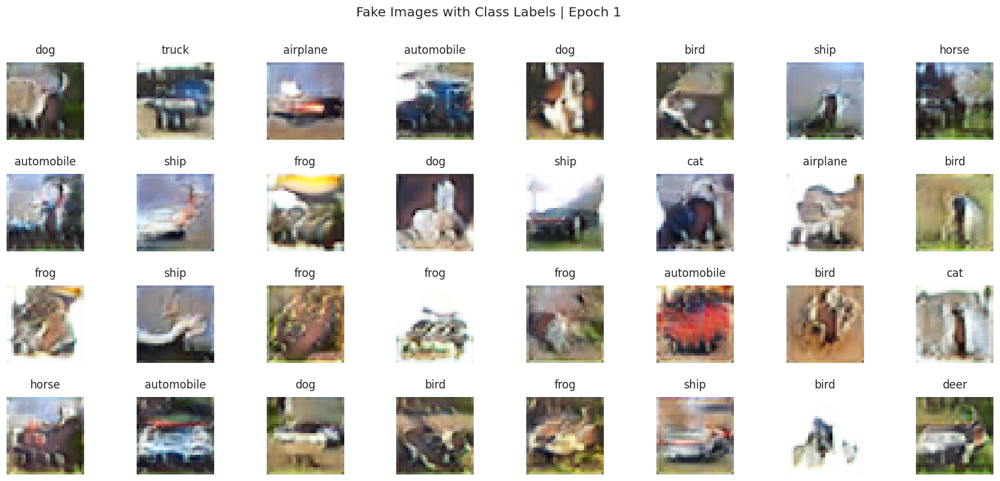

Epoch 1: FID 60.4198 | IS 4.5089
Epoch 11: FID 26.4346 | IS 7.1197


Epoch 16: 100%|██████████| 938/938 [05:57<00:00,  2.62it/s]


Generator Loss: 0.4395550489425659
Discriminator Loss: 1.8455352783203125


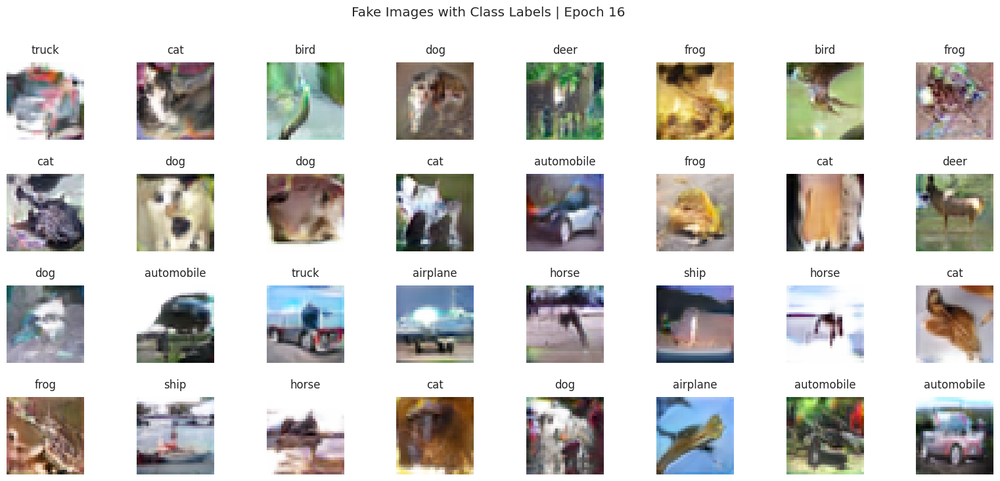

Epoch 21: FID 24.6202 | IS 7.5837


Epoch 31: 100%|██████████| 938/938 [05:57<00:00,  2.62it/s]


Generator Loss: 0.2634250521659851
Discriminator Loss: 1.5884661674499512


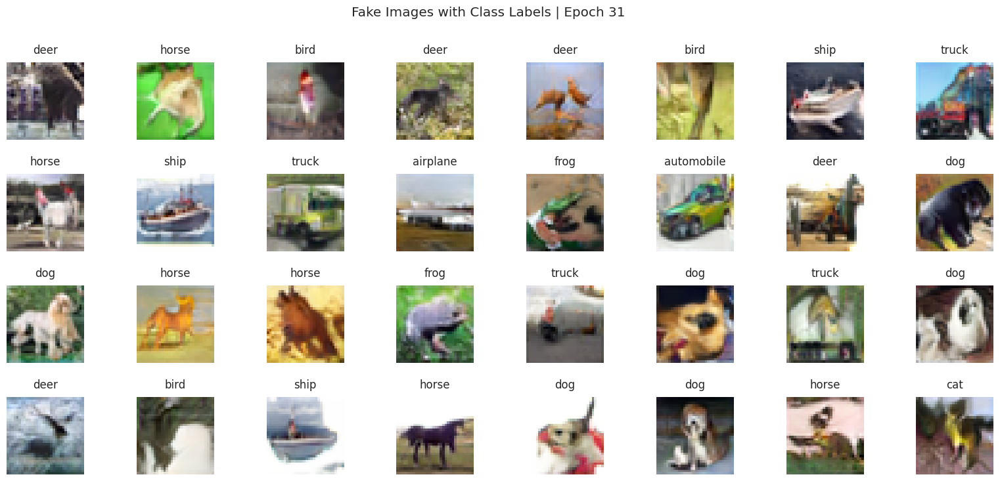

Epoch 31: FID 16.1198 | IS 7.8107
Epoch 41: FID 18.0470 | IS 7.9339


Epoch 46: 100%|██████████| 938/938 [05:57<00:00,  2.62it/s]


Generator Loss: 0.9421362280845642
Discriminator Loss: 1.518718957901001


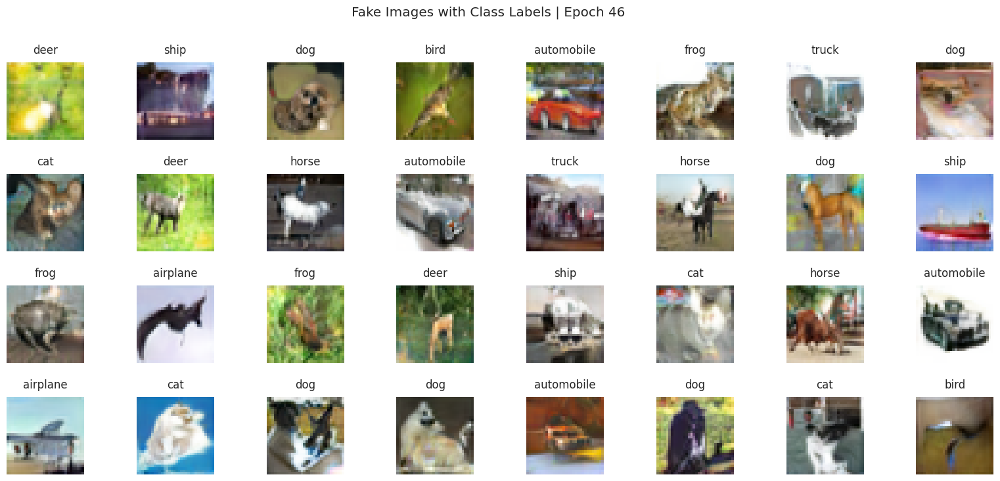

Epoch 51: FID 12.9481 | IS 8.0487


Epoch 61: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.7211667895317078
Discriminator Loss: 1.5419800281524658


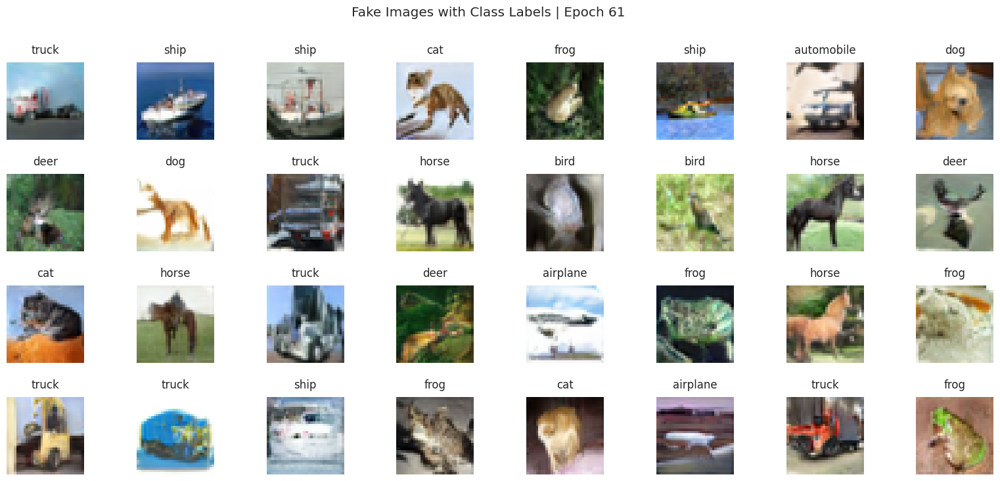

Epoch 61: FID 13.0804 | IS 7.9008
Epoch 71: FID 10.9473 | IS 8.3834


Epoch 76: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.7347412109375
Discriminator Loss: 1.5141310691833496


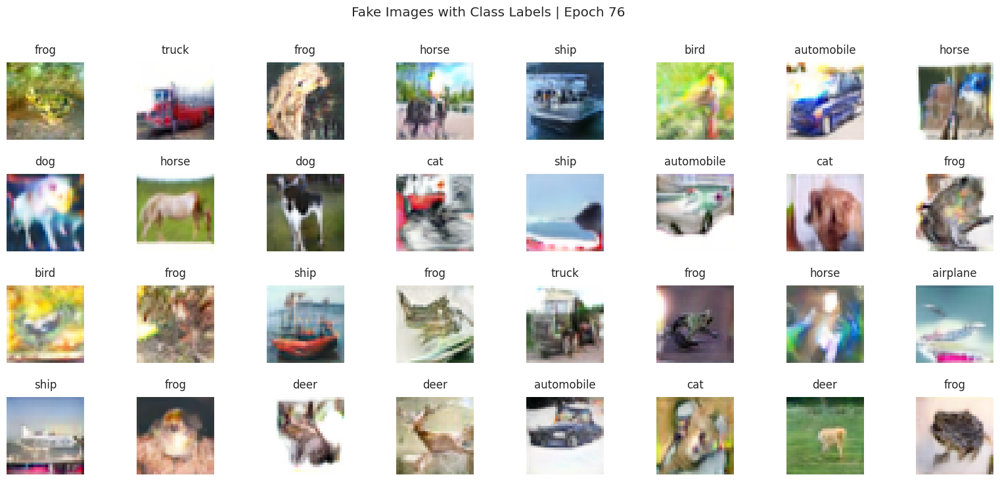

Epoch 81: FID 12.2235 | IS 8.4939


Epoch 91: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.6208212375640869
Discriminator Loss: 1.6071726083755493


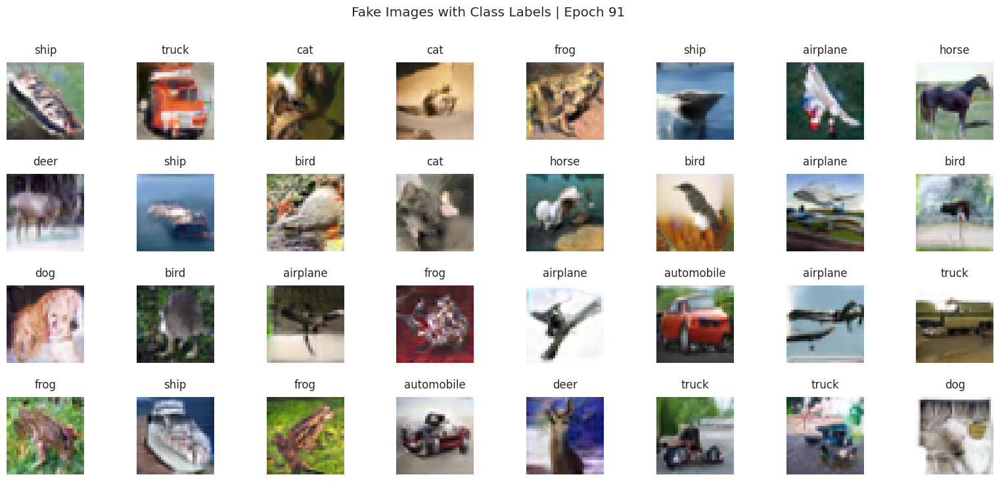

Epoch 91: FID 11.8069 | IS 8.5870
Epoch 101: FID 12.5711 | IS 8.2499


Epoch 106: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.6629228591918945
Discriminator Loss: 1.5442488193511963


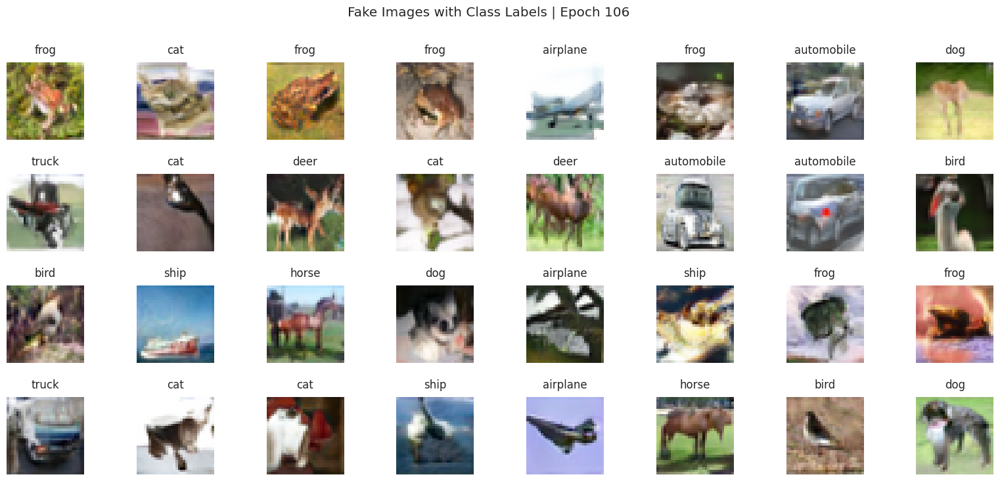

Epoch 111: FID 9.8618 | IS 8.5539


Epoch 121: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.48700836300849915
Discriminator Loss: 1.5929481983184814


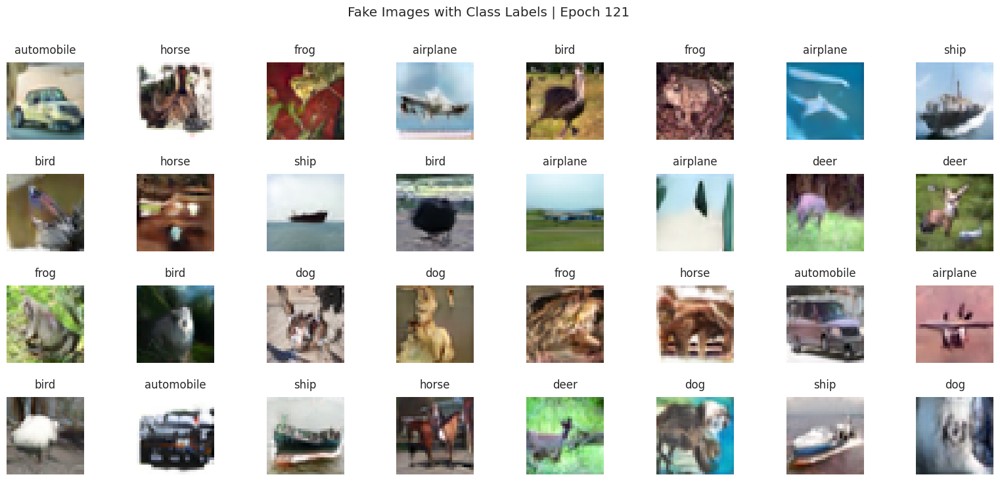

Epoch 121: FID 10.1211 | IS 8.6640
Epoch 131: FID 10.5105 | IS 8.4289


Epoch 136: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.4743961989879608
Discriminator Loss: 1.5666381120681763


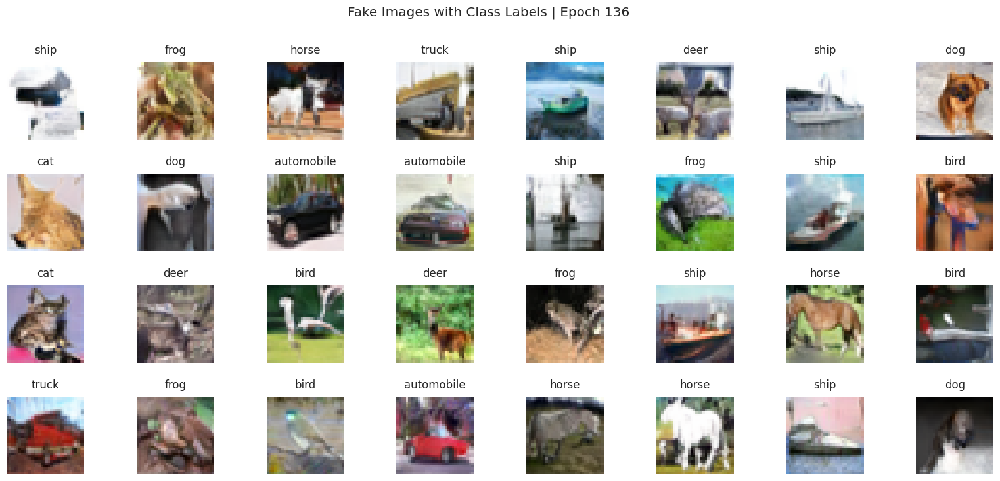

Epoch 141: FID 10.2690 | IS 8.4971


Epoch 151: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.6797256469726562
Discriminator Loss: 1.598114013671875


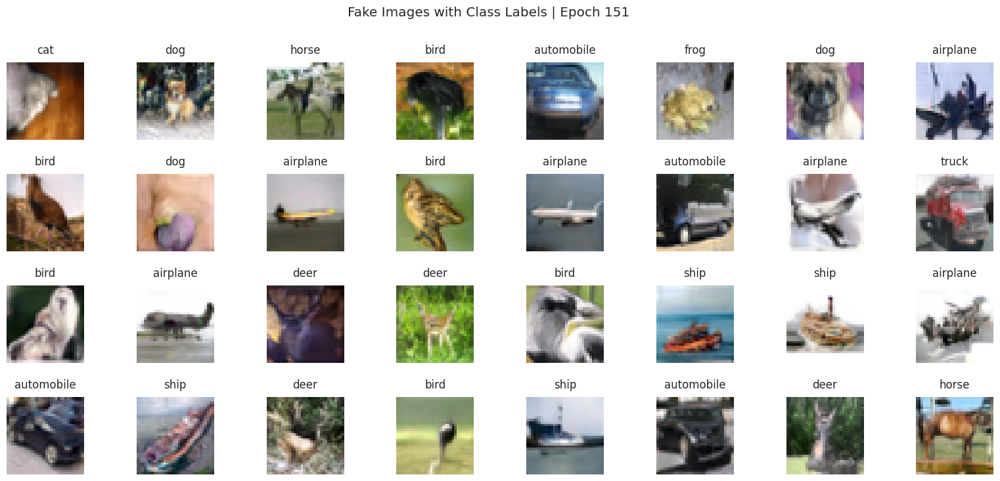

Epoch 151: FID 9.8973 | IS 8.6423
Epoch 161: FID 8.0507 | IS 8.8116


Epoch 166: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.546315610408783
Discriminator Loss: 1.5021662712097168


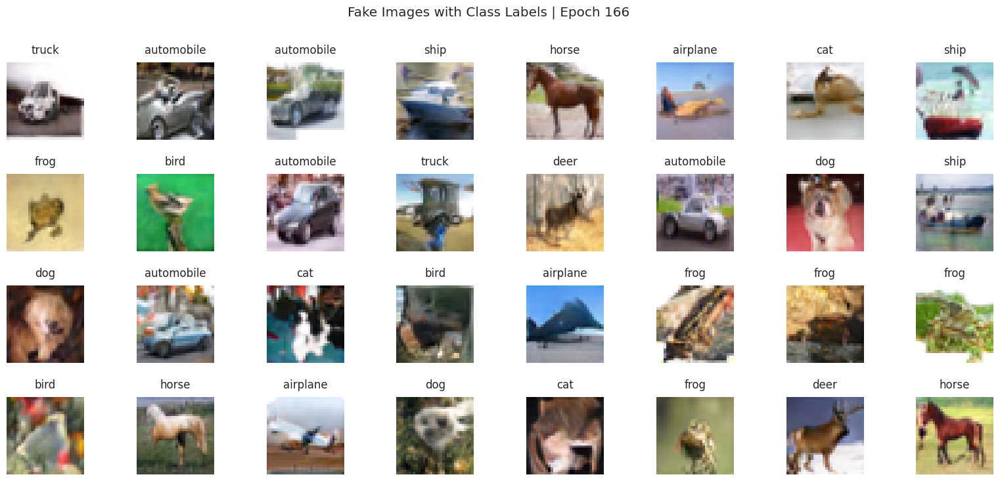

Epoch 171: FID 9.1826 | IS 8.6379


Epoch 181: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.5208810567855835
Discriminator Loss: 1.5337231159210205


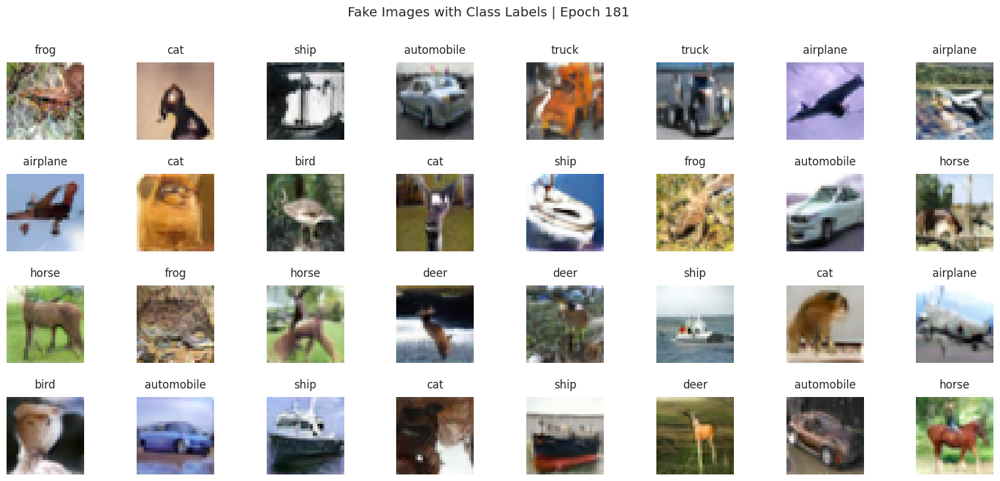

Epoch 181: FID 10.3794 | IS 8.5497
Epoch 191: FID 7.6381 | IS 8.7760


Epoch 196: 100%|██████████| 938/938 [05:58<00:00,  2.62it/s]


Generator Loss: 0.8054574728012085
Discriminator Loss: 1.637702465057373


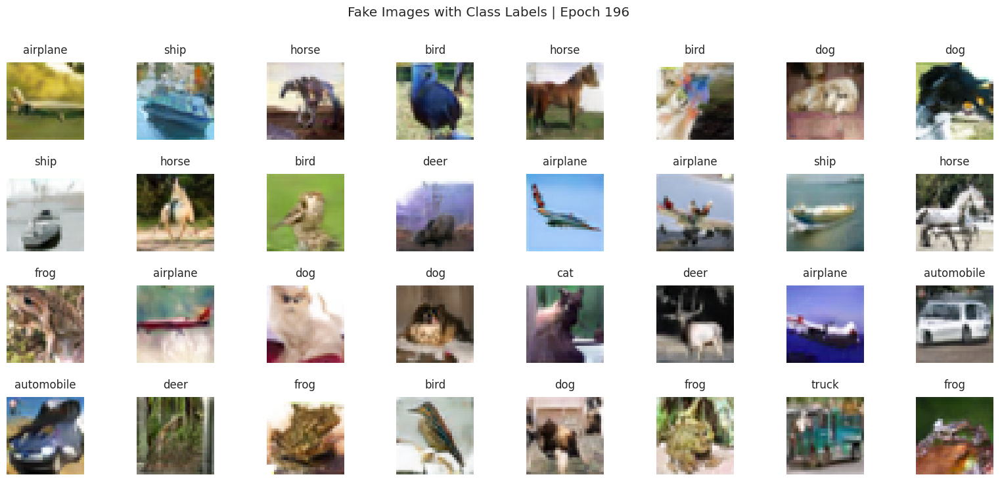

Epoch 201: FID 9.0941 | IS 8.6060


In [17]:
metrics, main_metrics = trainGAN_HingeLoss(dataloader=cifar10_dataloader,epochs=206,outputInterval=15,metricsInterval=10,netG=netG,netD=netD,z_dim=80)

In [18]:
torch.save(netG.state_dict(), "BigGAN-G-LeCam-DiffAug.pt")
torch.save(netD.state_dict(), "BigGAN-D-LeCam-DiffAug.pt")

In [19]:
def plot_metrics(metrics, metrics_main):
    # Create the figure and subplots
    fig, axs = plt.subplots(2, 2, figsize=(15,12))

    # Discriminator vs Generator Loss Graph
    sns.lineplot(data=metrics, x="epoch", y="disc_loss", label="Discriminator Loss", ax=axs[0,0])
    sns.lineplot(data=metrics, x="epoch", y="gen_loss", label="Generator Loss", ax=axs[0,0])
    axs[0,0].set_title("Discriminator vs Generator Loss Graph")
    axs[0,0].legend()
    axs[0,0].set(ylabel='Loss')

    # Inception Score Graph
    sns.lineplot(data=metrics_main, x="epoch", y="IS", label="Inception Score", color='green', ax=axs[1,0])
    max_val = metrics_main["IS"].max()
    max_index = metrics_main["epoch"][metrics_main["IS"].idxmax()]
    axs[1,0].set_title(f"Inception Score Graph - Best epoch {max_index} | Best IS {max_val:.4f}")
    axs[1,0].set(ylabel='Inception Score')
    axs[1,0].legend().remove()
    axs[1,0].axhline(y=max_val, color='r', linestyle='-.')
    axs[1,0].annotate('Epoch: {} \nMax IS: {:.4f}'.format(max_index, max_val), xy=(max_index, max_val), xytext=(max_index+5, max_val-0.8))
    axs[1,0].axvline(x=max_index, color='r', linestyle='-', ymin=0, ymax=1)

    # FID Graph
    sns.lineplot(data=metrics_main, x="epoch", y="FID", label="FID", color='green', ax=axs[1,1])
    min_val = metrics_main["FID"].min()
    min_index = metrics_main["epoch"][metrics_main["FID"].idxmin()]
    axs[1,1].set_title(f"FID Graph - Best epoch {min_index} | Best FID {min_val:.4f}")
    axs[1,1].set(ylabel='FID')
    axs[1,1].legend().remove()
    axs[1,1].axhline(y=min_val, color='r', linestyle='-.')
    axs[1,1].annotate('Epoch: {} \nMin FID: {:.4f}'.format(min_index, min_val), xy=(min_index, min_val), xytext=(min_index+5, min_val+2))
    axs[1,1].axvline(x=min_index, color='r', linestyle='-', ymin=0, ymax=1)
    plt.show()

### <a id="3_4_3"></a>3.4.3: cBigGAN++ Evaluation 🔬
- Lowest FID recorded (During Training): <ins>7.64</ins>
- Highest IS recorded (During Training): <ins>8.81</ins>

<br>


- FID Actual [60K] (After Training): **7.98**
- IS Actual [60K] (After Training): **8.7937 ± 0.0799**

<br>

- <a id="skip03_bigGAN"></a>[Click to see training process](#train03_bigGAN)



[Back to content table](#content-table)

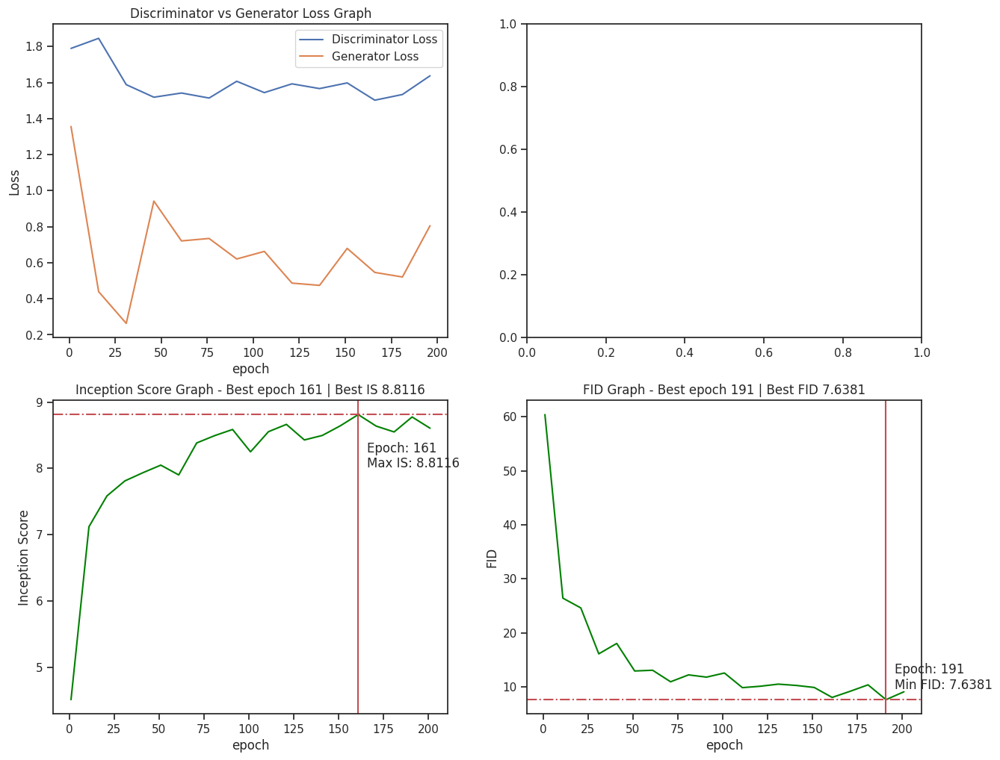

In [20]:
plot_metrics(metrics, main_metrics)

Observation:<br>

BigGAN stands out among the other models we've tried, as the bottleneck appears to be the discriminator rather than the generator. The generator is complex enough to generate realistic images even from datasets consisting of 32x32 pixels. The discriminator consistently has a much higher loss than the generator, indicating that we could potentially use a more complex discriminator with more filters, despite already updating it 5 times for every 1 generator update. The original BigGAN paper recommended at least 200,000 steps of training for CIFAR10, but my BigGAN++ model was only trained for 150,000 steps. It seems that training for more epochs could potentially lead to better IS or FID scores. Regardless, this is the best and most complex GAN model evaluated in this assignment.

**Side note: In the presentation/demo video (->`Presentation_Demo.mp4`), I will conduct a comparison and analysis of the differences observed between the BigGAN models and architectures that I have trained. I will also provide a detailed explanation for the differences observed.**

Eye Power evaluation:

<img src="images/training/fake_images_BigGAN-LeCam-DiffAug.gif" width="1000" alt='BigGAN++ Training Images'>

Observation:<br>

Even from the first epoch, the images are already distinguishable. The inception score and FID are relatively good even after just 1 epoch. By the 16th epoch, the images appear reasonable and of good quality for a GAN model. Little imagination is required to interpret the fake images, and some generated images are indistinguishable from real images even to a human discriminator (me). Overall, this GAN model in this assignment produced exceptional results, surpassing my expectations. Utilizing human evaluation to select images, we can certainly create a set of images that are indistinguishable to humans, particularly at this resolution (32x32).

### Same latent space obervation
- Eye power
- 5 frames per second (5 epochs per second) on a fixed Z value. This way we observe an objective across my training time

<img src="images/training/fixed_latent_space_evaluation.gif" width="800" alt='BigGAN++ Training Images - Same Latent Space'>

## <a id="3_4_4"></a>3.4.4: All BigGANs Evaluation 🔬
- All BigGAN generator will be loaded from `/models` folder, which are models that are trained during this assignment.
- To see all BigGAN training process visit the `/experiments` folder
<br>

[Back to content table](#content-table)

In [21]:
# Number of workers for dataloader
workers = 12

# Batch size during training
batch_size = 64

cifar10_dataloader = DataLoader(TensorDataset(cifar10_og.type('torch.FloatTensor'),cifar10_labels.type('torch.LongTensor')),batch_size=batch_size, num_workers=workers)

In [13]:
fid_model = FrechetInceptionDistance(feature=2048, normalize=True,reset_real_features=False).to(device)
for imgs, _ in tqdm(cifar10_dataloader):
    fid_model.update(imgs.to(device), real=True)

100%|██████████| 938/938 [01:15<00:00, 12.41it/s]


In [22]:
def calculate_FID_IS(generatorPath, fid_model):
    fid_model.reset()
    is_model = InceptionScore(normalize=True).to(device)
    netG = Generator(80, 128, 96, [2], 10, False).to(device)
    netG.load_state_dict(torch.load(generatorPath,map_location='cuda:0'))
    netG.eval()
    for _, labels in tqdm(cifar10_dataloader):
        labels = labels.to(device)
        z = torch.randn(labels.shape[0], 80, device=device)
        # plus 1 divide by 2 is to normalize back to 0 and 1
        fake_img = netG(z, labels).to(device)
        fid_model.update(fake_img, real=False)
        is_model.update(fake_img)
    return fid_model.compute(), is_model.compute()

#### 3.4.4.1: cBigGAN (no LeCam regularization, Ema and DiffAug) After Training IS & FID Scores

`experiments\cBigGAN.html`

- FID score: 14.5485
- Inception score: 8.3209 ± 0.0883

In [15]:
BigGAN_FID, BigGAN_IS = calculate_FID_IS('models/BigGAN_G.pt', fid_model)

display(BigGAN_FID, BigGAN_IS)

C:\Users\quahj\anaconda3\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
100%|██████████| 938/938 [02:52<00:00,  5.43it/s]


tensor(14.5485, device='cuda:0')

(tensor(8.3209, device='cuda:0'), tensor(0.0883, device='cuda:0'))

#### 3.4.4.2: cBigGAN - LeCam (no DiffAug) After Training IS & FID Scores

`experiments\cBigGAN-LeCam.html`

- FID score: 13.6340
- Inception score: 8.2794 ± 0.0812

In [16]:
BigGAN_LeCam_FID, BigGAN_LeCam_IS = calculate_FID_IS('models/BigGAN_G-LeCam.pt', fid_model)

display(BigGAN_LeCam_FID, BigGAN_LeCam_IS)

100%|██████████| 938/938 [02:59<00:00,  5.22it/s]


tensor(13.6340, device='cuda:0')

(tensor(8.2794, device='cuda:0'), tensor(0.0812, device='cuda:0'))

#### *3.4.4.3: cBigGAN - LeCam + DiffAug After Training IS & FID Scores

`experiment is shown in this report see` [#3.4.2](#3_4_2)

- FID score: **7.9819**
- Inception score: **8.7937 ± 0.0799**

In [23]:
BigGAN_LeCam_DiffAug_FID, BigGAN_LeCam_DiffAug_IS = calculate_FID_IS('models/BigGAN-G-LeCam-DiffAug.pt', fid_model)

display(BigGAN_LeCam_DiffAug_FID, BigGAN_LeCam_DiffAug_IS)

/opt/conda/lib/python3.10/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `InceptionScore` will save all extracted features in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
100%|██████████| 938/938 [02:04<00:00,  7.53it/s]


tensor(7.9819, device='cuda:0')

(tensor(8.7937, device='cuda:0'), tensor(0.0799, device='cuda:0'))

# <a id="4_0"></a>4.0: Image Generation & Discussion 🤓

## <a id="4_1"></a>4.1: Selective Generation - Truncation Trick 🤓

Food for thought: How do I generate high quality images using the trained model that I have?

Implementating my version of truncation trick :<br>
I plan to utilize intra-class FID by updating an FID model (Inception Model) with the class of frogs, for example. Then, I will generate 1000 images of frogs and select the ones with the lowest FID to ensure high quality.

In summary, the truncation trick can artificially decrease FID scores and improve the quality of generated images by discarding those with high FID. However, it often comes at the cost of increased computation power and decreased image diversity. To maintain diversity, we could incorporate inception score into truncation trick.

[Back to content table](#content-table)

### 4.1.1: Functions & Loading Generator

loading trained generator (BigGAN++)

In [13]:
netG = Generator(80, 128, 96, [2], 10, False)

netG.load_state_dict(torch.load('models/BigGAN-G-LeCam-DiffAug.pt',map_location=device))
netG = netG.to(device)

My version of truncation trick

In [15]:
def generateImg(netG,class_,img_count,batch=100):
    # Set generator to evaluate
    netG.eval()
    # Create Dataloader of `class_`
    indices = np.where(cifar10_labels == class_)
    intra_cifar10 = cifar10_og[indices]
    intra_cifar10_labels = cifar10_labels[indices]
    cifar10_dataloader = DataLoader(TensorDataset(intra_cifar10.type('torch.FloatTensor'),intra_cifar10_labels.type('torch.LongTensor')),batch_size=128,shuffle=False, num_workers=16)
    # Create labels containing only `class_`
    labels = torch.tensor(class_, dtype=torch.long).expand(batch).to(device)
    # Init FID model (inception model)
    fid_model = FrechetInceptionDistance(feature=2048, normalize=True,reset_real_features=False).to(device)
    # Update and cache real images of `class_`
    for imgs, _ in tqdm(cifar10_dataloader):
        fid_model.update(imgs.to(device), real=True)
    # Init empty torch tensor of shape 0x3x32x32
    img_batch = torch.empty(0, 3, 32, 32)
    # Loop for truncation trick
    for _ in tqdm(range(int(img_count/5))):
        # Generator images of `class_` with size `batch`
        fid_min = 9999
        min_ = 0
        z = torch.randn(batch, 128).to(device)
        fake_imgs = netG(z, labels).to(device)
        # Select and keep best 5 images from our generated images
        for i in range(int(fake_imgs.shape[0]/5)):
            fid_model.reset()
            fid_model.update(fake_imgs[i*5:(i+1)*5], real=False)
            fid = float(fid_model.compute())
            if fid < fid_min:
                min_ = i
                fid_min = fid
        img_batch = torch.cat([img_batch,fake_imgs[min_*5:(min_+1)*5].detach().cpu()], dim=0)
        del fake_imgs, fid_min, fid, z
    # Return our generated images after truncation trick
    return img_batch

In [16]:
def saveImg(imgTensor, class_):
    # Create a figure and axis to hold the grid of images
    fig, axes = plt.subplots(10, 10, figsize=(32, 32))

    # Iterate through the images in the tensor
    for i in range(100):
        # Normalize the image generated to 0 to 1
        img = imgTensor[i]
        min_val = torch.min(img)
        max_val = torch.max(img)
        img = (img - min_val) / (max_val - min_val)
        # Get the i-th image from the tensor
        # Get the x and y coordinates of the current image in the grid
        x = i % 10
        y = i // 10
        # Display the image on the current axis
        axes[y, x].imshow((img.detach().cpu().permute(1, 2, 0)))
        # Remove the axis labels
        axes[y, x].axis("off")

    # Set the title of the grid
    fig.suptitle(f'{class_labels[class_]} (Generated)', fontsize=32)
    
    # Save figure
    plt.savefig(f"images/submission/GAN_100_Generated_{class_labels[class_]}")
    # Show the grid of images
    plt.show()
    
    print(f'100 images of {class_labels[class_]} has been generated and saved to images/submission/GAN_100_Generated_{class_labels[class_]}')

### 4.1.2: Generating and Saving images

Airplane Label 0

In [26]:
airplanes = generateImg(netG,0,100,300)

100%|██████████| 20/20 [1:36:16<00:00, 288.81s/it]


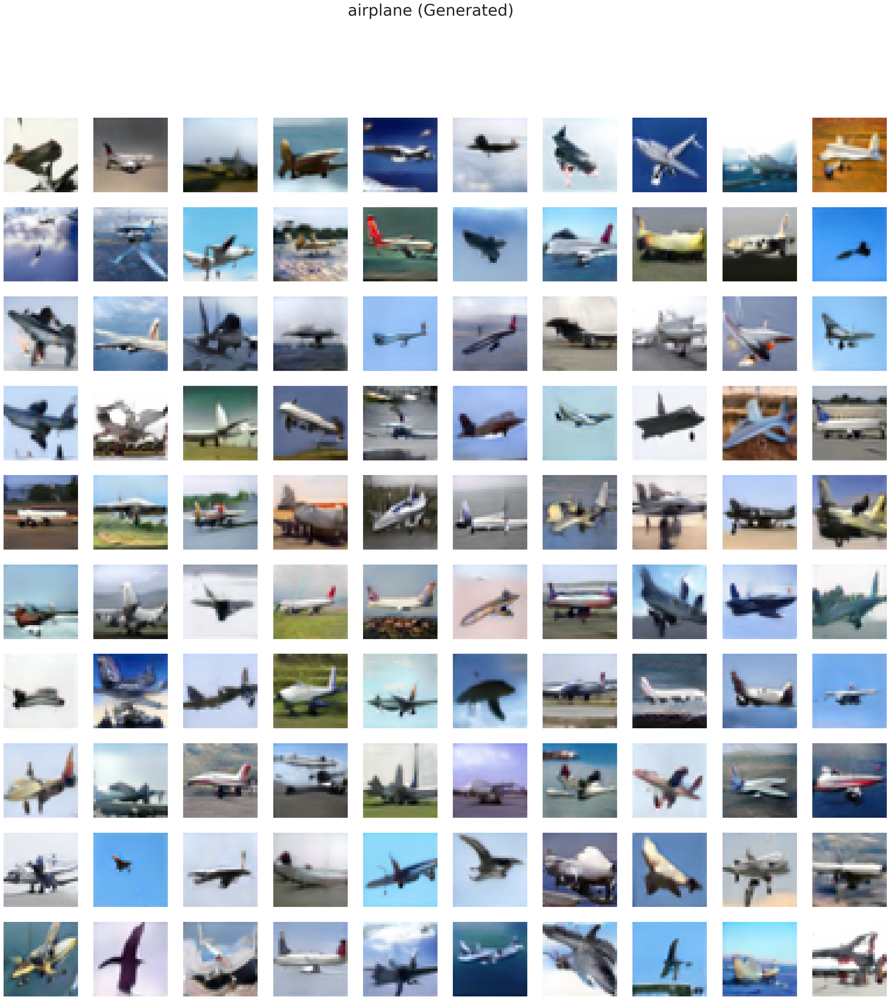

100 images of airplane has been generated and saved to images/submission/GAN_100_Generated_airplane


In [27]:
saveImg(airplanes, 0)

Automobile Label 1

In [17]:
automobile = generateImg(netG,1,100,300)

100%|██████████| 20/20 [1:35:10<00:00, 285.50s/it]


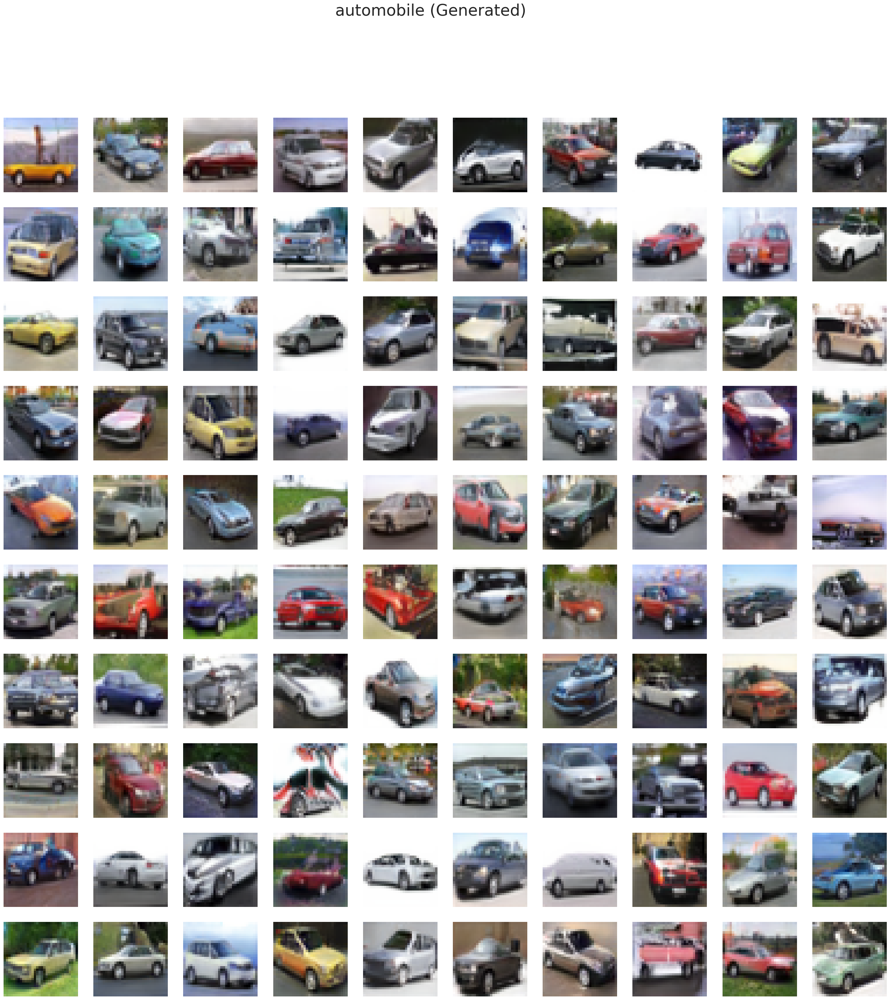

100 images of automobile has been generated and saved to images/submission/GAN_100_Generated_automobile


In [18]:
saveImg(automobile, 1)

Bird Label 2

In [19]:
bird = generateImg(netG,2,100,300)

100%|██████████| 20/20 [1:35:06<00:00, 285.34s/it]


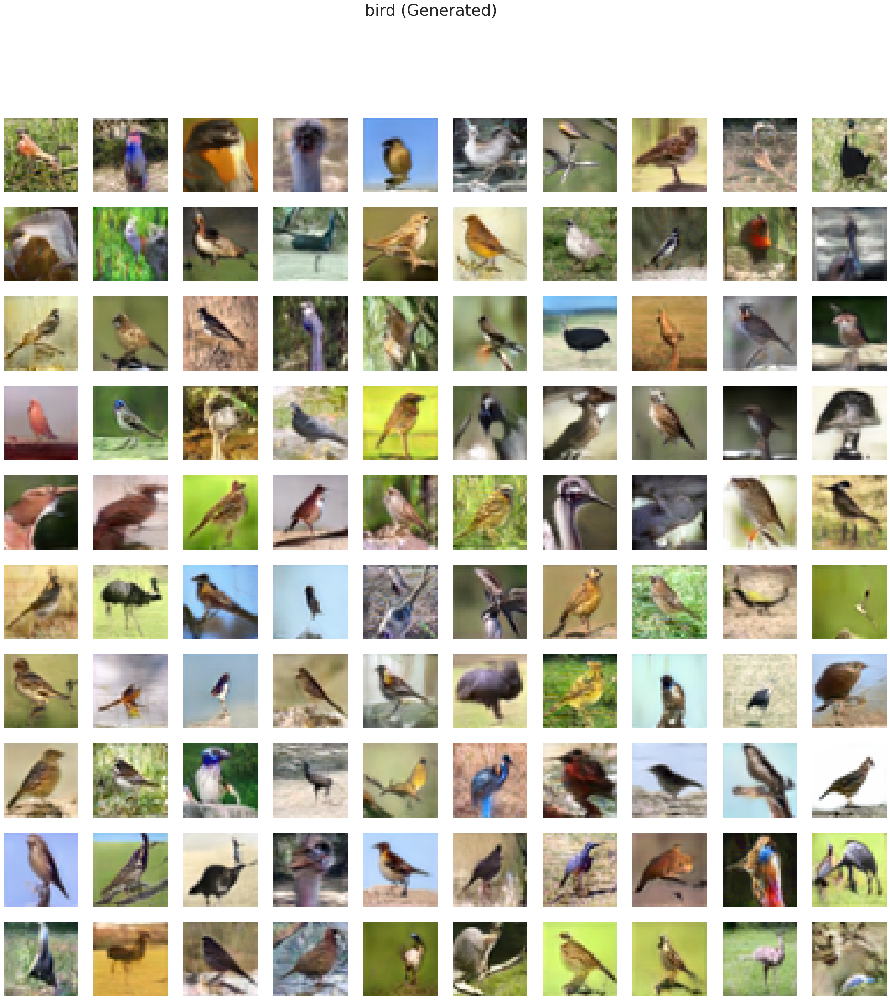

100 images of bird has been generated and saved to images/submission/GAN_100_Generated_bird


In [20]:
saveImg(bird, 2)

Cat Label 3

In [24]:
cat = generateImg(netG,3,100,300)

100%|██████████| 20/20 [1:38:09<00:00, 294.46s/it]


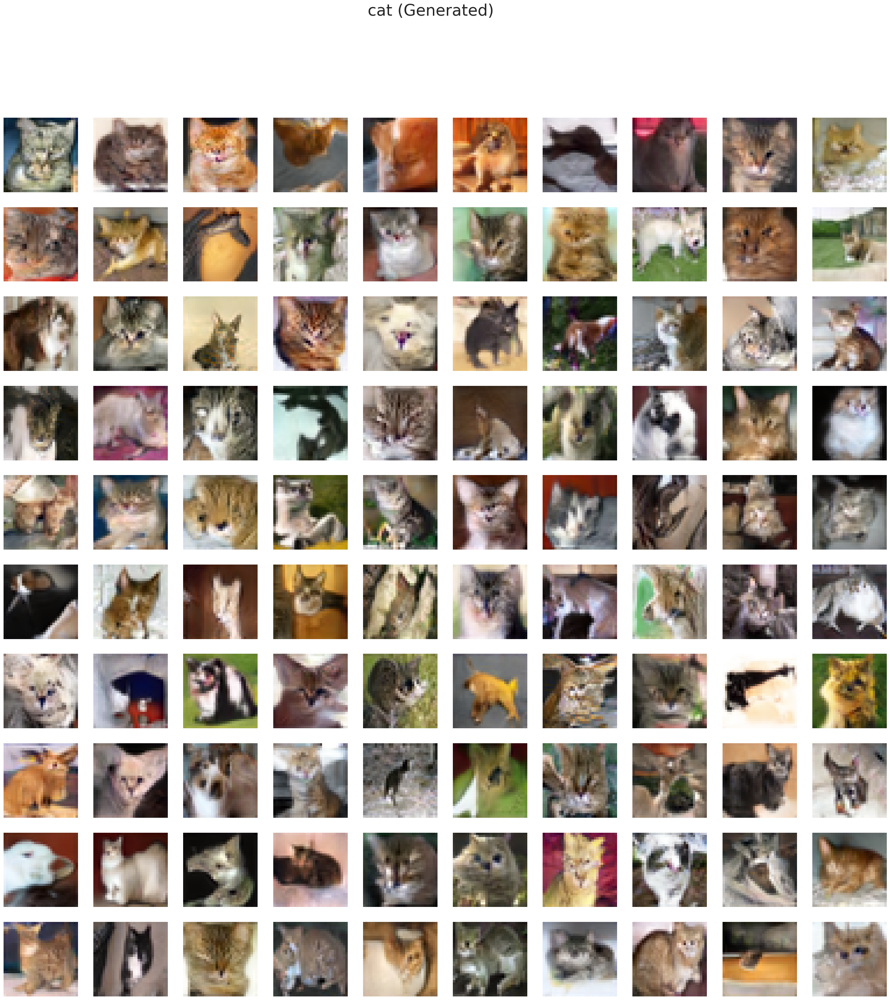

100 images of cat has been generated and saved to images/submission/GAN_100_Generated_cat


In [25]:
saveImg(cat, 3)

Deer Label 4

In [18]:
deer = generateImg(netG,4,100,300)

100%|██████████| 20/20 [1:35:31<00:00, 286.59s/it]


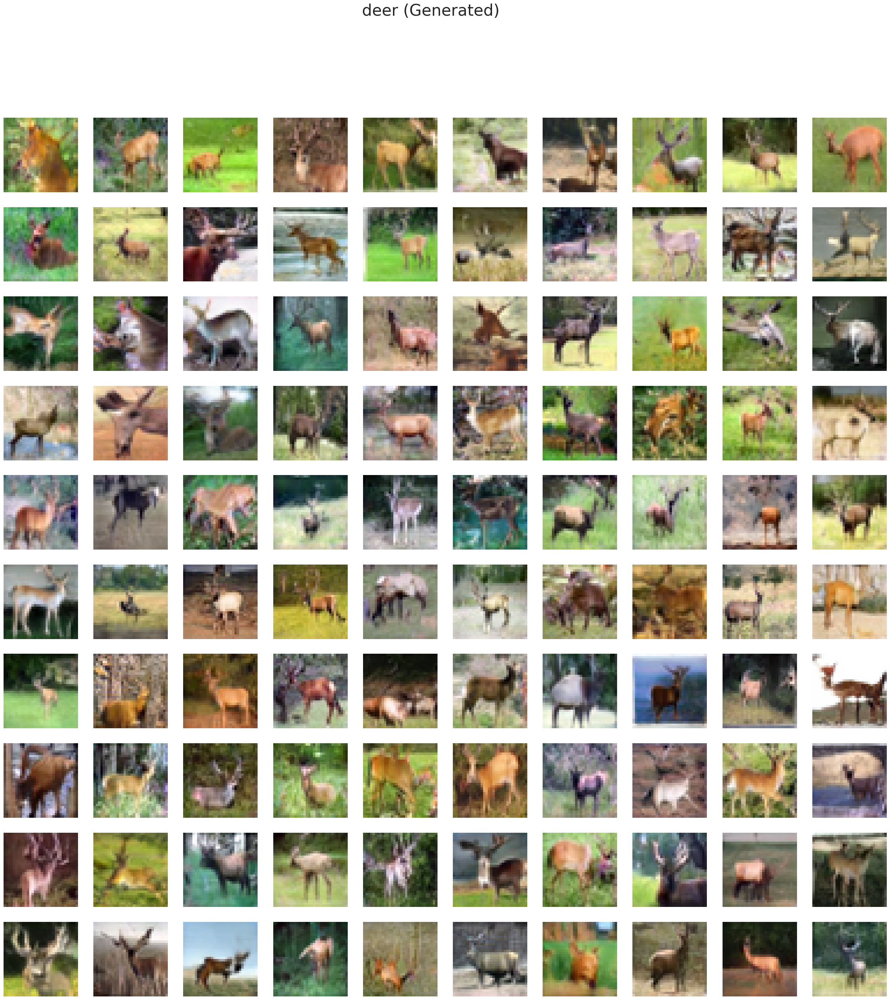

100 images of deer has been generated and saved to images/submission/GAN_100_Generated_deer


In [19]:
saveImg(deer, 4)

In [20]:
dog = generateImg(netG,5,100,300)

100%|██████████| 20/20 [1:35:42<00:00, 287.11s/it]


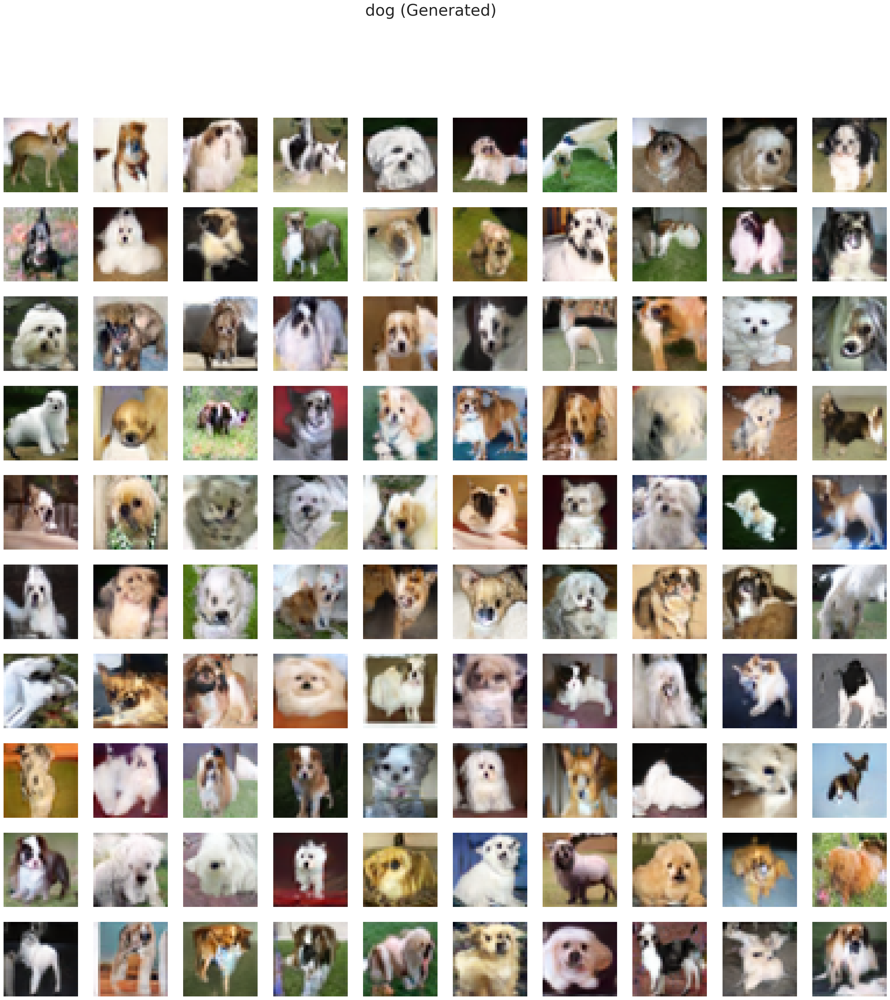

100 images of dog has been generated and saved to images/submission/GAN_100_Generated_dog


In [21]:
saveImg(dog, 5)

In [22]:
frog = generateImg(netG,6,100,300)

100%|██████████| 20/20 [1:36:47<00:00, 290.37s/it]


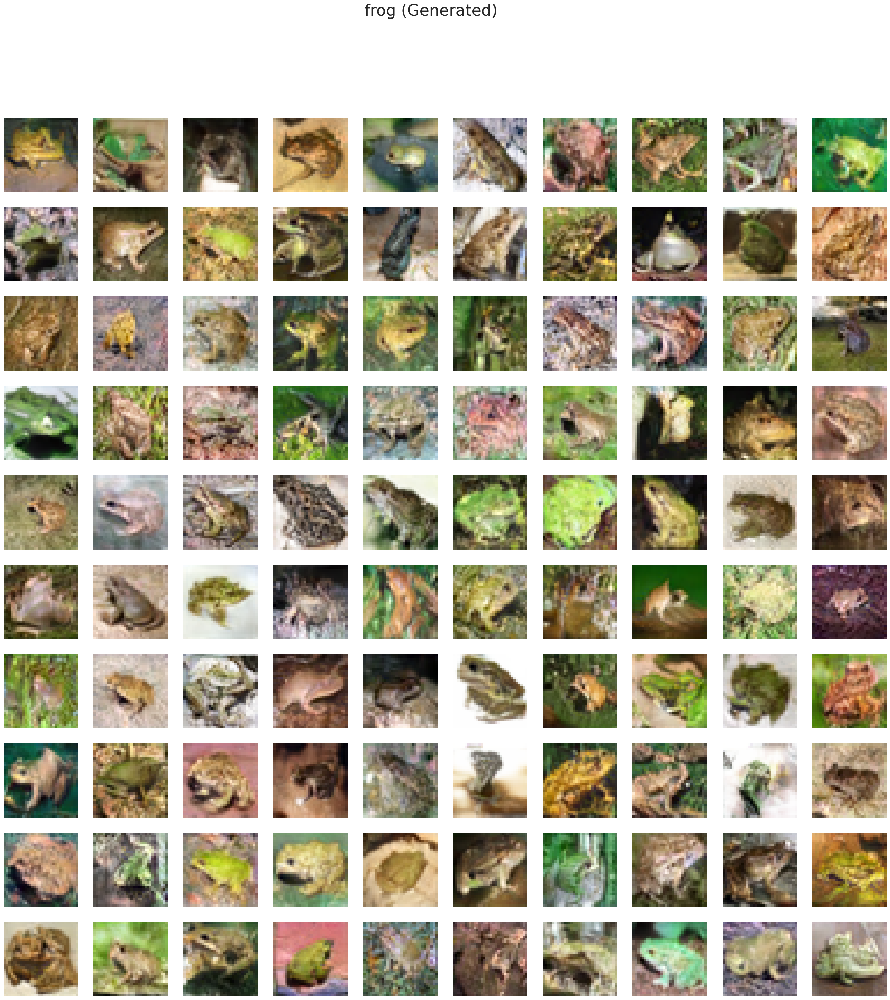

100 images of frog has been generated and saved to images/submission/GAN_100_Generated_frog


In [23]:
saveImg(frog, 6)

In [17]:
horse = generateImg(netG,7,100,300)

C:\Users\quahj\anaconda3\lib\site-packages\torch\utils\data\dataloader.py:554: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12 (`cpuset` is not taken into account), which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100%|██████████| 20/20 [1:43:02<00:00, 309.14s/it]


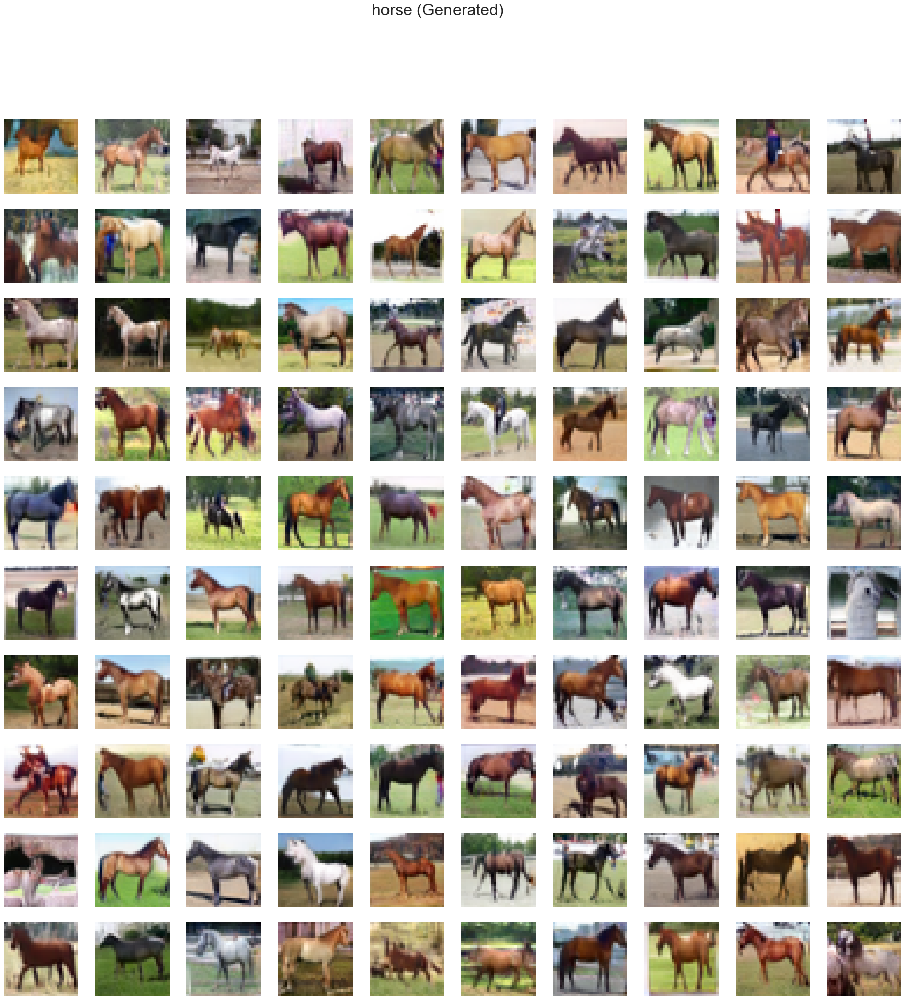

100 images of horse has been generated and saved to images/submission/GAN_100_Generated_horse


In [18]:
saveImg(horse, 7)

In [19]:
ship = generateImg(netG,8,100,250)

100%|██████████| 20/20 [1:39:31<00:00, 298.57s/it]


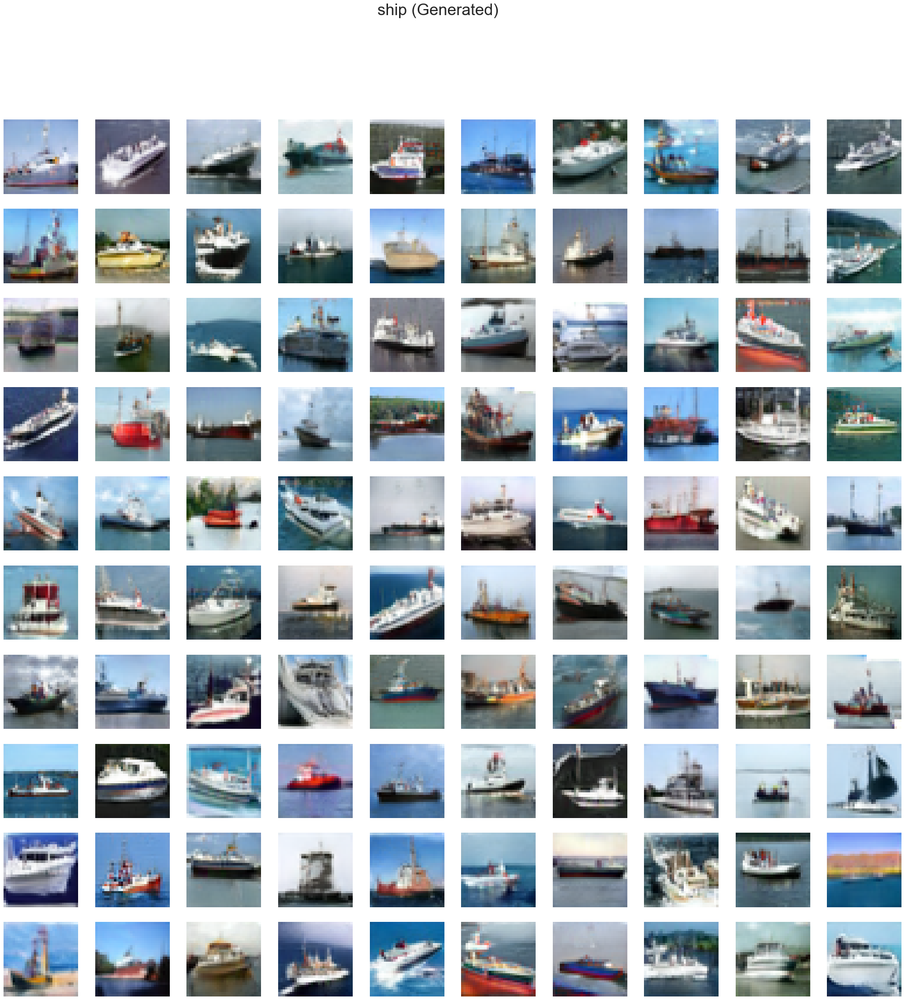

100 images of ship has been generated and saved to images/submission/GAN_100_Generated_ship


In [19]:
saveImg(ship, 8)

In [21]:
truck = generateImg(netG,9,100,300)

100%|██████████| 20/20 [1:39:32<00:00, 298.65s/it]


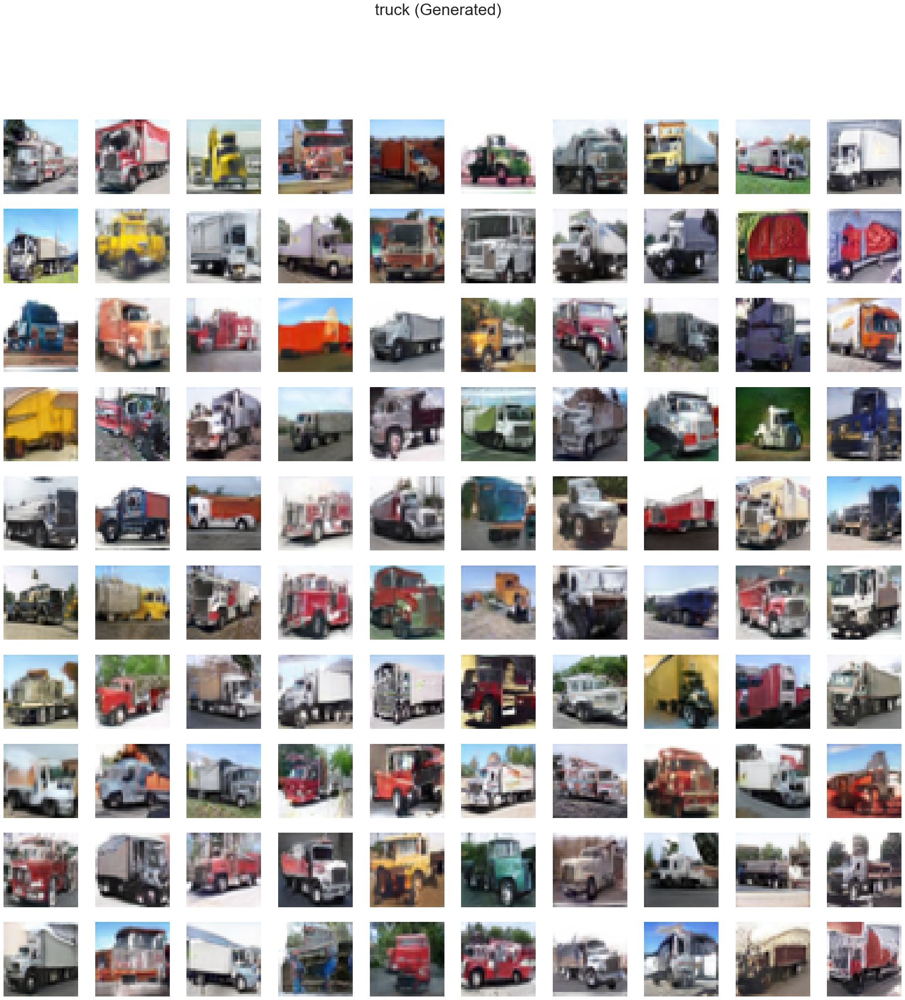

100 images of truck has been generated and saved to images/submission/GAN_100_Generated_truck


In [22]:
saveImg(truck, 9)

## <a id="4_2"></a>4.2: Summary 🏁

[Back to content table](#content-table)

In this assignment, I progressed through creating various GAN models, beginning with simple ones and gradually increasing their complexity. Through the process, I was able to improve the quality of my GAN-generated images from poor to good. Techniques such  as enhancing the complexity of the model through more complex architectures were employed to achieve this improvement. The approach I used to improve my GAN models was more of a 'horizontal' improvement, where I employed advanced architectures and methodologies, rather than a 'vertical' improvement, which would have involved fine-tuning hyperparameters, an approach that can be highly inefficient in the context of GANs, nonetheless, I still managed to try many different architecture and loss functions to archieve better results. Furthermore, evaluation metrics such as inception score and FID were utilized to gauge the quality of the generated images and guide decisions on how to further improve the models. Truncation trick were also employed to select high-quality images. Overall, the assignment was a journey of learning and experimentation with GANs, aimed at achieving superior image generation results.

Referencing back to my initial problem statement, I have successfully generated 1,000 realistic images using the CIFAR10 dataset, which can be utilized for various purposes such as company advertisements or video game design. Note that if I handpicked all 1,000 images I can perhaps create a dataset that is of much higher quality and indistinguishable from real and fake images.

Food for thought 🤔: Are AI-generated images that are unique legally compliant in terms of copyright issues? Artists often use other people's images as references and learn through practice and observation, regardless of whether the referenced image is copyrighted or not. On the other hand, AI uses data science and mathematics to perform the same tasks. This raises the question of whether the end result, unique never-before-seen AI-generated images, is ethical if the dataset used to train the model consists of originally copyrighted images. - (Of course this issue doesnt apply to my assignment since CIFAR10 is open-source for everyone to use)